In [3]:
# next steps in analysing an comparison of different plots

# [] create the histogram plot
# [] take spots that are 2.0+ 
# 

In [4]:
# want to see the images inline
%matplotlib inline

# imports
# general 
import os
import glob
from functools import reduce
import re
import csv as csv
# scientific 
import matplotlib.pyplot as plt
import numpy as np
from sklearn import linear_model, datasets
from scipy.stats import norm, gamma
from scipy.optimize import curve_fit
from scipy import special

import pandas as pd

from sklearn.metrics import mean_squared_error, mean_absolute_error

In [5]:
# function for loading one data-set
def load_data(file_path, skiprows_=0):
    data = np.loadtxt(file_path, delimiter = '\t', skiprows=skiprows_)
    # print(data.shape) 
    # handles some weird cases, e.g. when there is no data in the file
    if (len(data.shape) < 2):
        data = data[None, :]
    if (data.shape[1] == 0):
        I = np.array([0])
    else:
        I = data[:, -1]
    return I

In [6]:
# some folder magic 
# folder = '/Volumes/1TB/2018-05-15-12-30-27-SEA12-full-stack/' # folder contains z-corrected spots 
folder = '/Users/kkolyva/Downloads/2018-09-11-11-12-10-clean-up/2018-07-31-09-53-32-N2-all-results-together/'
if (not os.path.exists(folder)):
    print("Oups, the path is wrong")

In [7]:
# some const params for all graphs
num_bins = 100; 
# graph [xmin, xmax]
xmin = 0
xmax = 3

binwidth = (xmax - xmin)/(num_bins - 1)

In [8]:
bins = np.arange(xmin, xmax + binwidth, binwidth)
print ('bins: ', bins.shape)

bins:  (100,)


I_min: -0.11 I_max: 2.68
30.0939389688 -0.990314914834 0.0692449738796
peak center: 1.02402402402


(0, 3)

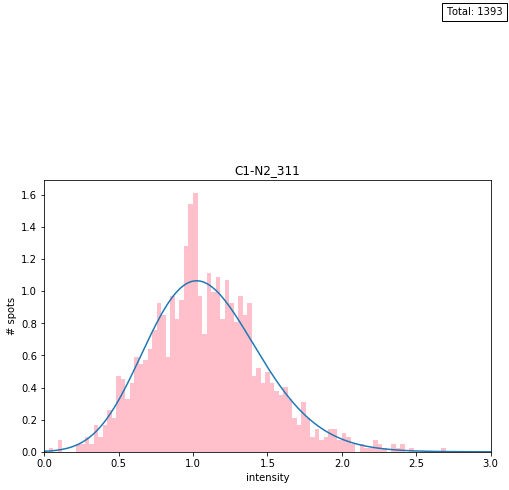

In [9]:
# for testing 
filename = 'C1-N2_311'
filepath =  folder + "csv-2/" + filename + '.csv'
I = load_data(filepath)

fig = plt.figure(figsize=(8,5))
title = 'C1-N2_311'
plt.title(title)
    
plt.xlabel('intensity')
plt.ylabel('# spots')

print("I_min:", min(I), "I_max:", max(I))

I_res = I
fit_alpha, fit_loc, fit_beta = gamma.fit(I_res)
print(fit_alpha, fit_loc, fit_beta)

plt.hist(I, bins=bins, color='pink', normed=True); # 
# plt.text(0.9*xmax, 0.1, "Total: " + str(I.shape[0]), color='black', bbox=dict(facecolor='white', alpha=1))

info_text = "Total: " + str(I.shape[0])

x_limits = [xmin, xmax]
ymax = np.max(np.histogram(I, bins)[0])
y_limits = [0, ymax]

plt.text(x_limits[1] - (x_limits[1] - x_limits[0])*0.1, y_limits[0] + (y_limits[1] - y_limits[0])*0.04, info_text, color='black', bbox=dict(facecolor='white', alpha=1))
   

x = np.linspace(xmin, xmax, 1000)
y = gamma.pdf(x, fit_alpha, fit_loc, fit_beta)
plt.plot(x,y)

print("peak center:", x[np.argmax(y)])

plt.xlim([xmin, xmax])

# plt.legend(loc = 'upper right')

In [10]:
# possible labels 
stain = ['DPY-23_EX', 'WDR-5.2', 'MDH-1']
stage = 'E' # only embryos
comment = '' # only empty ones

In [11]:
# important indices
stain_columns = ['C0_stain', 'C1_stain', 'C2_stain', 'C3_stain', 'C4_stain']
type_columns = ['C0_type', 'C1_type', 'C2_type', 'C3_type', 'C4_type']
stain_prefix = np.array([['C1-', 'C2-', 'C3-', 'C4-', 'C5-']])
ext = '.csv'
filename_column = 'new filename'

In [12]:
# read the db and parse images that we want to process
df = pd.read_csv(folder + "smFISH-database/N2-Table 1.csv", sep=',', na_values=['']);
df.head()

,Line,ID,C0_lambda,C0_stain,C0_type,C1_lambda,C1_stain,C1_type,C2_lambda,C2_stain,...,comment,date,original filename,new filename,#nuclei,#C0_smfish,#C1_smfish,#C2_smfish,#C3_smfish,#C4_smfish
0,N2,1.0,670.0,FISH,DPY-23_EX,488.0,AF,NaN,405.0,NUCLEAR,...,not complete,11/17/2016,2016-11-17_N2-DPY-23-001.nd2,N2_1,2.0,NaN,NaN,NaN,NaN,NaN
1,N2,2.0,670.0,FISH,DPY-23_EX,488.0,AF,NaN,405.0,NUCLEAR,...,dirt,11/17/2016,2016-11-17_N2-DPY-23-002.nd2,N2_2,4.0,NaN,NaN,NaN,NaN,NaN
2,N2,3.0,670.0,FISH,DPY-23_EX,488.0,AF,NaN,405.0,NUCLEAR,...,"dirt, not complete",11/17/2016,2016-11-17_N2-DPY-23-003.nd2,N2_3,1.0,NaN,NaN,NaN,NaN,NaN
3,N2,4.0,670.0,FISH,DPY-23_EX,488.0,AF,NaN,405.0,NUCLEAR,...,NaN,11/17/2016,2016-11-17_N2-DPY-23-004.nd2,N2_4,1.0,NaN,NaN,NaN,NaN,NaN
4,N2,5.0,670.0,FISH,DPY-23_EX,488.0,AF,NaN,405.0,NUCLEAR,...,not complete,11/17/2016,2016-11-17_N2-DPY-23-005.nd2,N2_5,3.0,NaN,NaN,NaN,NaN,NaN


In [13]:
# this is general
# filter to have only *good* and *embryo* files
good_indices = np.logical_and((df['stage'] == stage).tolist() , (df['comment'].isnull()).tolist())
good_indices.shape[0]


print(np.sum(good_indices == True))

596


In [14]:
# choose necessary stains
dataset1 = []
df_good = (df[type_columns].astype(np.object) == stain[0]).loc[good_indices, :]
row, col = np.where(df_good)
n_samples = df.shape[0]
new_prefix = np.repeat(stain_prefix, n_samples, axis=0)[row, col]
new_filename = df[filename_column].loc[good_indices].as_matrix()[row]
dataset1 = ["{}{}".format(a_, b_) for a_, b_ in zip(new_prefix, new_filename)]

In [15]:
def create_title(path, name_id=-1):
    # get the name of the initial image
    image_name = path.split("/")[name_id] # was 8
    # print(path.split("/"))
    # create the full title 
    title = image_name[:-4]
    return title
# create_title("/Users/kkolyva/Desktop/n2/N2-results/all/C1-N2_9.csv")

In [16]:
labels = ['DPY-23_EX'] # ['DPY-23_EX', 'WDR-5.2', 'MDH-1']
color = '#BA5536'
if labels[0] == 'MDH-1':
    color = "#693D3D"

In [17]:
# actual plotting 
dataset_to_use = dataset1
if labels[0] == 'MDH-1':
    dataset_to_use = dataset3
    
dataset = []
p_dataset = []
for j in range(0, len(dataset_to_use)):
    tmp = folder + "csv-2/" + dataset_to_use[j] + ".csv"
    dataset.append(tmp)
    print(tmp)

/Users/kkolyva/Downloads/2018-09-11-11-12-10-clean-up/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_9.csv
/Users/kkolyva/Downloads/2018-09-11-11-12-10-clean-up/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_16.csv
/Users/kkolyva/Downloads/2018-09-11-11-12-10-clean-up/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_17.csv
/Users/kkolyva/Downloads/2018-09-11-11-12-10-clean-up/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_23.csv
/Users/kkolyva/Downloads/2018-09-11-11-12-10-clean-up/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_25.csv
/Users/kkolyva/Downloads/2018-09-11-11-12-10-clean-up/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_27.csv
/Users/kkolyva/Downloads/2018-09-11-11-12-10-clean-up/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_29.csv
/Users/kkolyva/Downloads/2018-09-11-11-12-10-clean-up/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_51.csv
/Users/kkolyva/Downloads/2018-09-11-11-12-10-clean-up/2018-07-31-

In [18]:
# how good is fitter-meter?
def fitter_meter(y, y_hat):
    return [mean_absolute_error(y,y_hat), np.sqrt(mean_squared_error(y,y_hat))]

In [25]:
def get_info(total, mean, l1, l2, I_above):
    info_text = "Total: " + str(total) + "\n" + "Peak: " +  str('%.2f' % mean) + "\n" + "L1: " + str('%.2f' % l1) + "\n" + "L2: " +  str('%.2f' % l2)  + "\n" + "I > th: " + str(I_above)
    # info_text = "Total: " + str(I.shape[0]) + "\n" + "Peak: " +  str('%.2f' % real_bins[np.argmax(yhat)]) + "\n" + "L1: " + str('%.2f' % error[0]) + "\n" + "L2: " +  str('%.2f' % error[1]) 
    return info_text
get_info(122, 0.99, 0.2223, 0.53341, 10)

'Total: 122\nPeak: 0.99\nL1: 0.22\nL2: 0.53\nI > th: 10'

error: L1, L2 [5.8137559394590355, 9.6270493855009516]
peak center: 0.969696969697


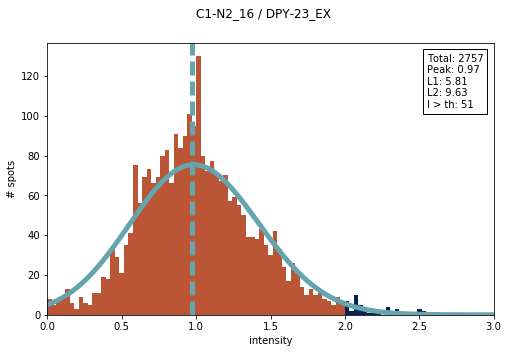

error: L1, L2 [7.3264346384305332, 10.869574495343503]
peak center: 0.969696969697


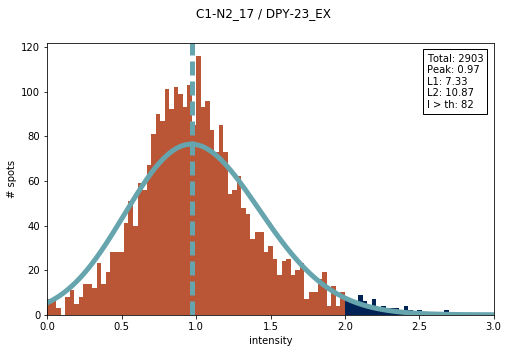

error: L1, L2 [2.4414660932230405, 4.8398492027157678]
peak center: 0.939393939394


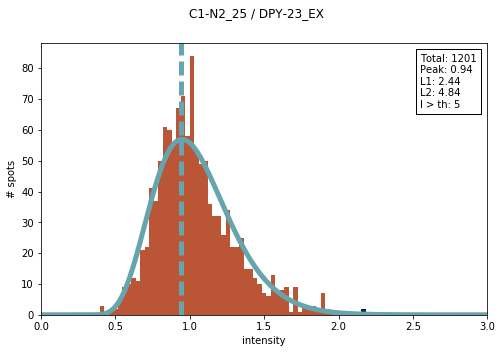

error: L1, L2 [5.46040685157553, 9.5881534307749909]
peak center: 0.969696969697


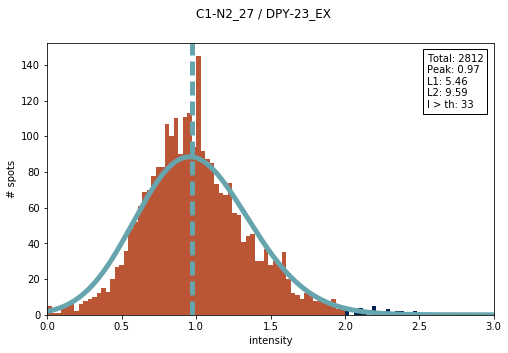

error: L1, L2 [7.0376574335302067, 11.411277282849506]
peak center: 1.0


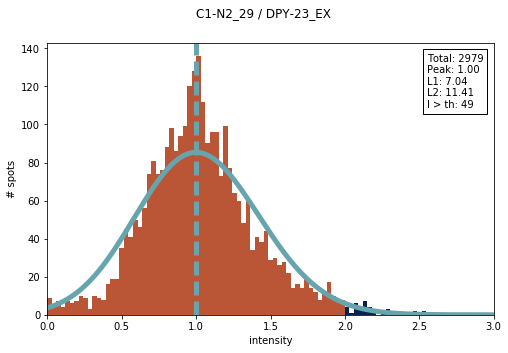

error: L1, L2 [3.8931396922297301, 7.556896785975276]
peak center: 0.969696969697


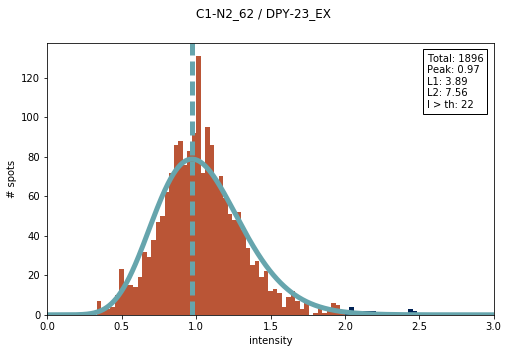

error: L1, L2 [3.1360984646043022, 6.4640189234793697]
peak center: 1.0


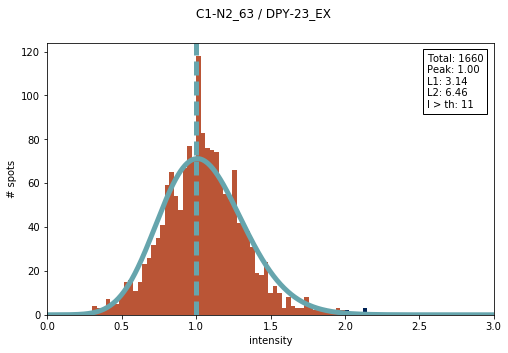

error: L1, L2 [7.9656477474721123, 29.290723789473226]
peak center: 0.0909090909091


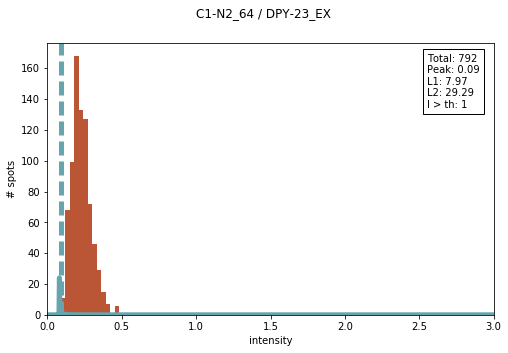

error: L1, L2 [3.7646904462371036, 7.1615394803558132]
peak center: 1.0


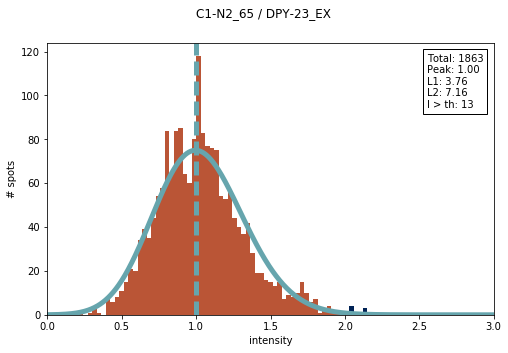

error: L1, L2 [2.9501873138602455, 4.4750578793889337]
peak center: 1.0


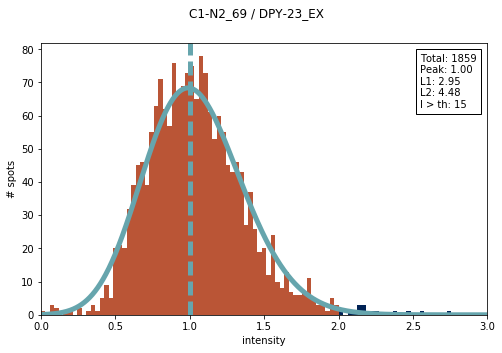

error: L1, L2 [15.159976679510418, 29.315759282425816]
peak center: 0.121212121212


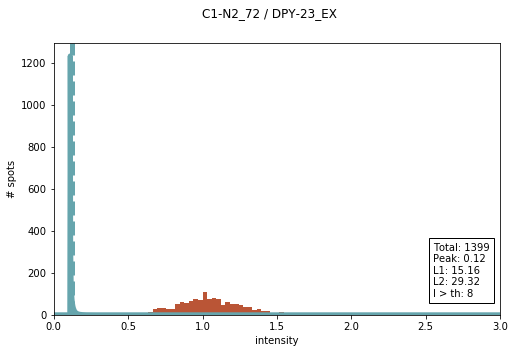

error: L1, L2 [3.1720272810618533, 5.8417912362528108]
peak center: 1.0


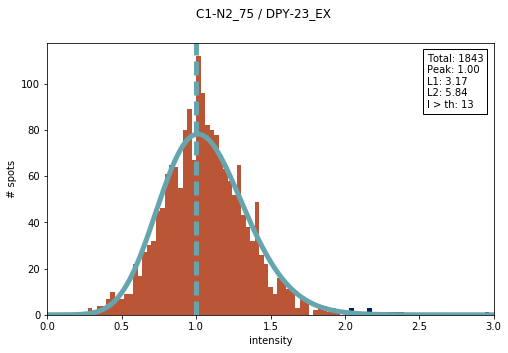

error: L1, L2 [4.6558516012267326, 8.0593433131996051]
peak center: 1.0


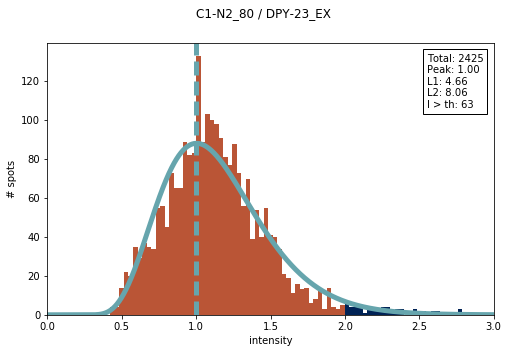

error: L1, L2 [3.2282090002146431, 6.3959795519444711]
peak center: 1.0


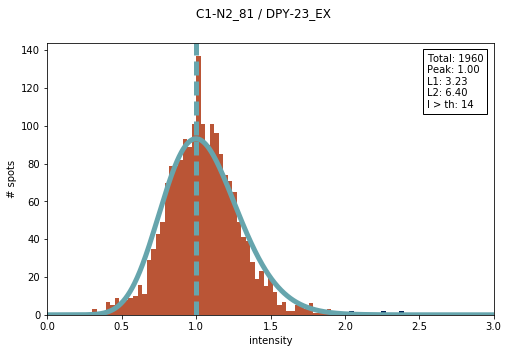

error: L1, L2 [4.2066272396558402, 7.6022856171899305]
peak center: 1.0303030303


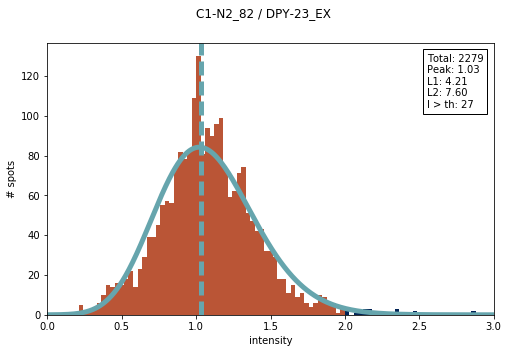

error: L1, L2 [4.1705959638696175, 8.7389149205437509]
peak center: 1.0


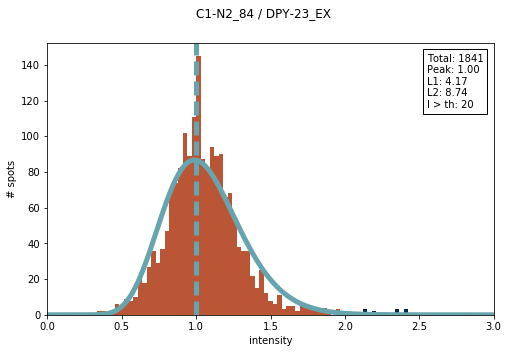

error: L1, L2 [2.9809234877335364, 6.2435594741266804]
peak center: 0.939393939394


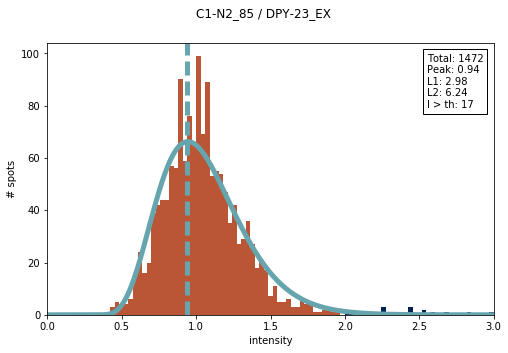

error: L1, L2 [4.9130923209284667, 9.2564566799746526]
peak center: 1.0


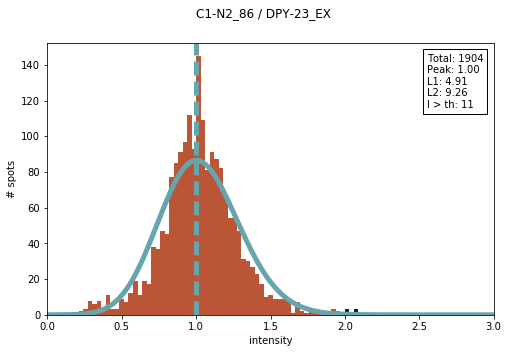

error: L1, L2 [5.3073354414032021, 10.010749455922578]
peak center: 1.0


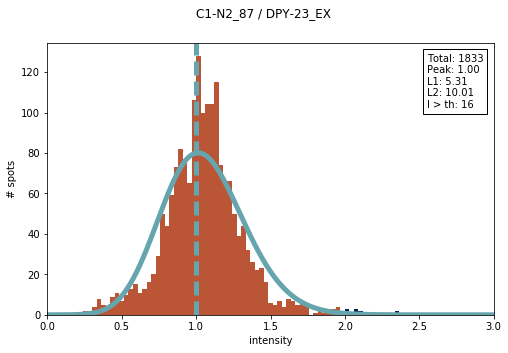

error: L1, L2 [5.0807146300336594, 8.8120467369589548]
peak center: 0.969696969697


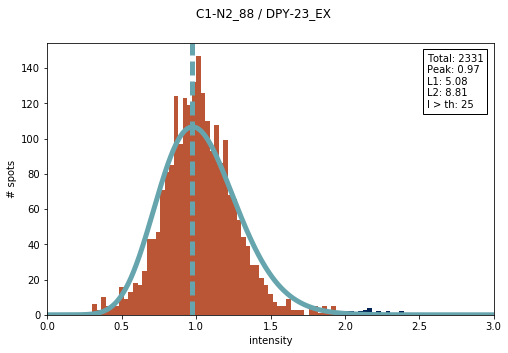

error: L1, L2 [2.8127605955218717, 5.4740122015876276]
peak center: 0.969696969697


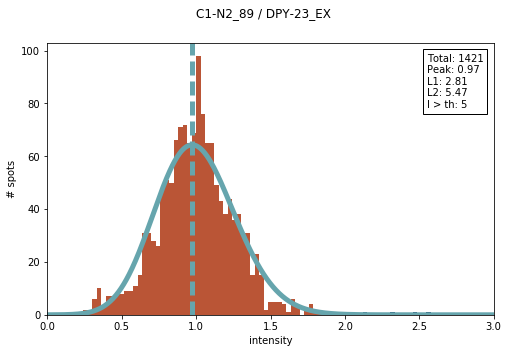

error: L1, L2 [3.9722839660534781, 7.5315396270397841]
peak center: 1.0


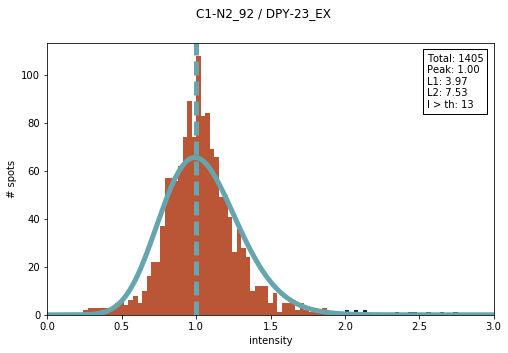

error: L1, L2 [5.9001048330005483, 11.372676107856728]
peak center: 0.969696969697


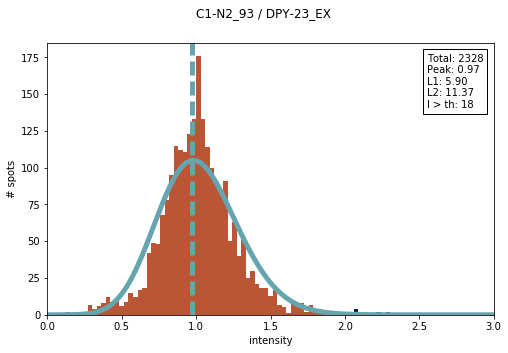

error: L1, L2 [3.1778366592308989, 5.8055676414132416]
peak center: 0.939393939394


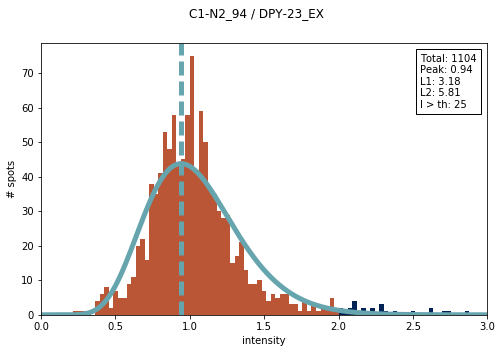

error: L1, L2 [4.1055753015230412, 7.4977866165625358]
peak center: 0.969696969697


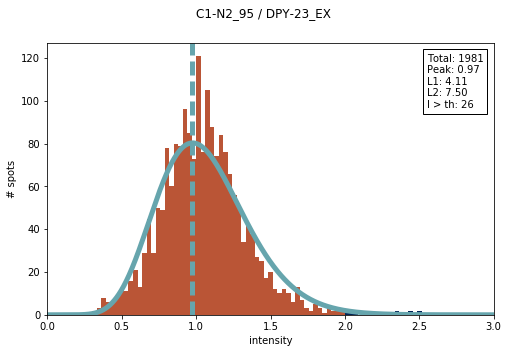

error: L1, L2 [4.0833213400026063, 8.0329125148750027]
peak center: 0.969696969697


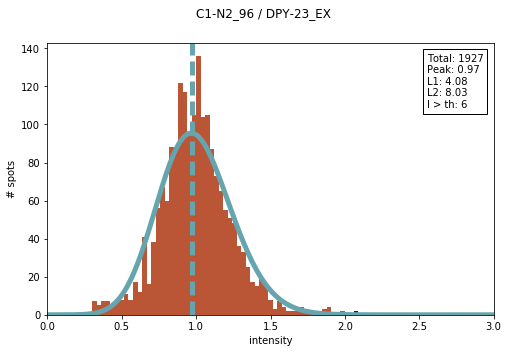

error: L1, L2 [3.9666433499545759, 6.3846204562532289]
peak center: 2.45454545455


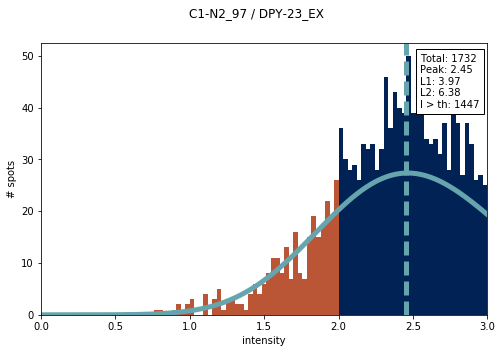

error: L1, L2 [4.1818500724740906, 9.4607924841685271]
peak center: 0.939393939394


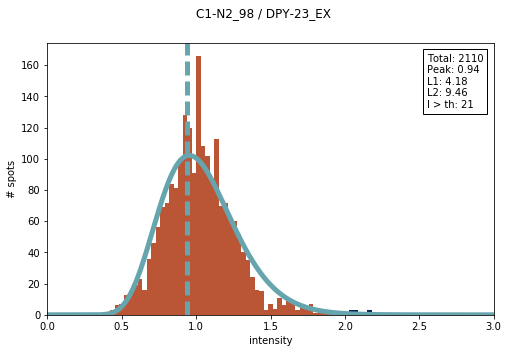

error: L1, L2 [3.5759449777944421, 6.6135550618419954]
peak center: 1.0


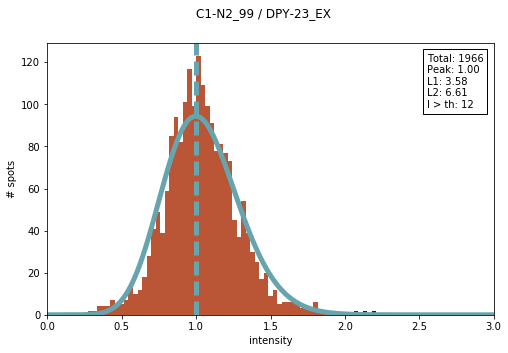

error: L1, L2 [3.2594824916081824, 6.33943441846474]
peak center: 1.0


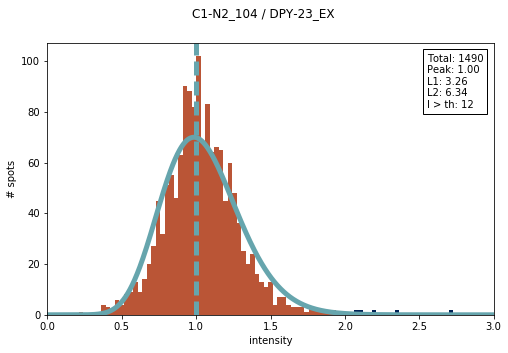

error: L1, L2 [2.9216489443193305, 5.3468052012050107]
peak center: 0.969696969697


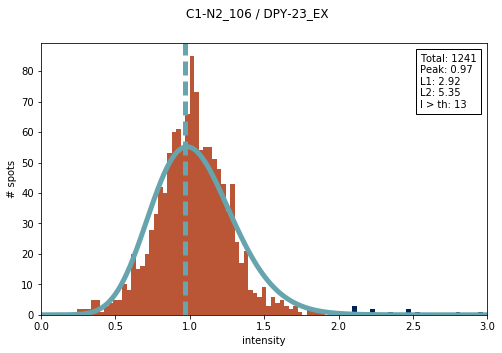

error: L1, L2 [2.7590630556945355, 4.5072571556094143]
peak center: 1.0


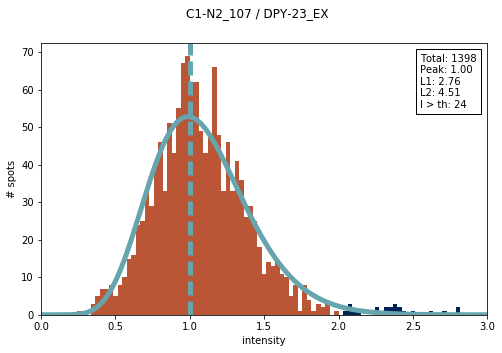

error: L1, L2 [3.5279291459577071, 6.8577109720199223]
peak center: 1.0303030303


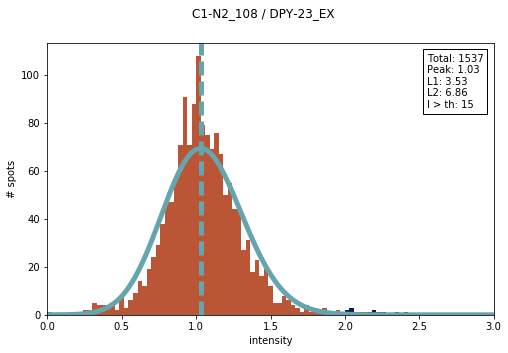

error: L1, L2 [4.1314698254731246, 7.3354327411042002]
peak center: 0.969696969697


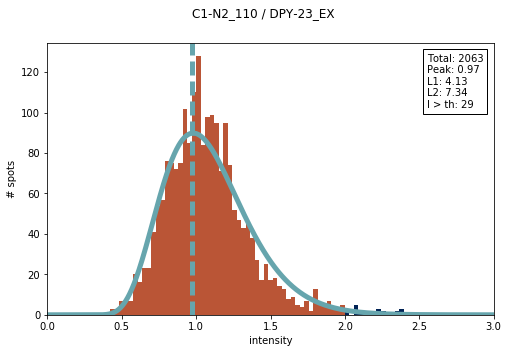

error: L1, L2 [3.6516300014261245, 7.0207109085669677]
peak center: 1.0


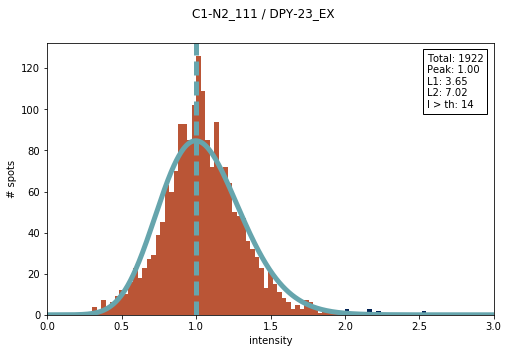

error: L1, L2 [3.8589170744081827, 6.839069962600723]
peak center: 1.0


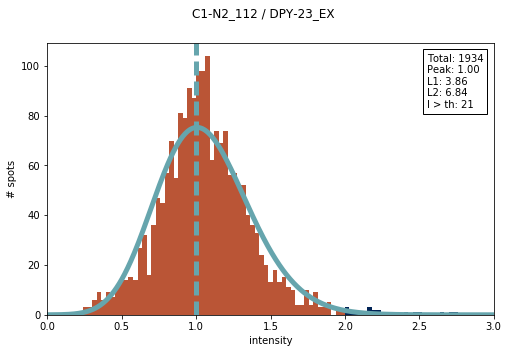

error: L1, L2 [2.3933700639997202, 4.6338487059468765]
peak center: 0.969696969697


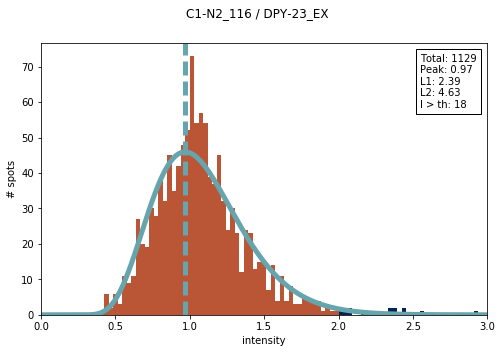

error: L1, L2 [2.5125221589392761, 5.2631436087213919]
peak center: 1.0


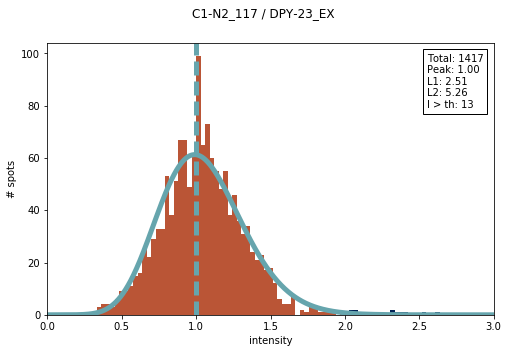

error: L1, L2 [3.8253424433043559, 6.6558604207582386]
peak center: 1.0


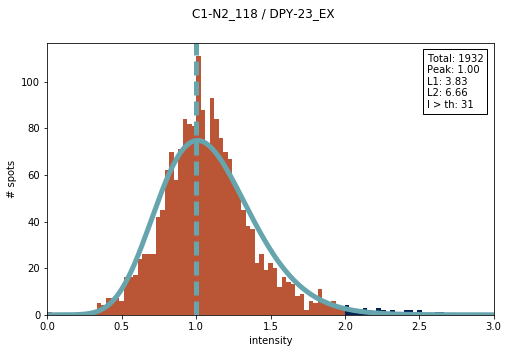

error: L1, L2 [3.7652978706947398, 8.9330210611107326]
peak center: 0.969696969697


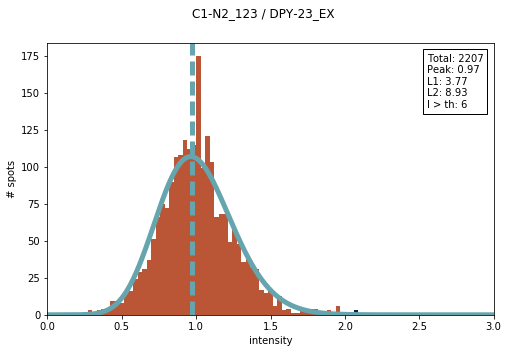

error: L1, L2 [5.3939368120557019, 8.2854162823127897]
peak center: 1.0


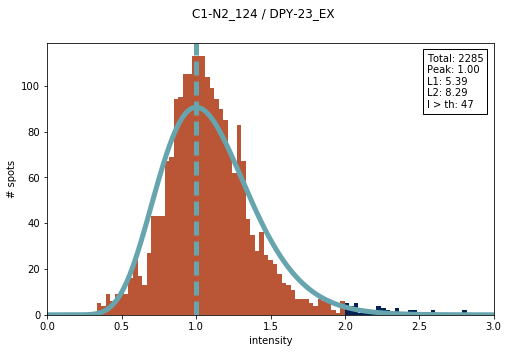

error: L1, L2 [1.3298610810162454, 2.8956204706239914]
peak center: 0.575757575758


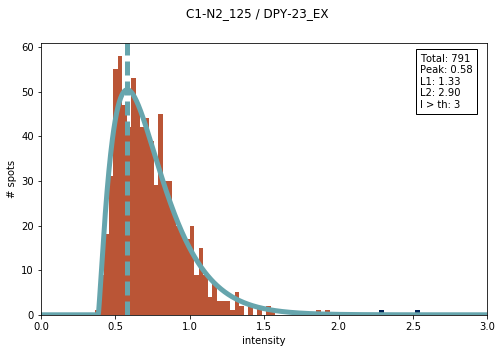

error: L1, L2 [5.1659321020957085, 9.2848765358289889]
peak center: 1.0


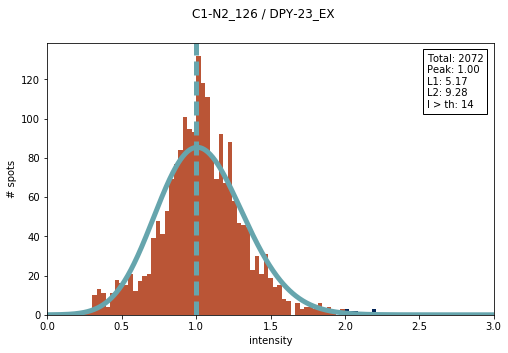

error: L1, L2 [2.4726049266987458, 4.0387064602807019]
peak center: 0.939393939394


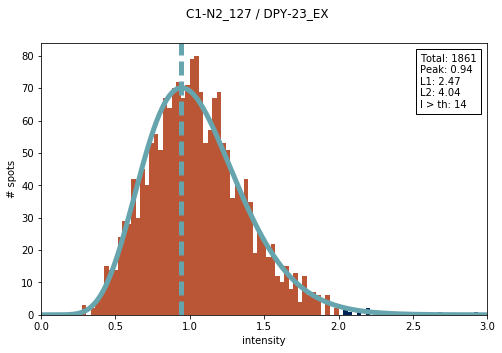

error: L1, L2 [3.1833780413419377, 6.0706496436568989]
peak center: 0.969696969697


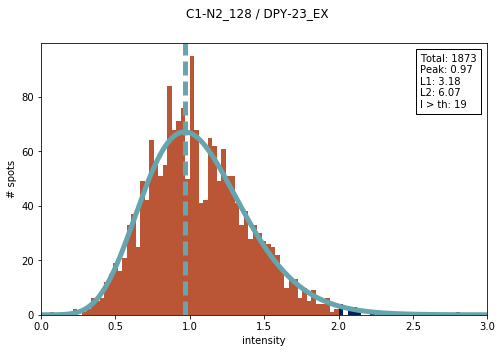

error: L1, L2 [2.0883628657614359, 4.6896742556716413]
peak center: 0.969696969697


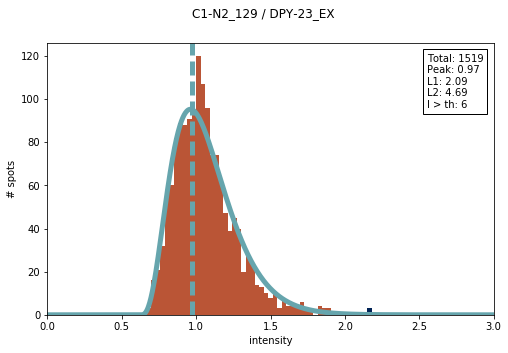

error: L1, L2 [3.5968144516005647, 7.0090215785877286]
peak center: 1.0


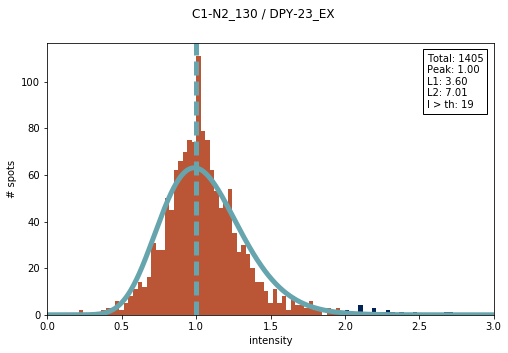

error: L1, L2 [4.6221365048972096, 7.8799996658105798]
peak center: 0.969696969697


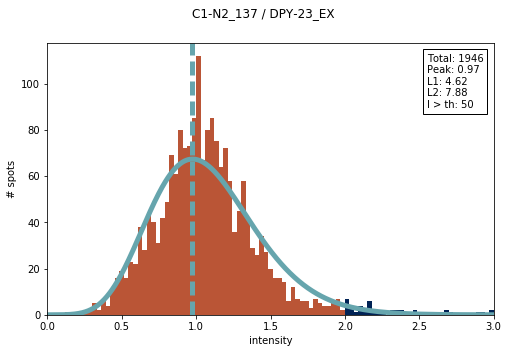

error: L1, L2 [3.36055383691266, 6.3506102460275091]
peak center: 1.0


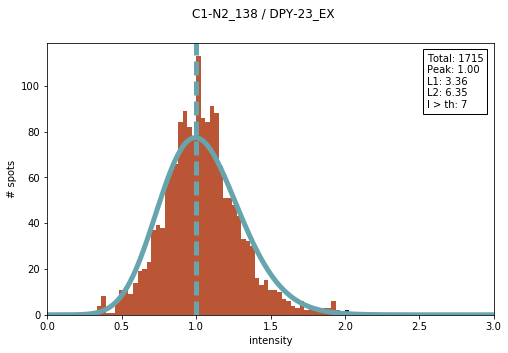

error: L1, L2 [2.4183330860426411, 4.3812225215142808]
peak center: 0.969696969697


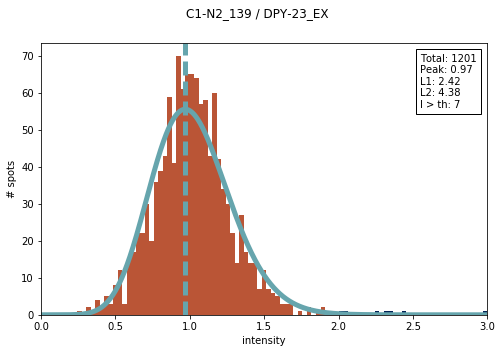

error: L1, L2 [3.6538353393602989, 6.7616917817526812]
peak center: 1.0


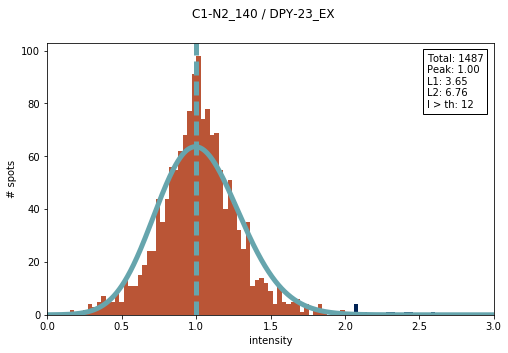

error: L1, L2 [3.1059427183522414, 6.1428075478867354]
peak center: 1.0


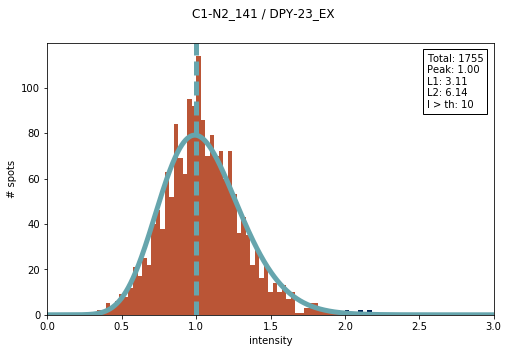

error: L1, L2 [2.9788204182759319, 5.3663536222292869]
peak center: 1.0303030303


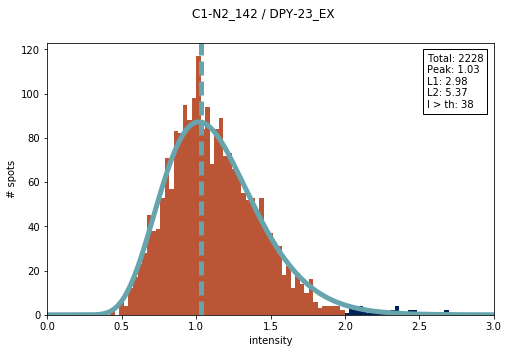

error: L1, L2 [2.1658177389373394, 4.3299040703635177]
peak center: 1.0


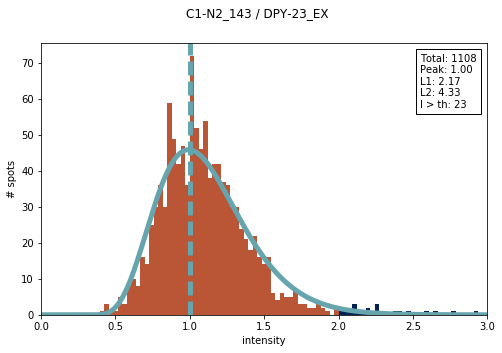

error: L1, L2 [3.1083126295028887, 6.5444352167176181]
peak center: 1.0


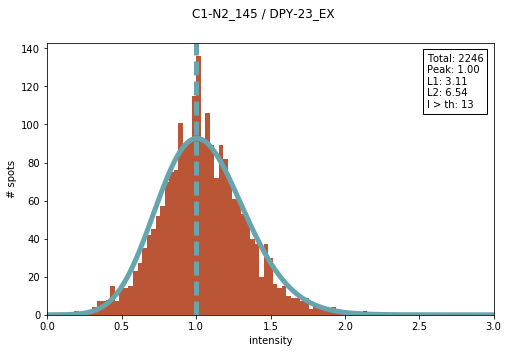

error: L1, L2 [5.1414457086046568, 9.8847360106829747]
peak center: 0.969696969697


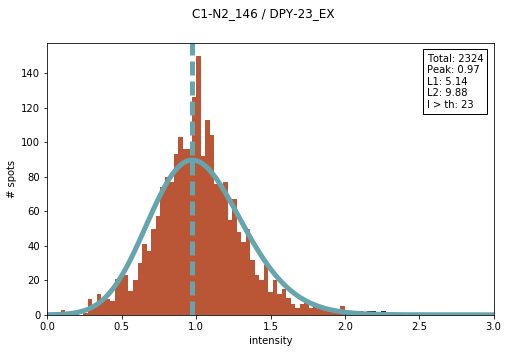

error: L1, L2 [2.5157480259752409, 4.2849036646835943]
peak center: 1.0


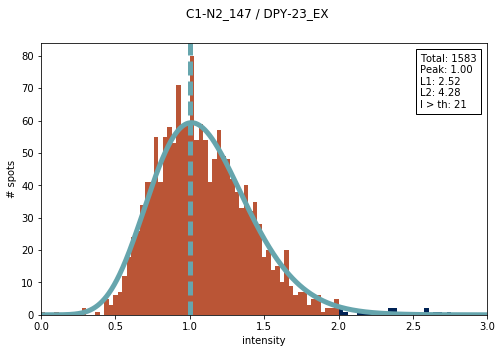

error: L1, L2 [3.4878791681383454, 6.3187759107667105]
peak center: 0.939393939394


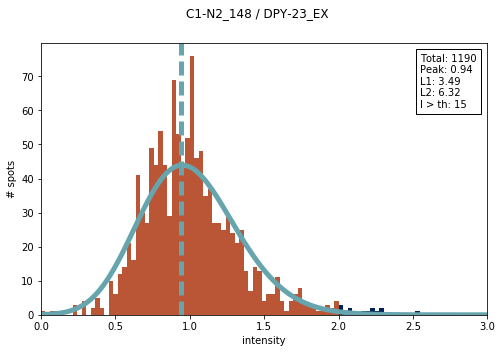

error: L1, L2 [3.1573721342294139, 5.6702728090367369]
peak center: 0.969696969697


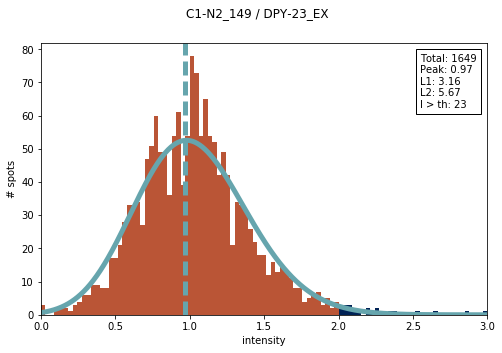

error: L1, L2 [4.7261048629511659, 8.4585606075015036]
peak center: 1.0


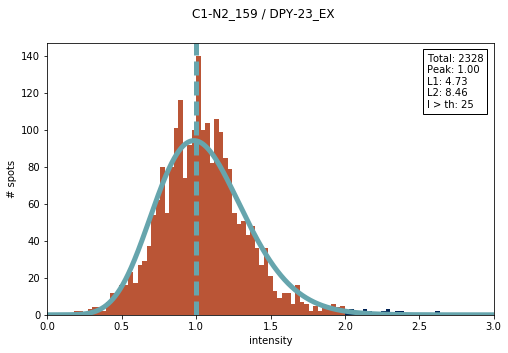

error: L1, L2 [2.6281430577788996, 4.6624535617570029]
peak center: 1.0


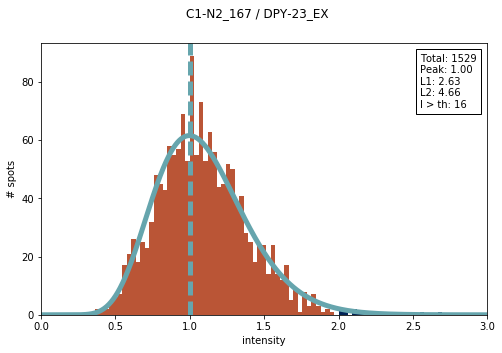

error: L1, L2 [5.2695253220262801, 9.151128672827042]
peak center: 1.0


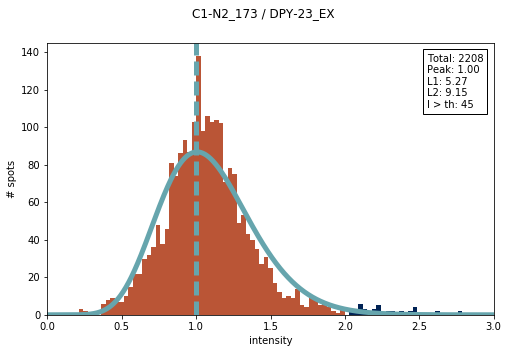

error: L1, L2 [3.9358453161934008, 7.2445303718894163]
peak center: 1.0


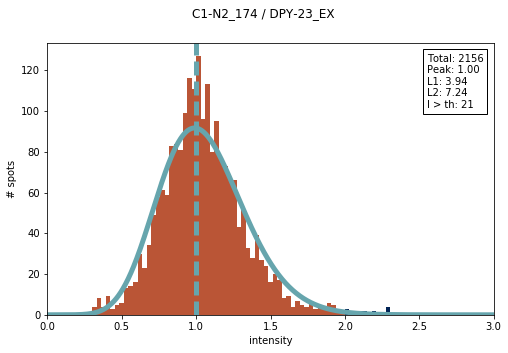

error: L1, L2 [3.8806102949558885, 8.0852987588606879]
peak center: 1.0303030303


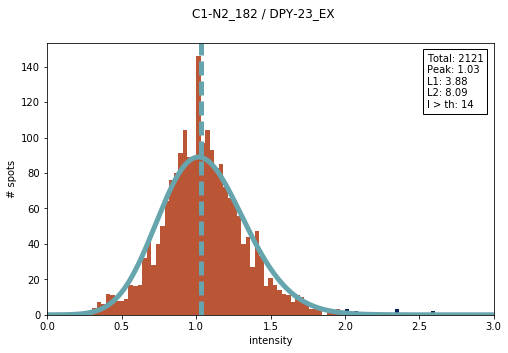

error: L1, L2 [3.9664153799133945, 7.9332052864718285]
peak center: 1.0303030303


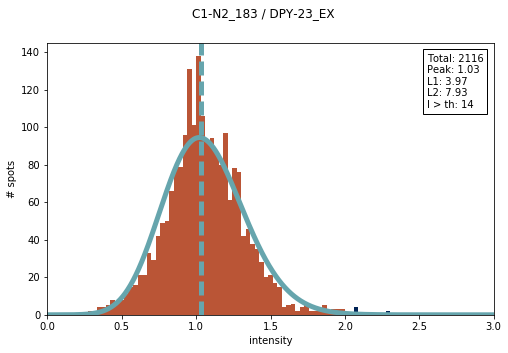

error: L1, L2 [3.7246636091416634, 6.842286348442479]
peak center: 0.969696969697


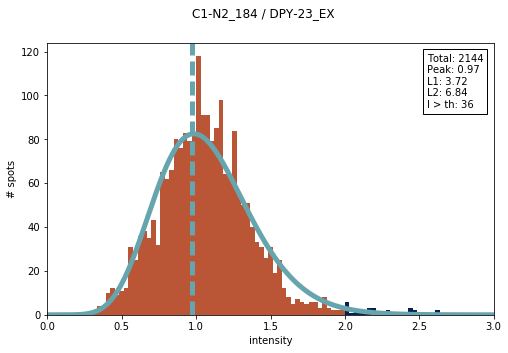

error: L1, L2 [3.7229966933780001, 5.8967914149798331]
peak center: 1.0


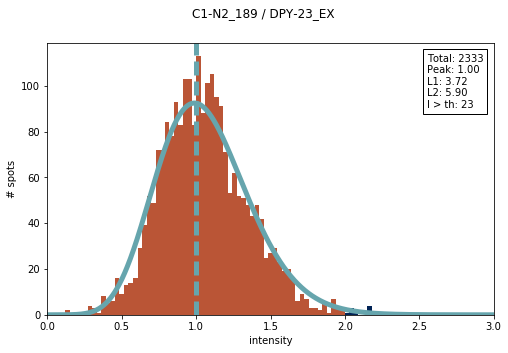

error: L1, L2 [3.8014546818064199, 7.9570286692201533]
peak center: 1.0303030303


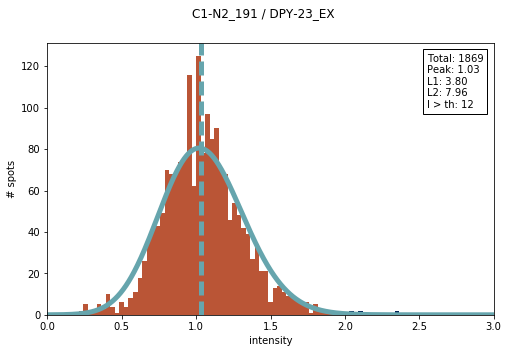

error: L1, L2 [2.163624897498913, 3.9218142815920842]
peak center: 1.06060606061


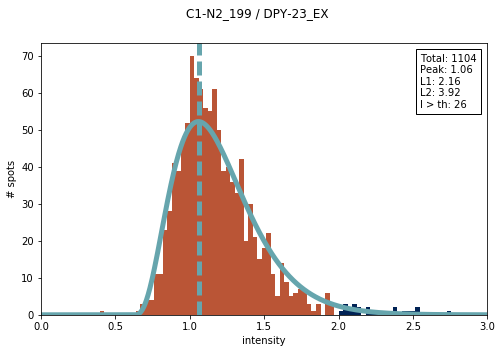

error: L1, L2 [3.7349160589992261, 7.7261669869913874]
peak center: 1.0


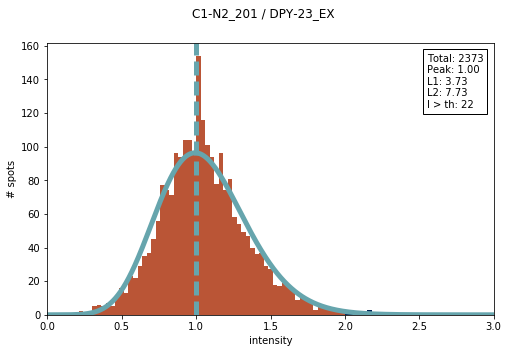

error: L1, L2 [3.1127054225310218, 5.8080683695219619]
peak center: 1.0


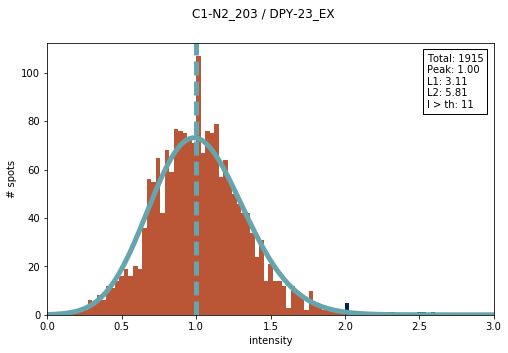

error: L1, L2 [2.9253800547815985, 6.232813078706954]
peak center: 1.0


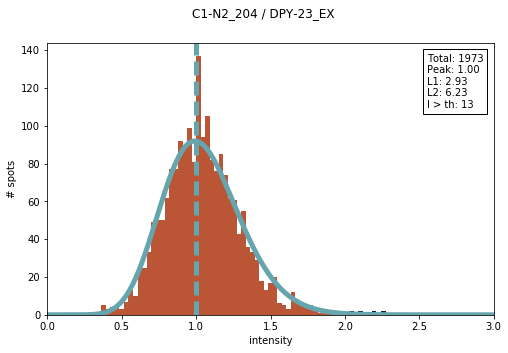

error: L1, L2 [2.8783568544659039, 6.0778773472278669]
peak center: 1.0


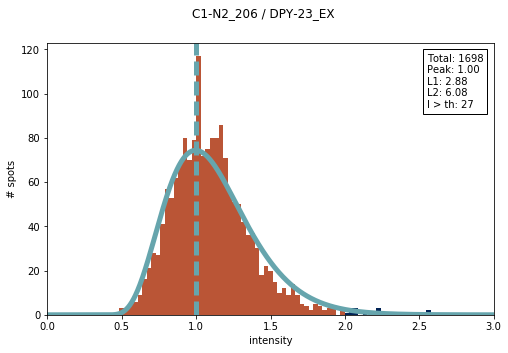

error: L1, L2 [3.012105201184601, 5.6953822386919706]
peak center: 1.0


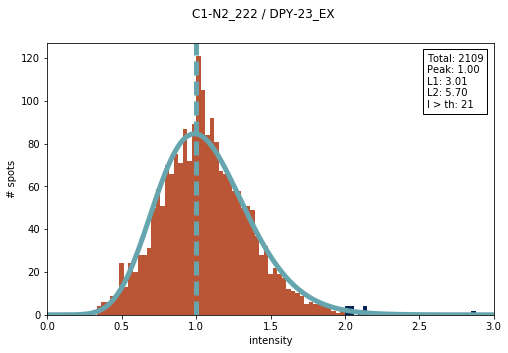

error: L1, L2 [3.6403139914282527, 7.2351618909707698]
peak center: 0.969696969697


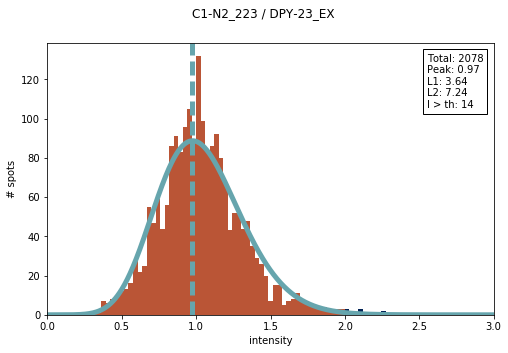

error: L1, L2 [3.0586696110647393, 5.5795795336621943]
peak center: 0.969696969697


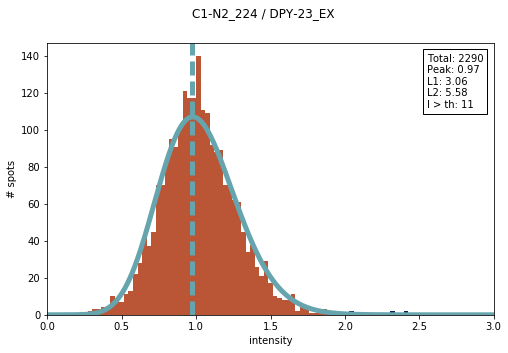

error: L1, L2 [3.8934103986140927, 7.6419667007699132]
peak center: 1.0


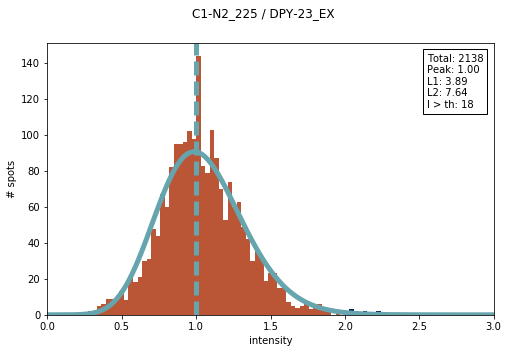

error: L1, L2 [2.5706015677318073, 4.4859630865934239]
peak center: 0.969696969697


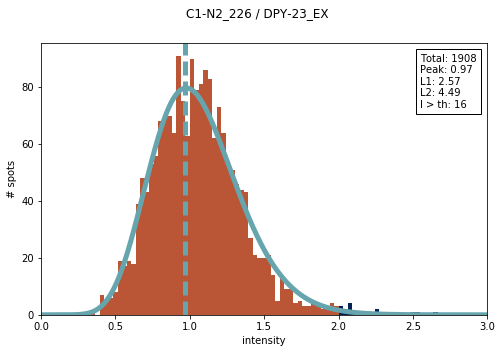

error: L1, L2 [3.1971104637728995, 5.8722066423855184]
peak center: 1.0


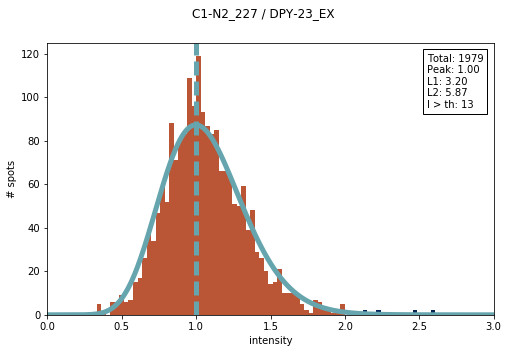

error: L1, L2 [3.5501808051872317, 7.2816834030263298]
peak center: 1.0


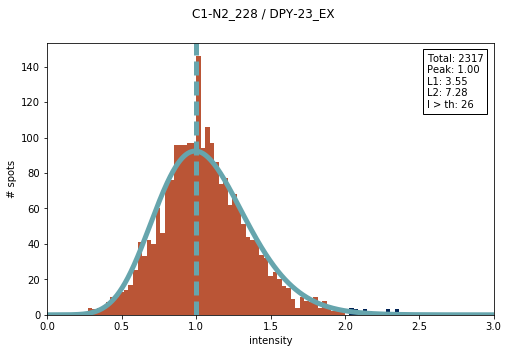

error: L1, L2 [3.5985019099234856, 7.8712358666756179]
peak center: 1.0


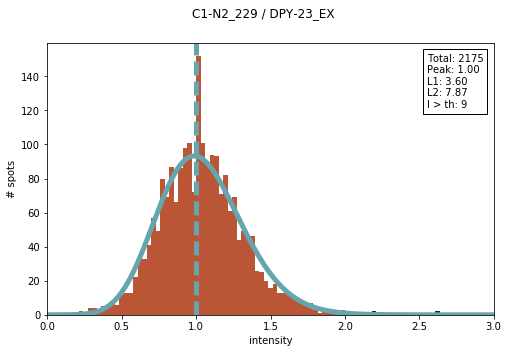

error: L1, L2 [2.931191703408095, 5.7109462382237242]
peak center: 1.0


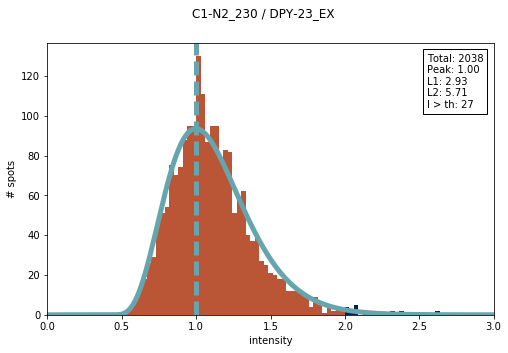

error: L1, L2 [3.4318124734684341, 6.3239115841352325]
peak center: 1.0


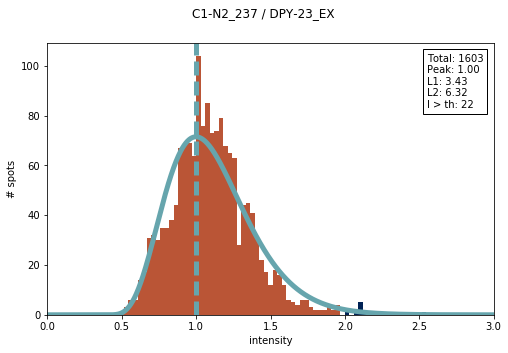

error: L1, L2 [3.0731853409423855, 4.8638234479686036]
peak center: 0.969696969697


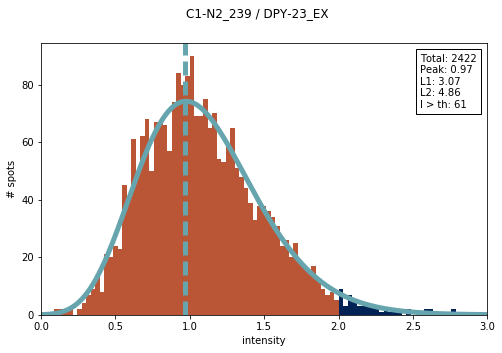

error: L1, L2 [2.9610606460443454, 4.8100134317343981]
peak center: 1.0303030303


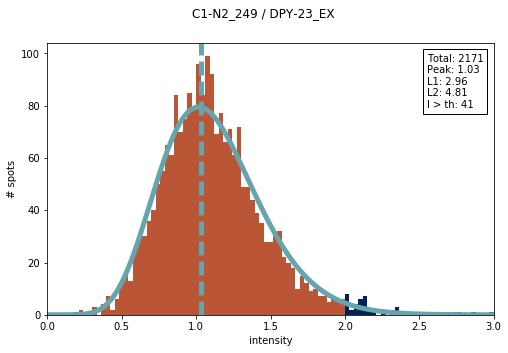

error: L1, L2 [3.5411084148272183, 6.1995922119468867]
peak center: 1.0


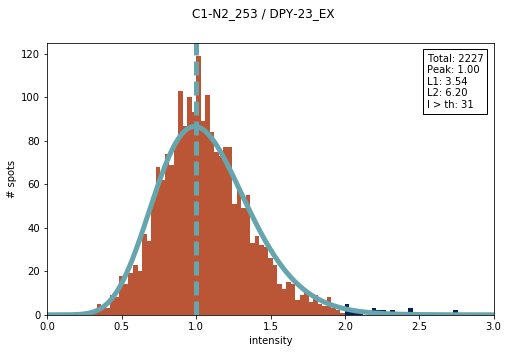

error: L1, L2 [0.096079432612348414, 0.37734193195899624]
peak center: 1.12121212121


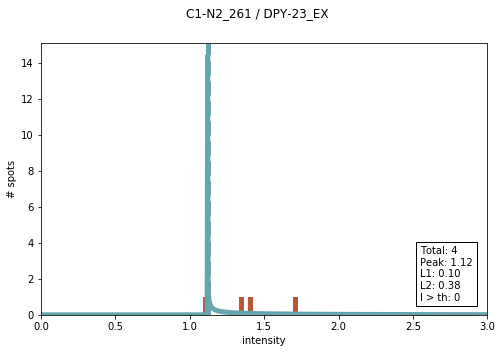

error: L1, L2 [2.9432286345181886, 5.5710264058215611]
peak center: 1.0303030303


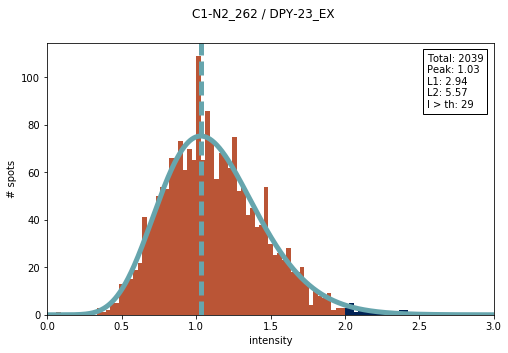

error: L1, L2 [3.0635109409453642, 6.1775309864040127]
peak center: 1.0


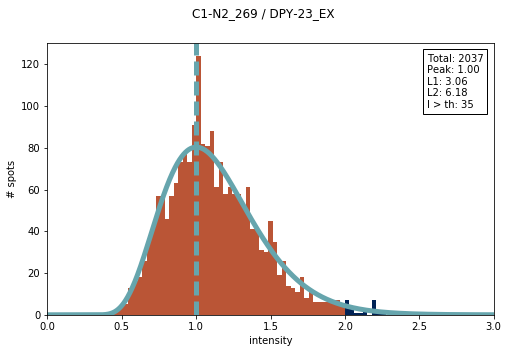

error: L1, L2 [3.0310925195317147, 4.5466456723273136]
peak center: 1.0


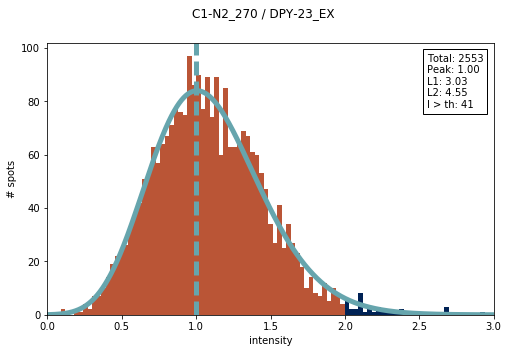

error: L1, L2 [3.9163956037912095, 7.9609062182590336]
peak center: 1.0303030303


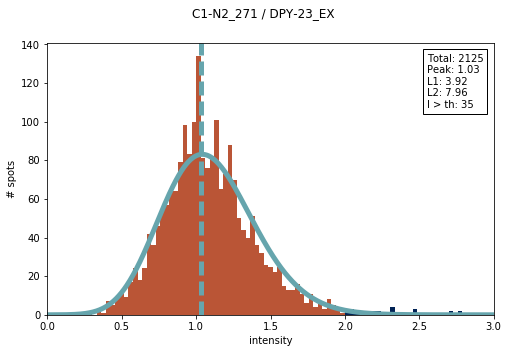

error: L1, L2 [3.4471018447736044, 5.6234659226114223]
peak center: 1.0


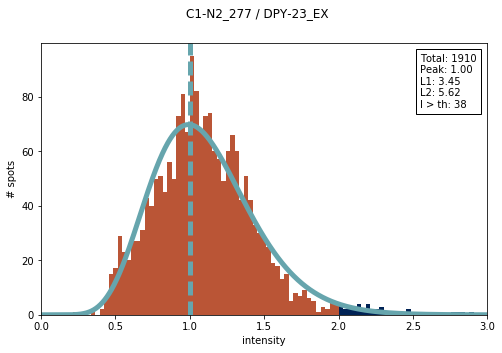

error: L1, L2 [2.7036014576081229, 5.1241702225958505]
peak center: 1.0303030303


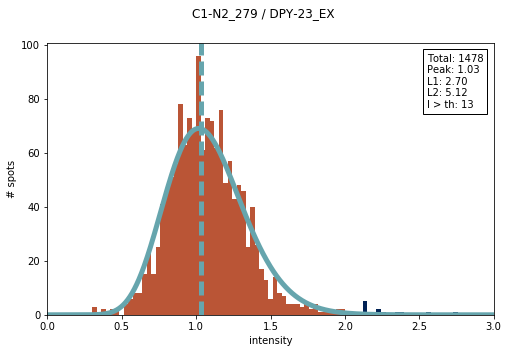

error: L1, L2 [2.8616516604400628, 4.9329212038445922]
peak center: 0.969696969697


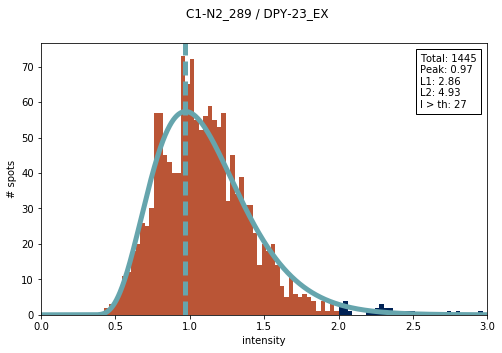

error: L1, L2 [3.3088762060087622, 6.1785133238855163]
peak center: 1.0303030303


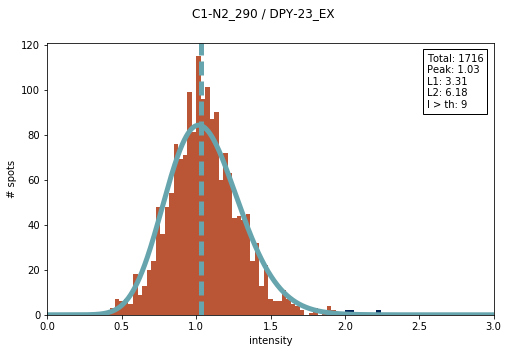

error: L1, L2 [2.9112232039001409, 5.1051602284822577]
peak center: 1.06060606061


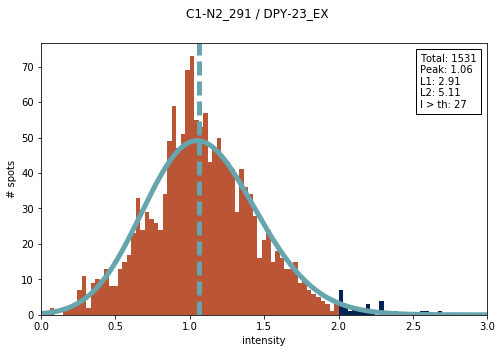

error: L1, L2 [3.1538988632039704, 4.9558546963400909]
peak center: 1.06060606061


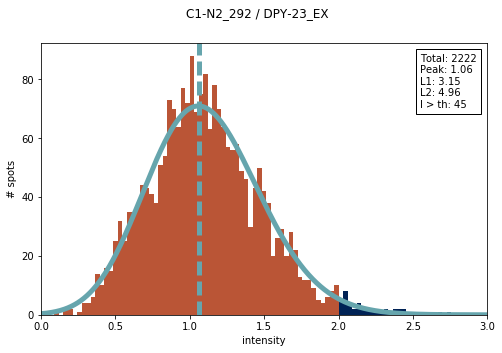

error: L1, L2 [3.4648687646125027, 7.6018373686039116]
peak center: 1.0


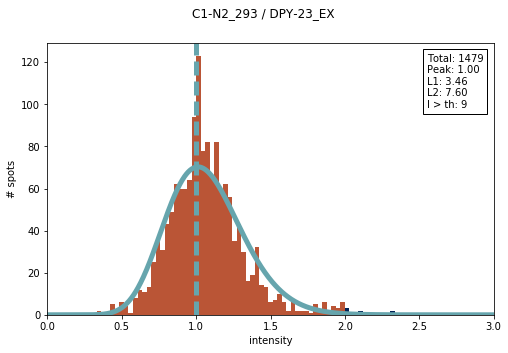

error: L1, L2 [4.5228693847738475, 9.3790700149978896]
peak center: 1.0


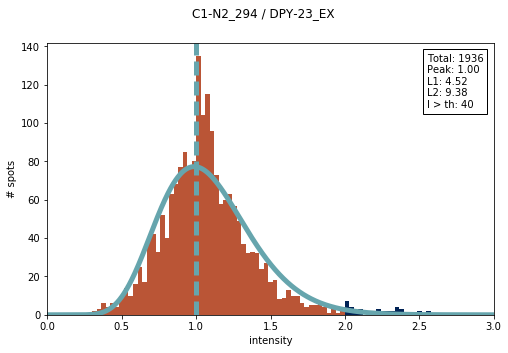

error: L1, L2 [1.5752032481872602, 2.9715625272857182]
peak center: 0.969696969697


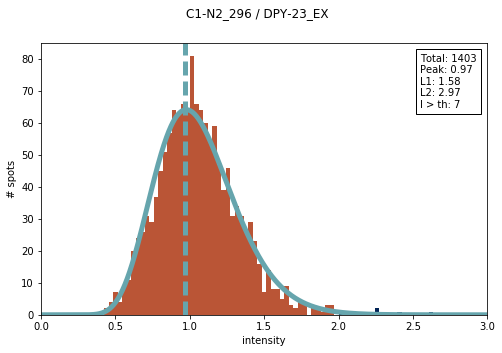

error: L1, L2 [3.3379487082721102, 6.7962449787297663]
peak center: 1.0303030303


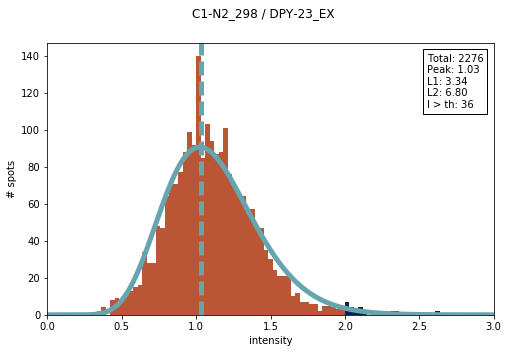

error: L1, L2 [51.995657268553359, 294.20716940457976]
peak center: 0.30303030303


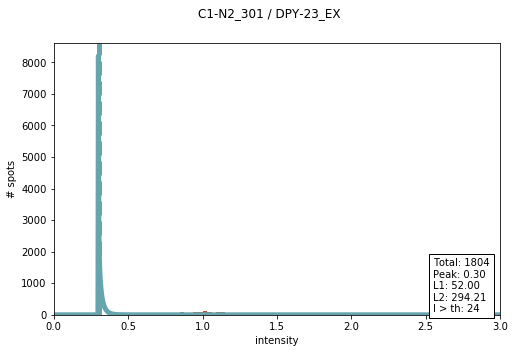

error: L1, L2 [4.5503660748530592, 8.1598227962029224]
peak center: 0.969696969697


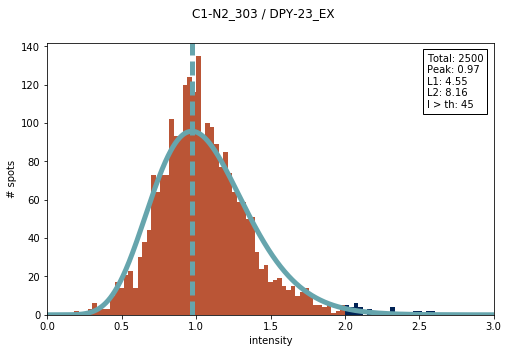

error: L1, L2 [2.7315790082701406, 4.4195852812515071]
peak center: 1.0


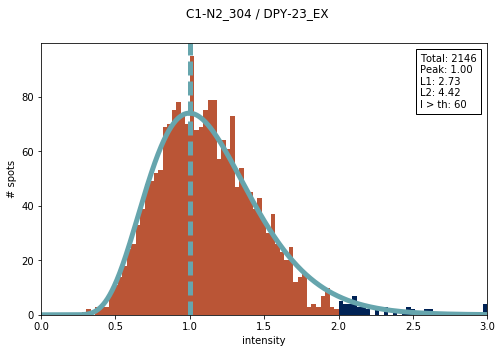

error: L1, L2 [3.5011223843524939, 6.0528679582509737]
peak center: 0.969696969697


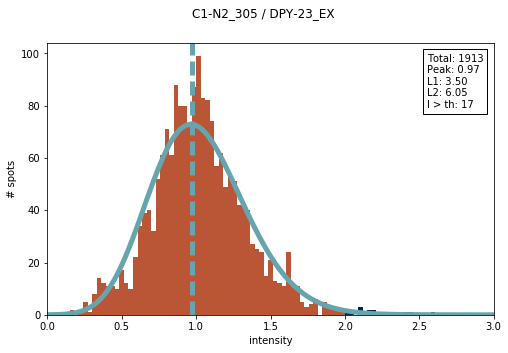

error: L1, L2 [2.6443598993202788, 4.679954924089218]
peak center: 1.0303030303


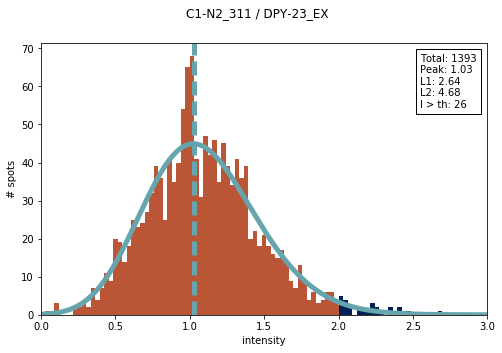

error: L1, L2 [3.2171620923470567, 6.1496578441194147]
peak center: 0.969696969697


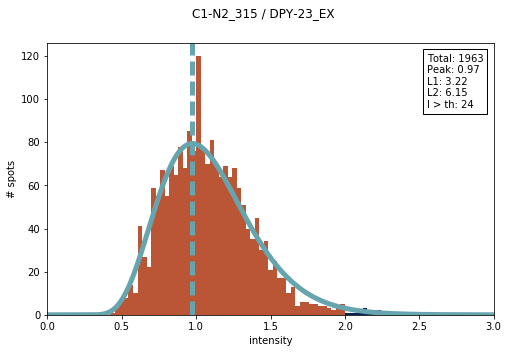

error: L1, L2 [2.7814418869704003, 4.551071795310996]
peak center: 1.0303030303


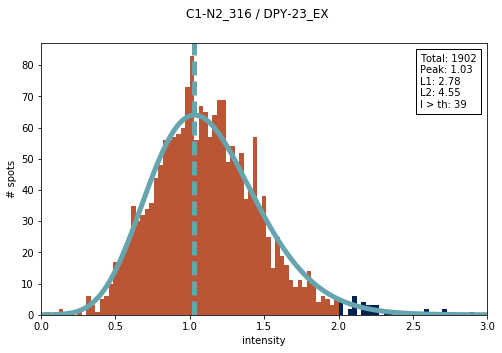

error: L1, L2 [2.7417449470889164, 4.4296981104507198]
peak center: 1.0303030303


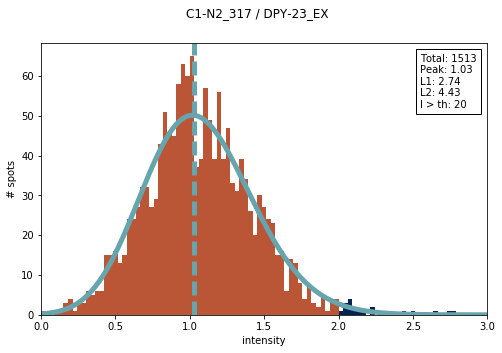

error: L1, L2 [2.7083453780402347, 4.9571508008140919]
peak center: 1.0


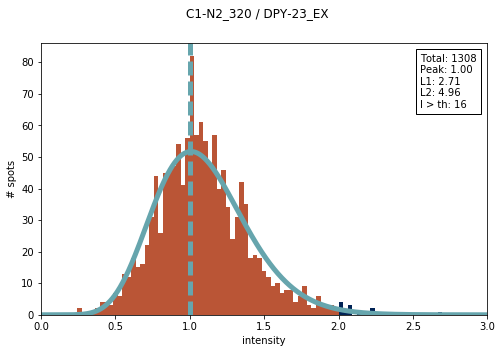

error: L1, L2 [3.6516287781635075, 6.4850835592833871]
peak center: 1.0


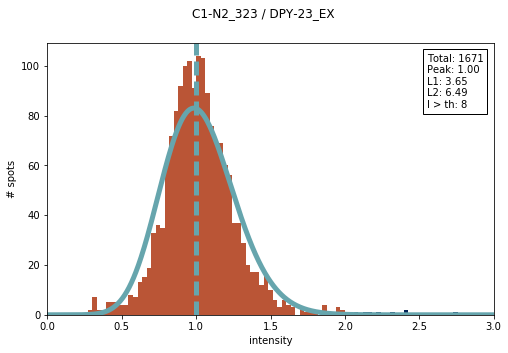

error: L1, L2 [3.0419001659305458, 5.3997050165503966]
peak center: 1.0


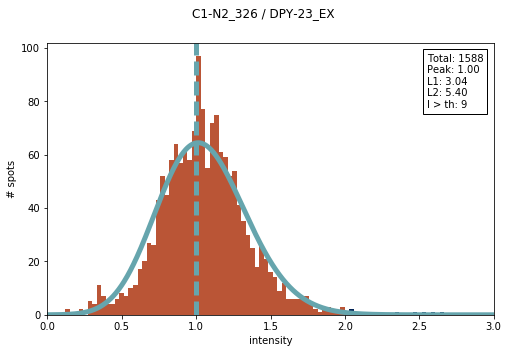

error: L1, L2 [4.2502177625829747, 8.6386931820079678]
peak center: 0.969696969697


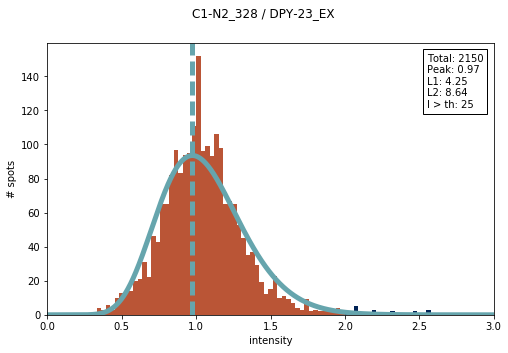

error: L1, L2 [3.5047502947837259, 6.3956708338928943]
peak center: 1.0303030303


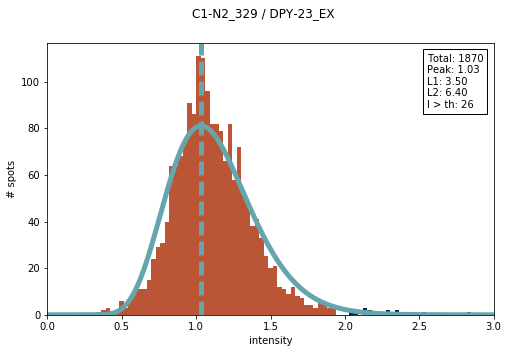

error: L1, L2 [5.3287673875550734, 9.2095489425941732]
peak center: 1.0


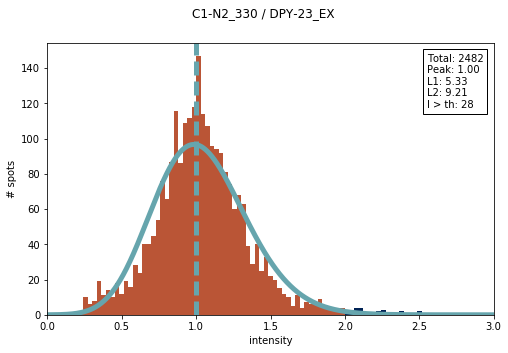

error: L1, L2 [4.0175996088601087, 6.8705229628666524]
peak center: 1.0


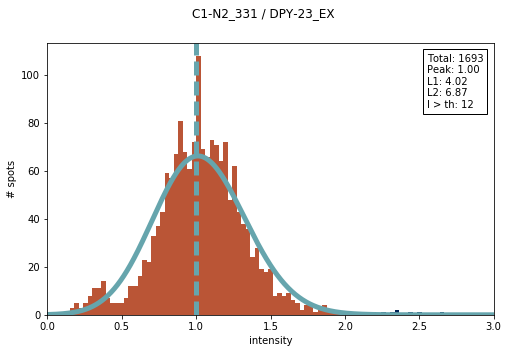

error: L1, L2 [4.00578412837055, 7.3290411023334796]
peak center: 1.0


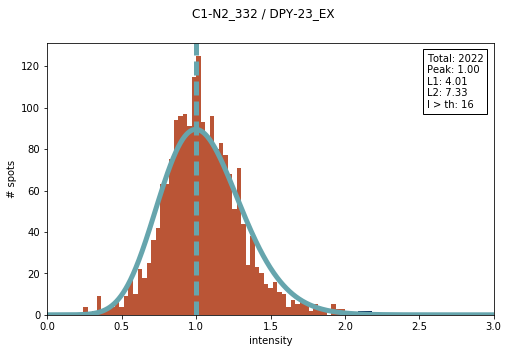

error: L1, L2 [2.804374485358764, 5.229710438718608]
peak center: 1.0


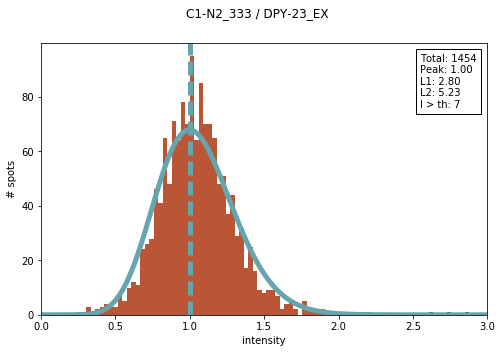

error: L1, L2 [2.5043703277212197, 4.2260672204162848]
peak center: 0.969696969697


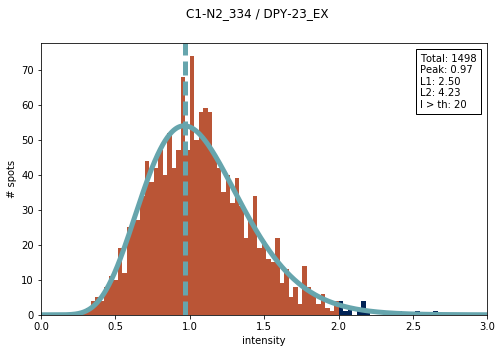

error: L1, L2 [3.8210845163392677, 6.8747595552775085]
peak center: 1.0303030303


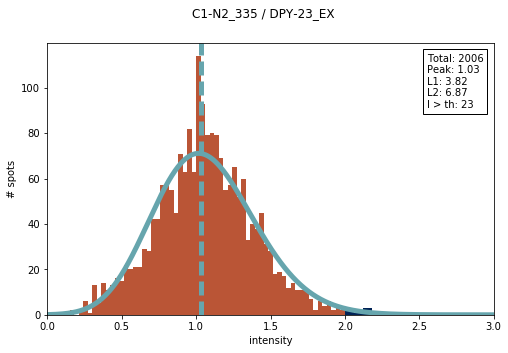

error: L1, L2 [3.2945977001761175, 6.3668870721243422]
peak center: 1.0


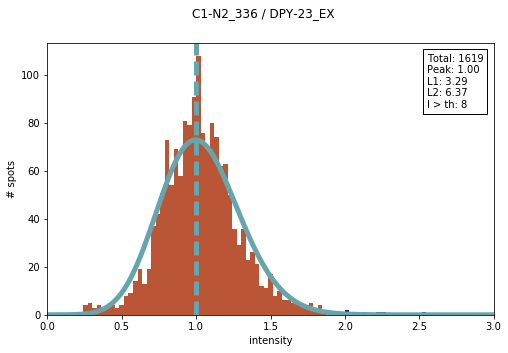

error: L1, L2 [5.4965767324109924, 8.2936641226752883]
peak center: 1.0


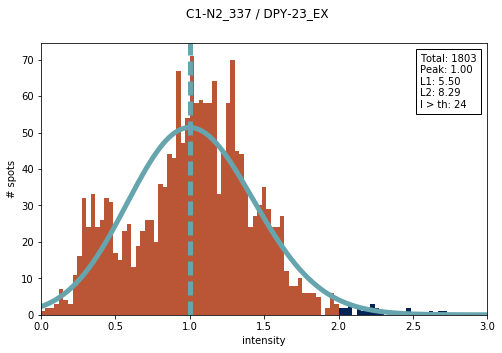

error: L1, L2 [3.0077232777490308, 4.5241214366296552]
peak center: 1.06060606061


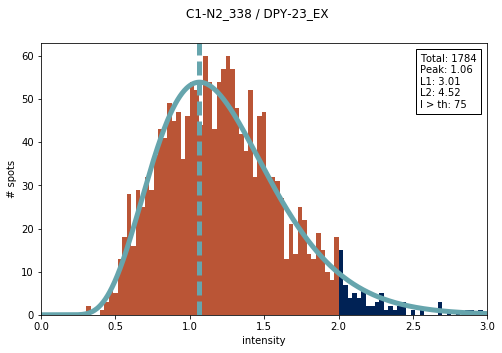

error: L1, L2 [5.72221057209559, 9.6763846435008993]
peak center: 1.0


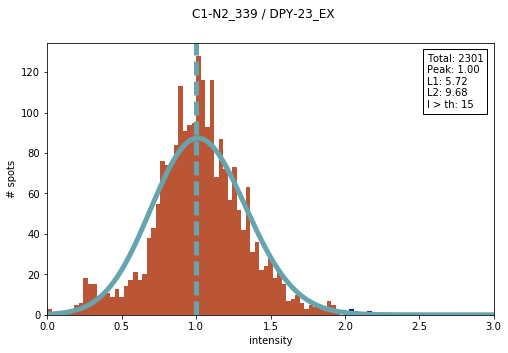

error: L1, L2 [2.7648795708204705, 4.996604872043001]
peak center: 1.0


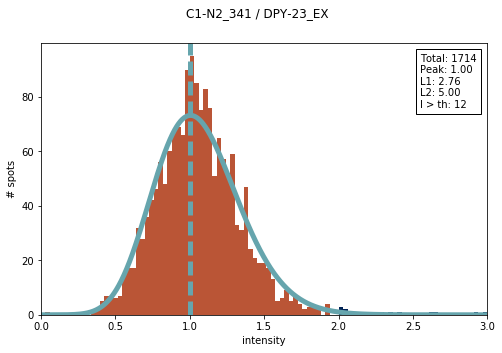

error: L1, L2 [1.893260676586408, 3.0337859225997641]
peak center: 1.0303030303


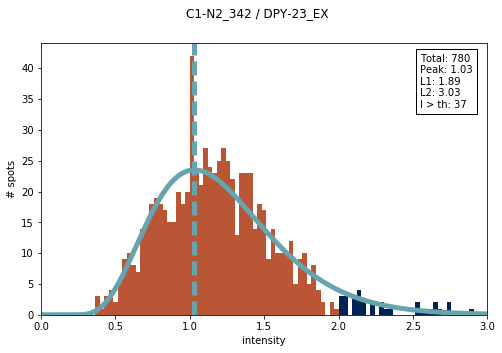

error: L1, L2 [3.4389396791511744, 5.610298461774514]
peak center: 1.0


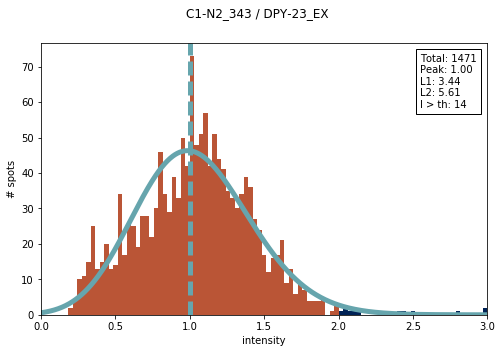

/Users/kkolyva/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:35: RuntimeWarning: divide by zero encountered in long_scalars
/Users/kkolyva/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:527: RuntimeWarning: invalid value encountered in subtract
  if (numpy.max(numpy.ravel(numpy.abs(sim[1:] - sim[0]))) <= xatol and
/Users/kkolyva/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:532: RuntimeWarning: invalid value encountered in subtract
  xr = (1 + rho) * xbar - rho * sim[-1]
/Users/kkolyva/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:872: RuntimeWarning: invalid value encountered in greater_equal
  return (self.a <= x) & (x <= self.b)
/Users/kkolyva/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:872: RuntimeWarning: invalid value encountered in less_equal
  return (self.a <= x) & (x <= self.b)
/Users/kkolyva/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:574: Runti

error: L1, L2 [0.0, 0.0]
peak center: 0.0


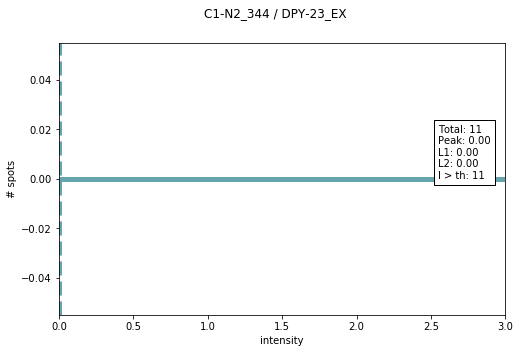

error: L1, L2 [2.4041476763471583, 3.9641535268809882]
peak center: 0.969696969697


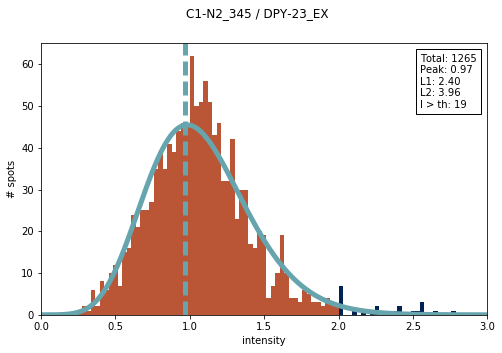

error: L1, L2 [2.7496762928812331, 3.882229529003359]
peak center: 0.969696969697


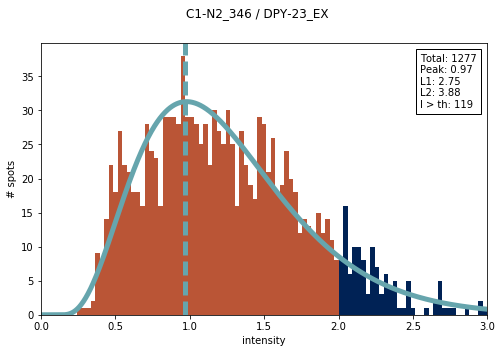

error: L1, L2 [2.1374277814657914, 3.8107538960615268]
peak center: 1.0


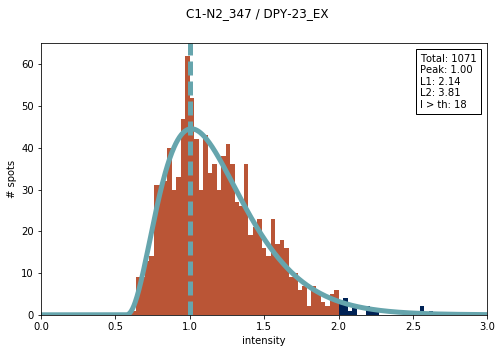

error: L1, L2 [2.5281352417372593, 4.8138738919941781]
peak center: 0.969696969697


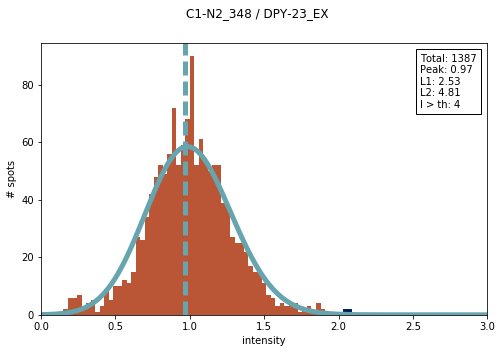

error: L1, L2 [3.3910272119748015, 4.9756072955527486]
peak center: 0.969696969697


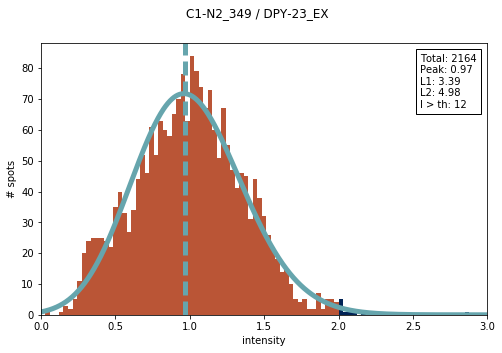

error: L1, L2 [2.6219832433011474, 3.7009822932074061]
peak center: 1.06060606061


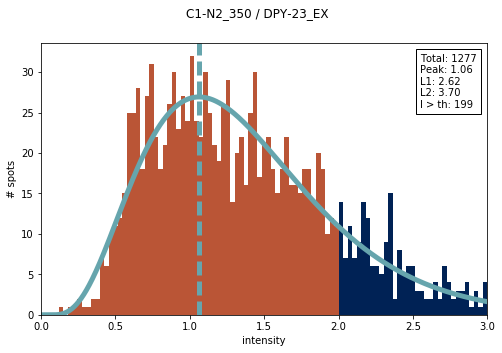

error: L1, L2 [1.7467996835057147, 3.1003306576863676]
peak center: 1.0


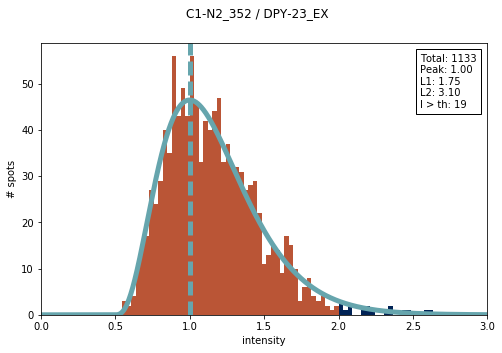

error: L1, L2 [2.7295726541036256, 4.1104271394650498]
peak center: 0.939393939394


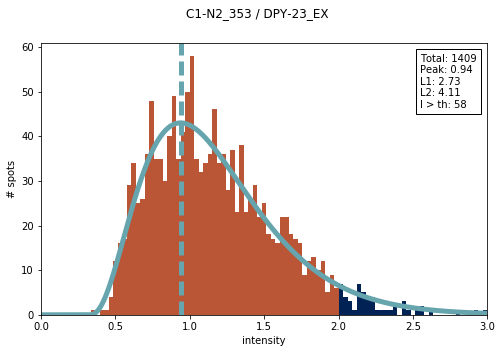

error: L1, L2 [22.591757836204934, 60.638903784768218]
peak center: 0.424242424242


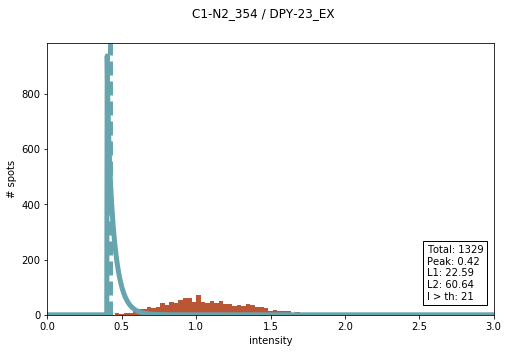

error: L1, L2 [2.6075885315885698, 4.4373978375182608]
peak center: 1.0


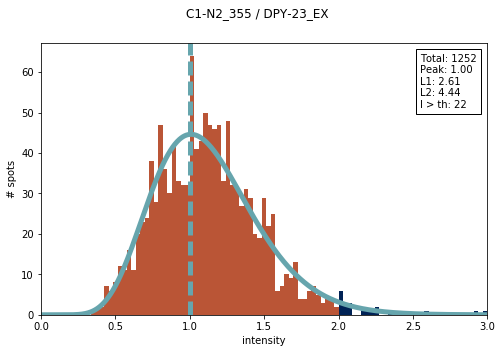

error: L1, L2 [2.8316805196088395, 4.4630391809119798]
peak center: 1.0


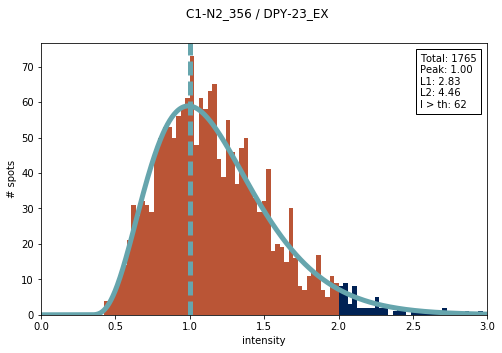

error: L1, L2 [2.3283086944684985, 4.6914239514070717]
peak center: 1.0


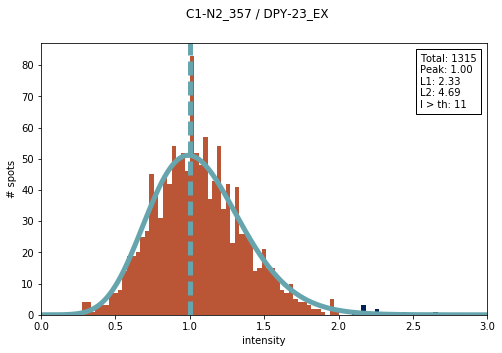

error: L1, L2 [3.647555320062017, 5.5826972472757799]
peak center: 1.0


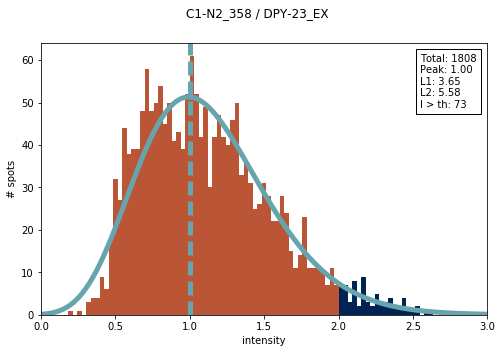

error: L1, L2 [2.7068179008974607, 4.0435647957611094]
peak center: 0.969696969697


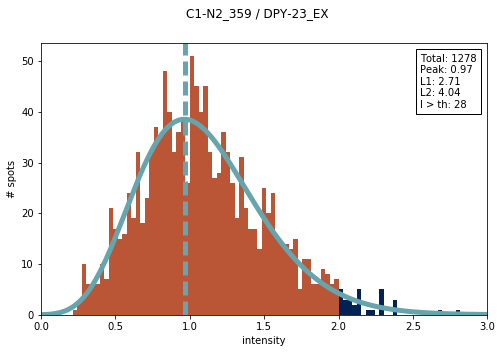

error: L1, L2 [2.190135863837444, 3.5398266456582719]
peak center: 1.0303030303


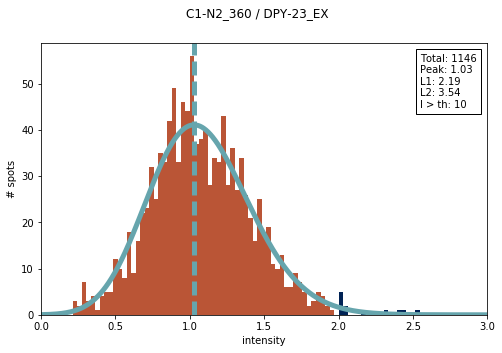

error: L1, L2 [3.3554900266674004, 5.5735031309024299]
peak center: 0.969696969697


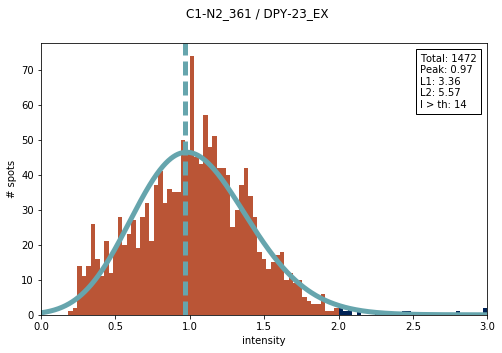

error: L1, L2 [0.049408055004691573, 0.18448859282043908]
peak center: 2.54545454545


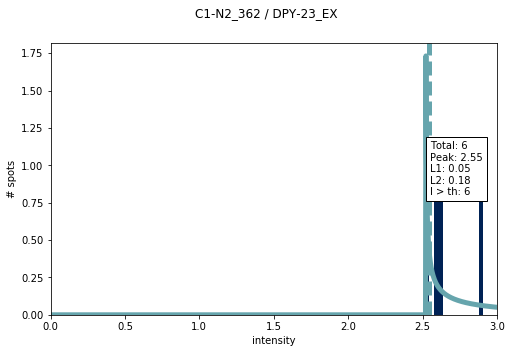

error: L1, L2 [2.8115010109001117, 4.7164809854870562]
peak center: 1.78787878788


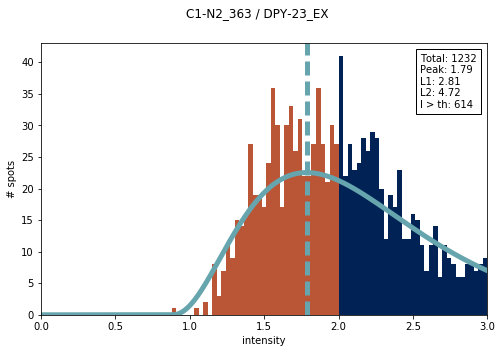

error: L1, L2 [5.4444618725492004, 8.2483966900856132]
peak center: 1.0303030303


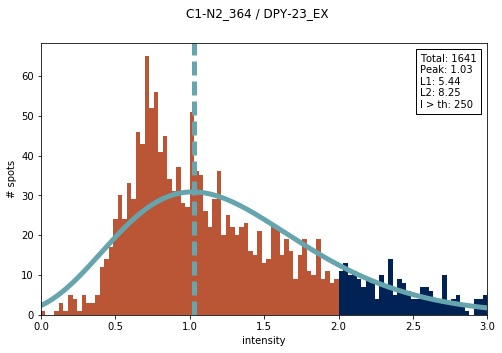

error: L1, L2 [3.1586066943859881, 4.4579500213678127]
peak center: 1.0303030303


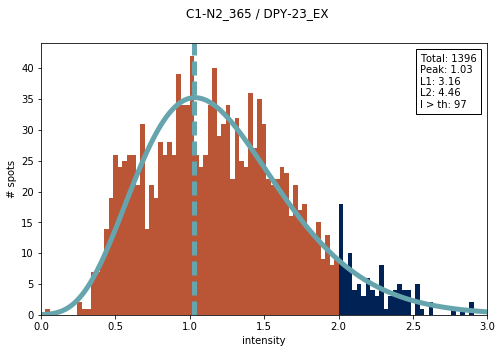

error: L1, L2 [9.6450849400810714, 13.078421194728417]
peak center: 1.0


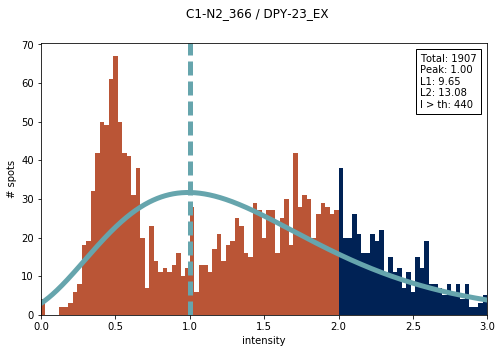

error: L1, L2 [4.4683398661397273, 6.4069404958752223]
peak center: 1.09090909091


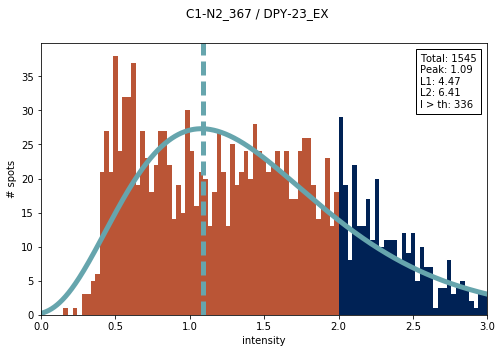

error: L1, L2 [4.6366922049512542, 7.4441793833533252]
peak center: 1.0303030303


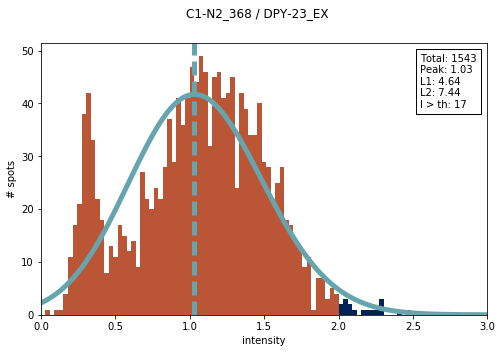

error: L1, L2 [4.3484830632470635, 5.8777008777389739]
peak center: 1.0303030303


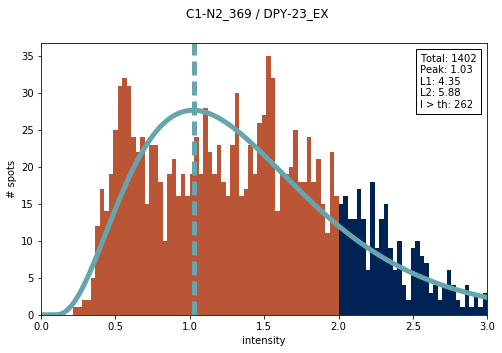

error: L1, L2 [2.6814010601264733, 4.6960247611737422]
peak center: 1.0


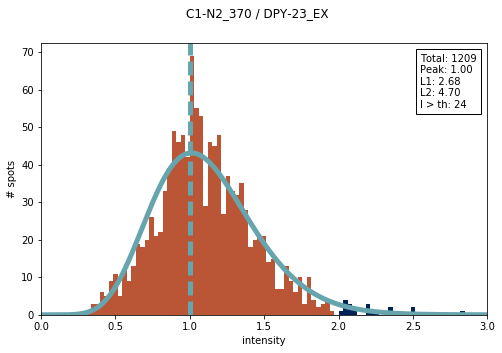

error: L1, L2 [2.4232706758898392, 4.0353054162602149]
peak center: 0.969696969697


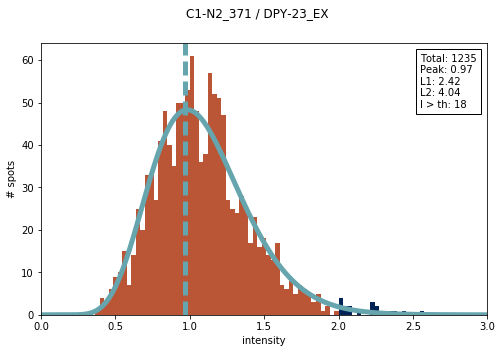

error: L1, L2 [2.3727605228245441, 3.9411556003928108]
peak center: 0.969696969697


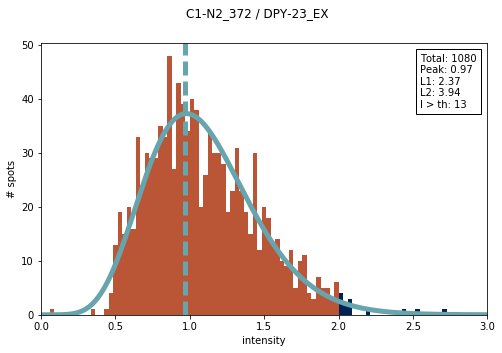

error: L1, L2 [2.4193785551743106, 4.240802948691039]
peak center: 0.969696969697


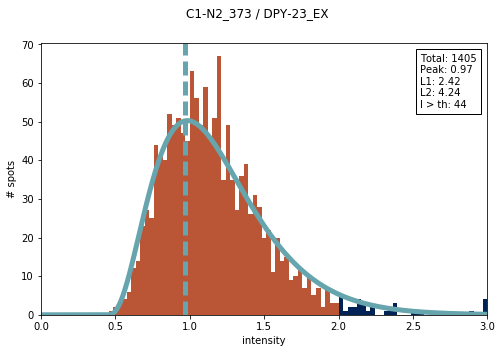

error: L1, L2 [2.0452049641014383, 3.7087042451553898]
peak center: 0.969696969697


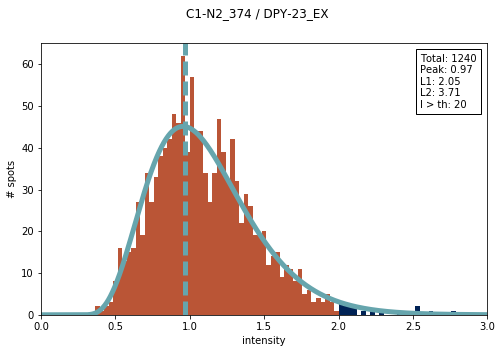

error: L1, L2 [2.4842197381113911, 4.1570496618518824]
peak center: 0.969696969697


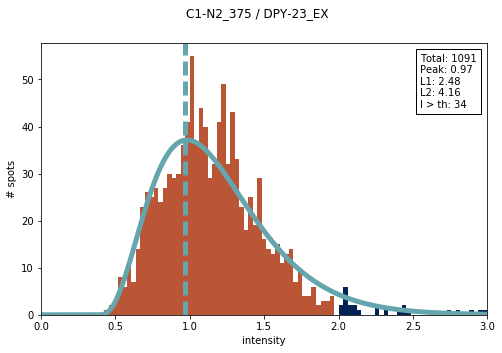

error: L1, L2 [5.1121709222556486, 7.9562369178787637]
peak center: 0.909090909091


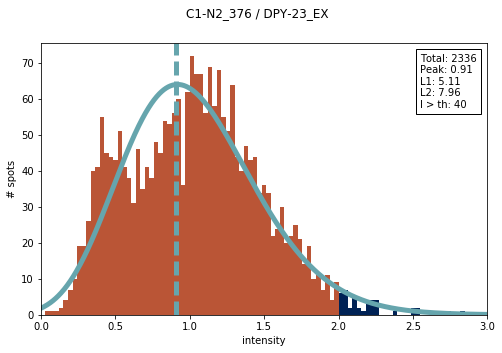

error: L1, L2 [2.8927251968975822, 4.6110497761677944]
peak center: 1.0303030303


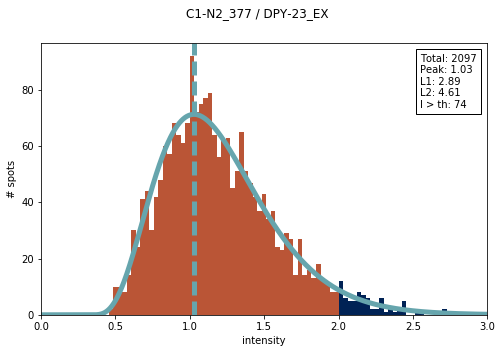

error: L1, L2 [4.8264625448457732, 7.1554555555148198]
peak center: 1.06060606061


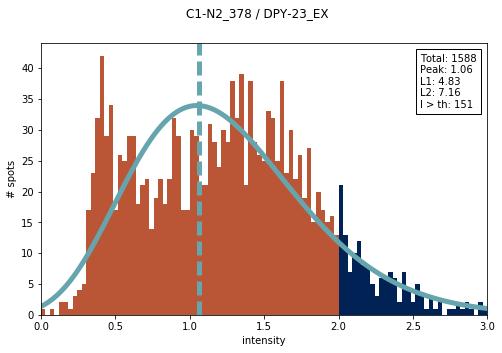

error: L1, L2 [1.9972716495111202, 4.1132249992839505]
peak center: 1.0


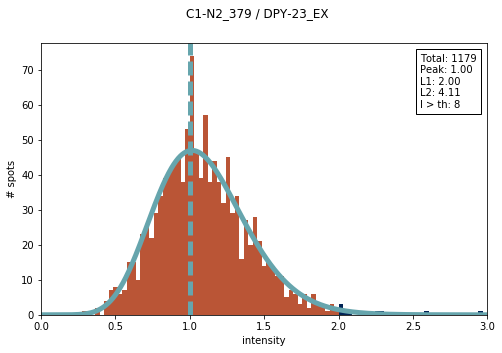

error: L1, L2 [2.1815987991539489, 3.8561969702821282]
peak center: 1.0


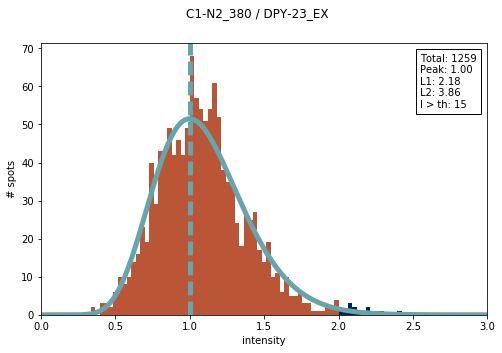

error: L1, L2 [1.9118330492454338, 3.2891058308649739]
peak center: 1.0


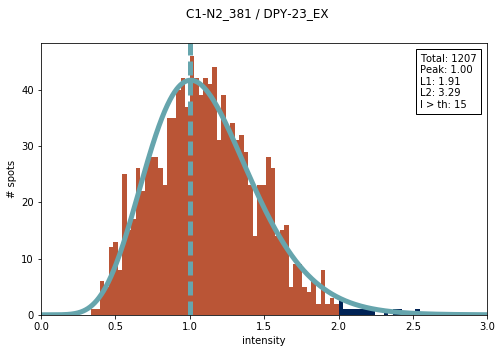

error: L1, L2 [2.1266516986585748, 3.3614931782206012]
peak center: 1.0


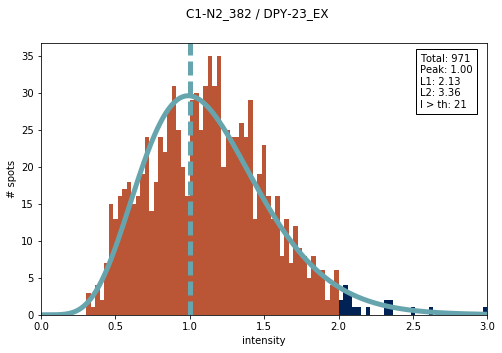

error: L1, L2 [3.0233817734303678, 4.3071629936052807]
peak center: 1.0


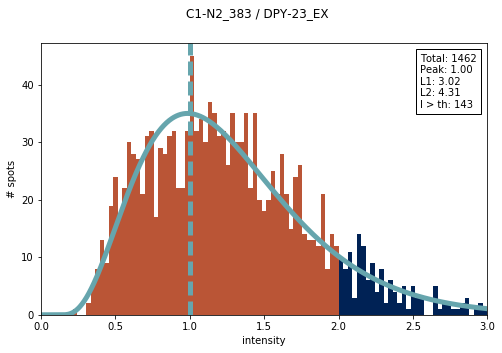

error: L1, L2 [2.4428246543368664, 3.9777433009060239]
peak center: 1.0


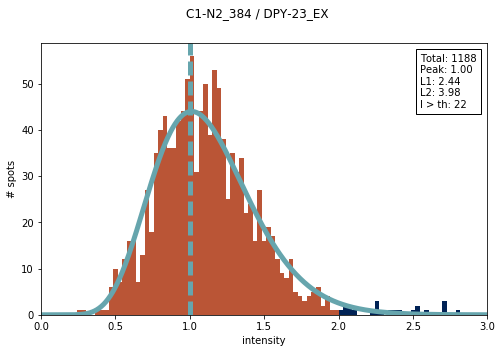

error: L1, L2 [2.9081454802378657, 4.4257988454064572]
peak center: 1.0


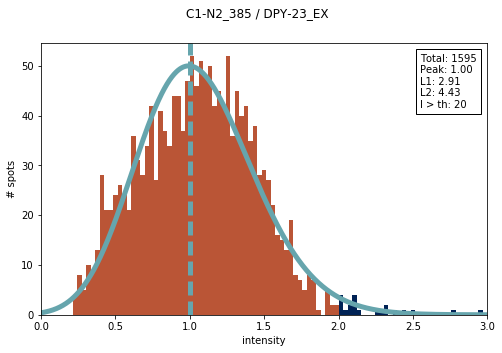

error: L1, L2 [3.2407023356858216, 4.4880250811094076]
peak center: 1.0303030303


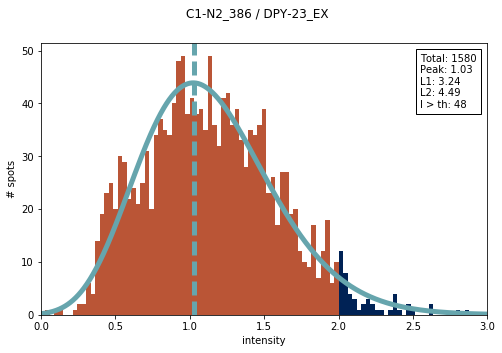

error: L1, L2 [2.3102322239988773, 4.0589459681274391]
peak center: 1.0


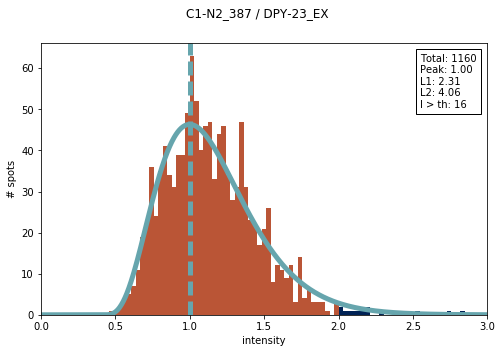

/Users/kkolyva/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1654: RuntimeWarning: invalid value encountered in true_divide
  place(output, cond, self._pdf(*goodargs) / scale)


error: L1, L2 [2.6058767919010641, 4.3486256048955525]
peak center: 1.0


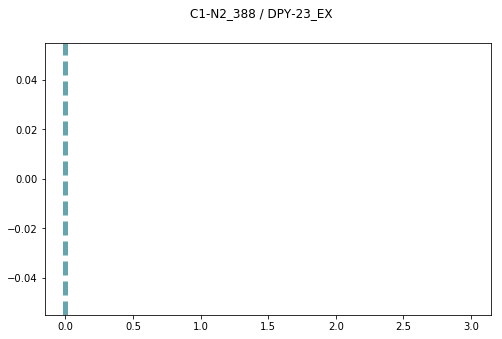

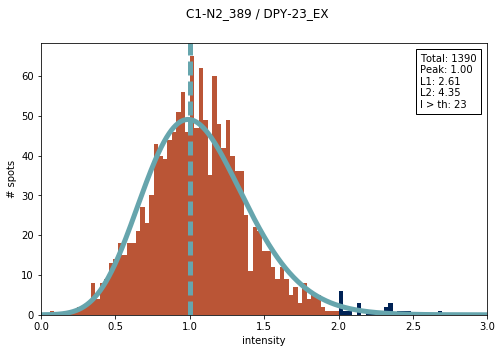

error: L1, L2 [3.1364644357853773, 4.173542471690034]
peak center: 1.0303030303


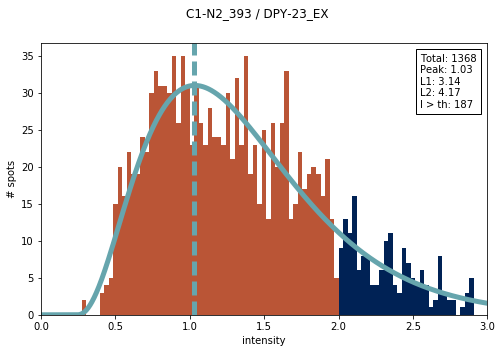

error: L1, L2 [2.9564746066259828, 4.8664726552280282]
peak center: 1.0303030303


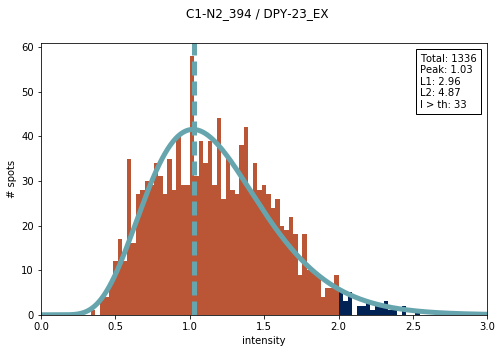

error: L1, L2 [3.4834180071873502, 5.0861004719294689]
peak center: 1.06060606061


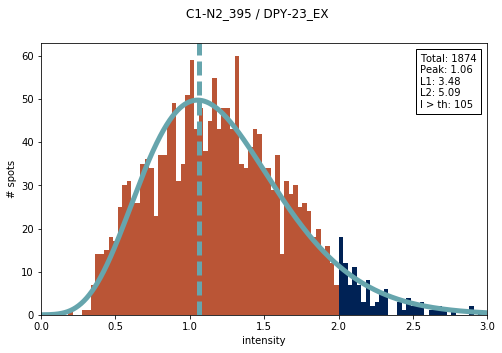

error: L1, L2 [3.2145702968140779, 5.5695680731013448]
peak center: 1.0303030303


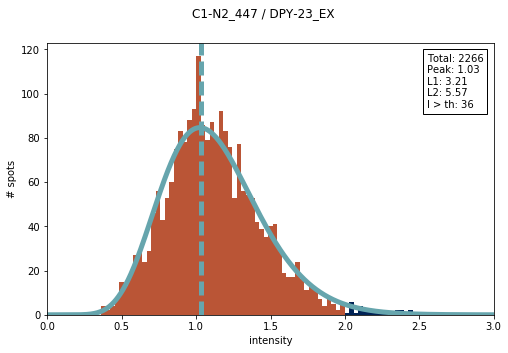

error: L1, L2 [4.6611301999223684, 9.2481720916991215]
peak center: 1.0


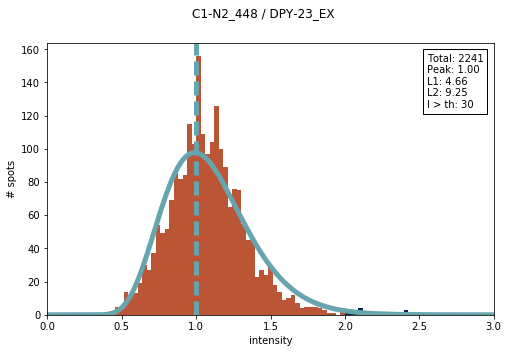

error: L1, L2 [3.0131101803800595, 5.0182438823880595]
peak center: 0.969696969697


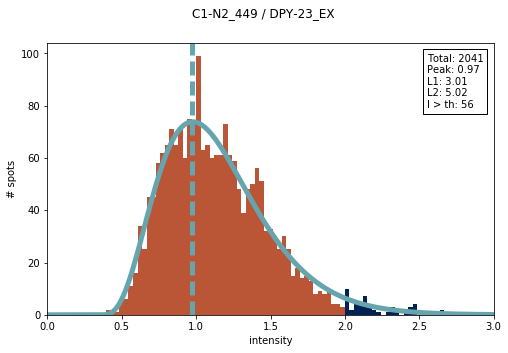

error: L1, L2 [8.1945350585692811, 15.992168178421265]
peak center: 0.939393939394


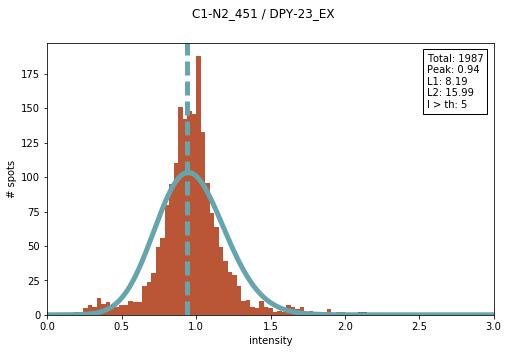

error: L1, L2 [3.1263419600696469, 6.1460394778195369]
peak center: 1.0


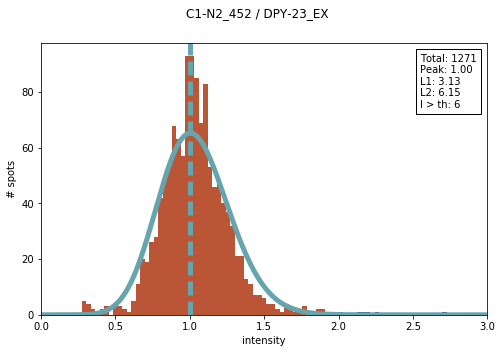

error: L1, L2 [3.4906771673433976, 6.2848049707439859]
peak center: 0.969696969697


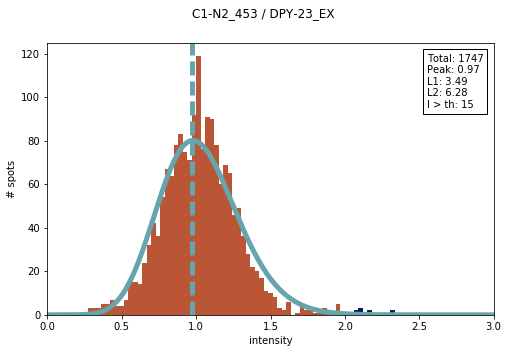

error: L1, L2 [4.3993533022317886, 9.0447525824233868]
peak center: 0.939393939394


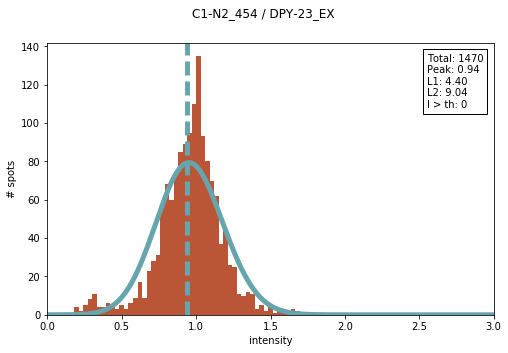

error: L1, L2 [2.23170996144917, 5.1036240465967566]
peak center: 0.969696969697


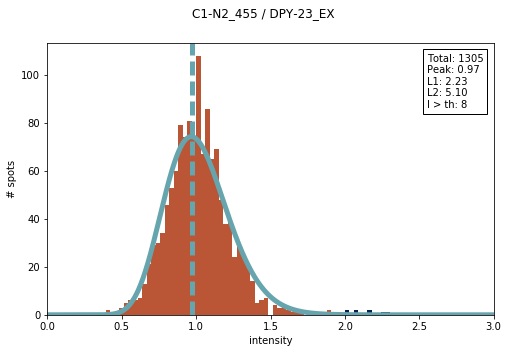

error: L1, L2 [2.5447355759197352, 5.2307778678000583]
peak center: 0.969696969697


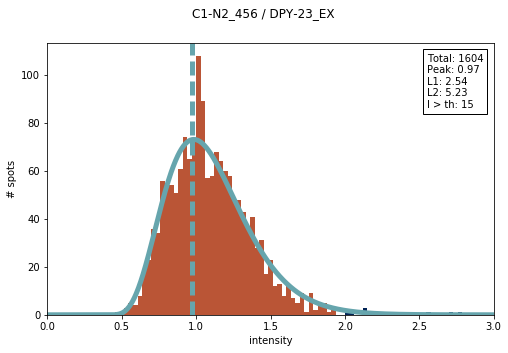

error: L1, L2 [3.1544587682105911, 5.4666005028867097]
peak center: 1.0303030303


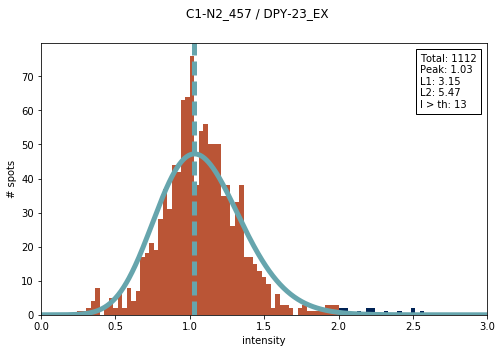

error: L1, L2 [3.0575264628234651, 5.0592933133633835]
peak center: 1.0


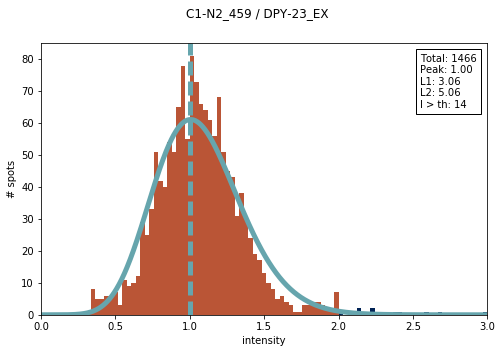

error: L1, L2 [7.3766519378302622, 14.288161365132169]
peak center: 1.0


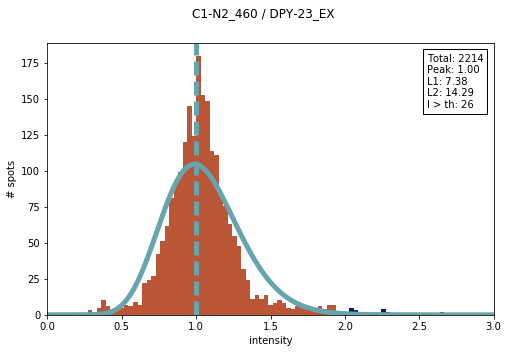

error: L1, L2 [4.7392863752991481, 8.8169645739230678]
peak center: 0.969696969697


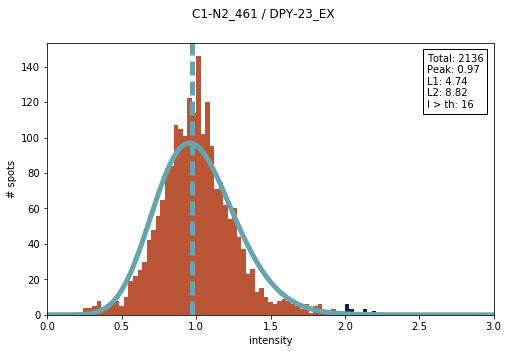

error: L1, L2 [6.560236471642356, 11.913135002515286]
peak center: 0.969696969697


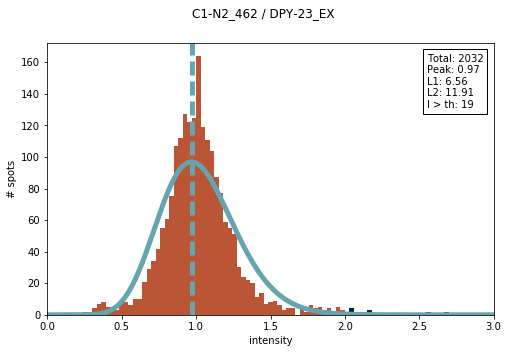

error: L1, L2 [6.4238595067463757, 11.585215575839436]
peak center: 0.969696969697


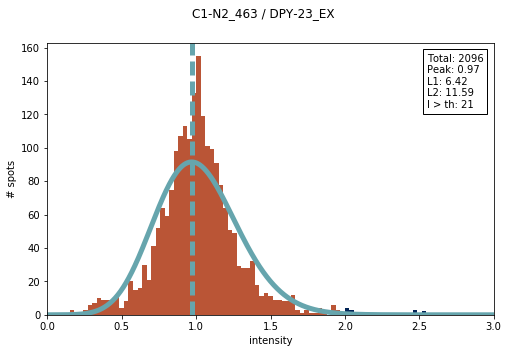

error: L1, L2 [3.8947189113057745, 7.8308183416915425]
peak center: 0.969696969697


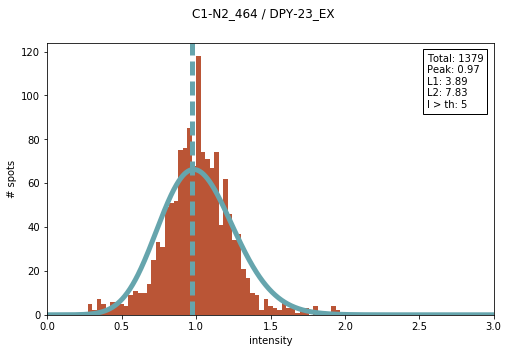

error: L1, L2 [26.341546203137423, 62.590227320021249]
peak center: 0.212121212121


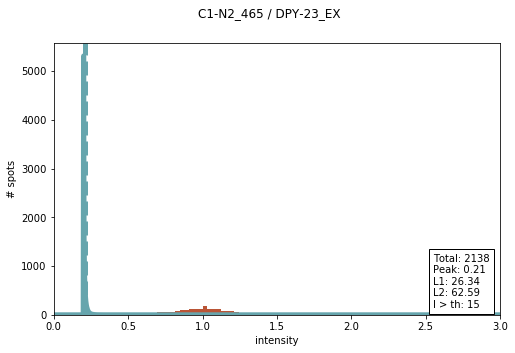

error: L1, L2 [2.7259042728743577, 4.4446236285878982]
peak center: 0.969696969697


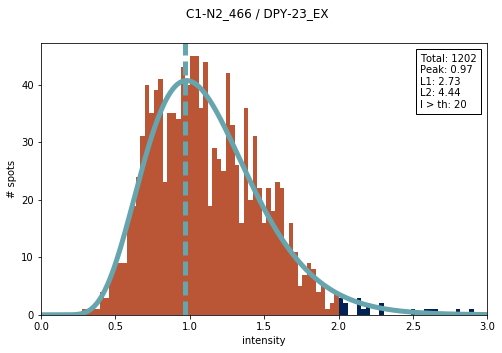

error: L1, L2 [3.0671655443910923, 5.4147596251270063]
peak center: 1.87878787879


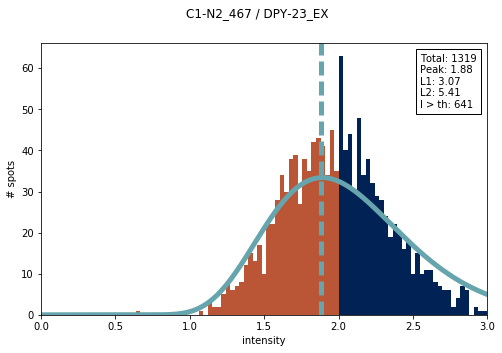

error: L1, L2 [3.7654544401517112, 7.6173716798376301]
peak center: 1.0


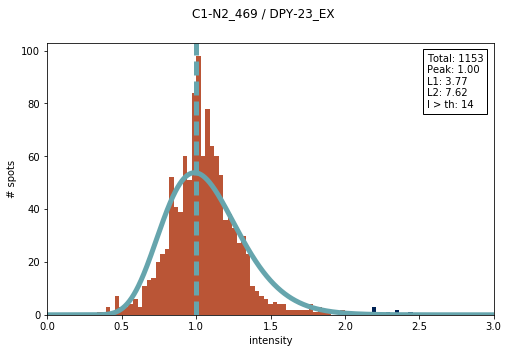

error: L1, L2 [5.0561048037772709, 9.1397642688774852]
peak center: 1.0303030303


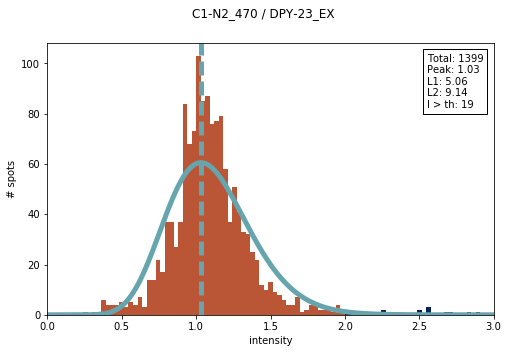

error: L1, L2 [4.5744830761641753, 7.8127948721639084]
peak center: 1.0


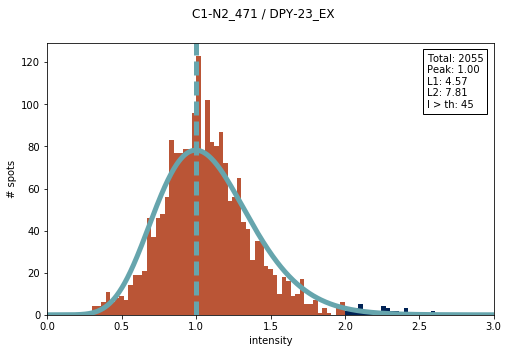

error: L1, L2 [4.1367699523948733, 6.9213591932139948]
peak center: 1.0


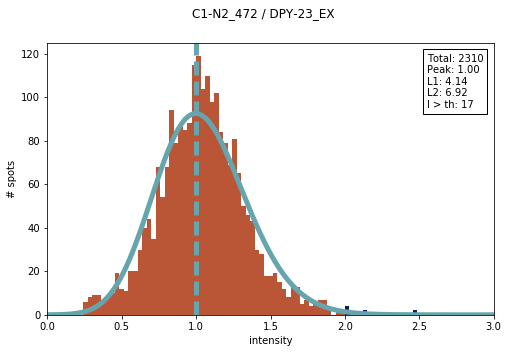

error: L1, L2 [4.4039480034757243, 8.197755469192332]
peak center: 1.0


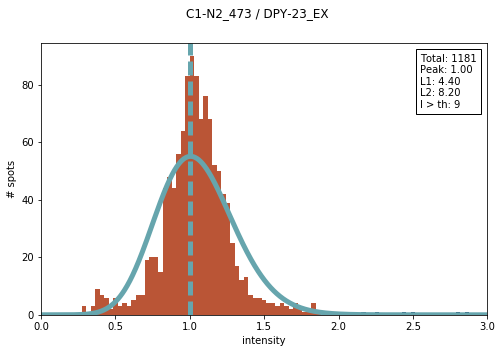

error: L1, L2 [6.5503978935927822, 11.649909010475531]
peak center: 1.0


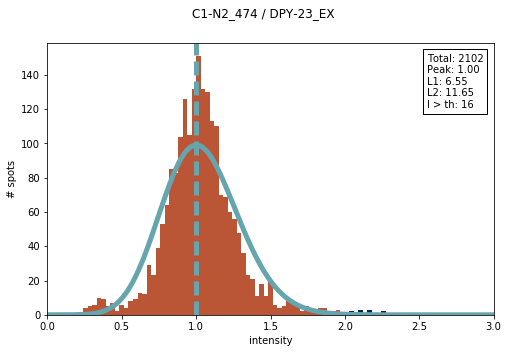

error: L1, L2 [4.2169234487173552, 8.1698519577051805]
peak center: 1.0303030303


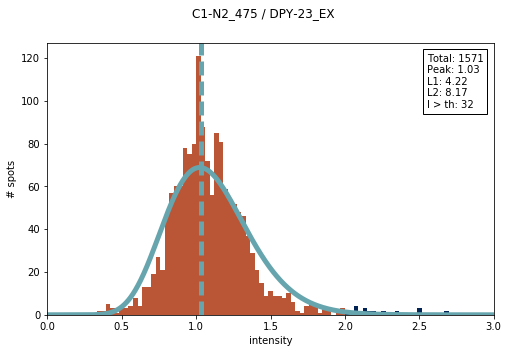

error: L1, L2 [2.5320961778628797, 4.6062887266919681]
peak center: 0.969696969697


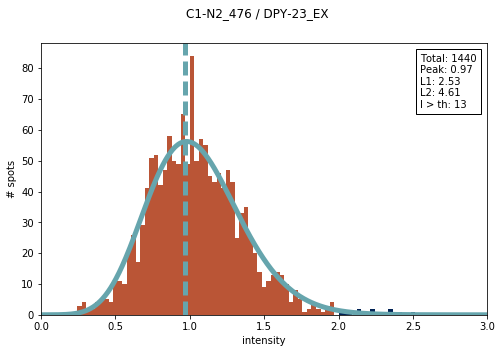

error: L1, L2 [4.4505828540385934, 7.8606364475181776]
peak center: 0.969696969697


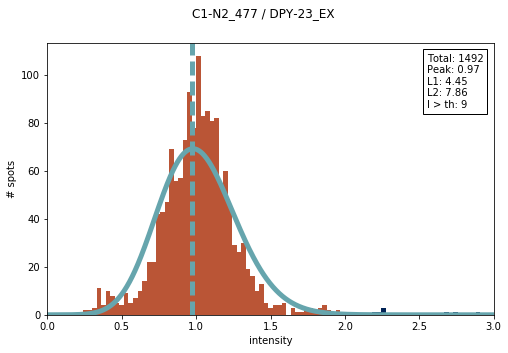

error: L1, L2 [4.3021161895113638, 9.9193795184000297]
peak center: 0.969696969697


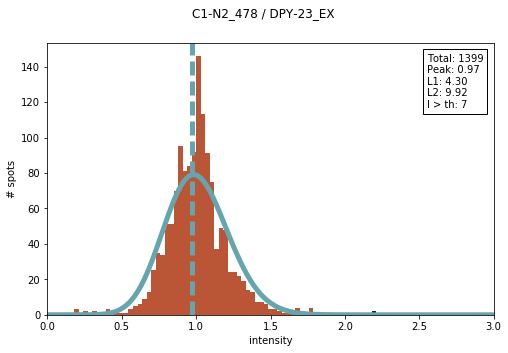

error: L1, L2 [6.1412821427828108, 10.773246341368949]
peak center: 0.939393939394


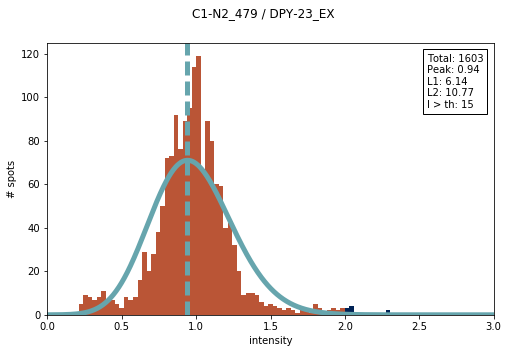

error: L1, L2 [2.3867331416155642, 3.719603353602964]
peak center: 1.06060606061


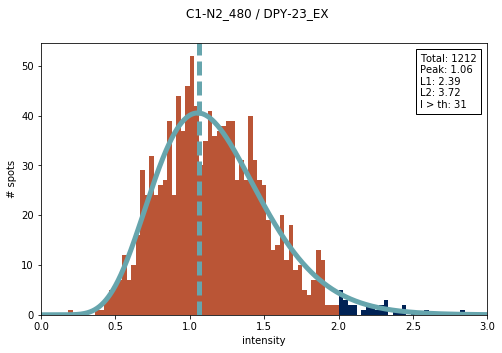

error: L1, L2 [3.714666273257941, 7.5077440542109972]
peak center: 0.969696969697


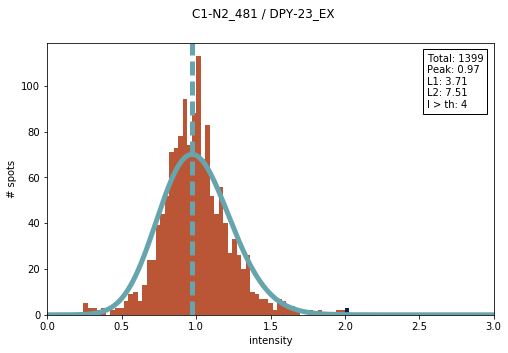

error: L1, L2 [2.5397751744499573, 4.8183869640870443]
peak center: 1.0303030303


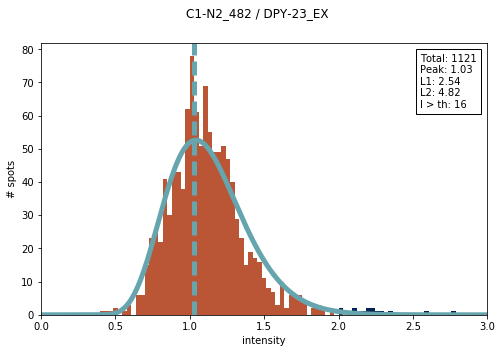

error: L1, L2 [3.0340537042944611, 5.0636967139108782]
peak center: 1.06060606061


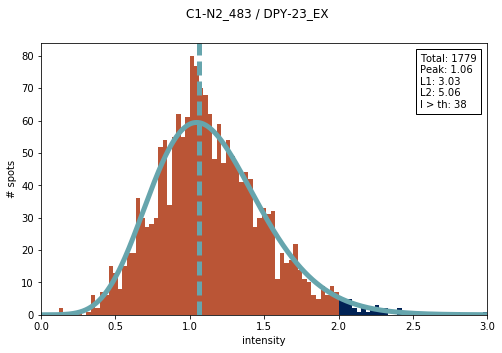

error: L1, L2 [2.9919825845927392, 7.4310298406916067]
peak center: 1.0


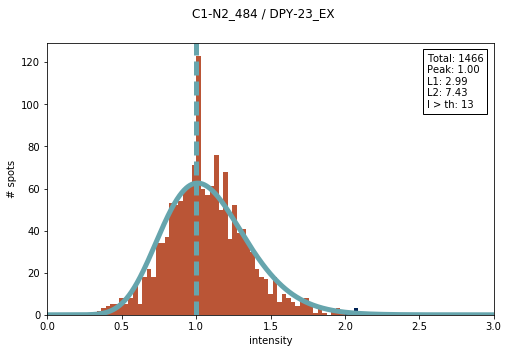

error: L1, L2 [4.0492907939219398, 7.6535198492757051]
peak center: 1.0


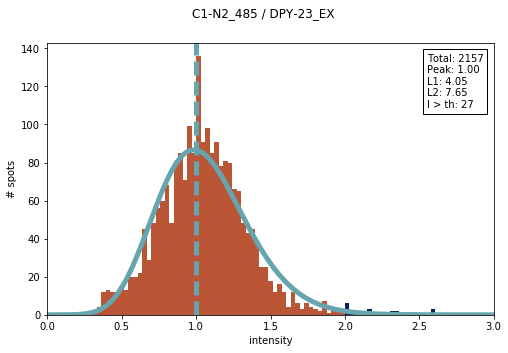

error: L1, L2 [26.642839135860513, 53.021174536447823]
peak center: 0.151515151515


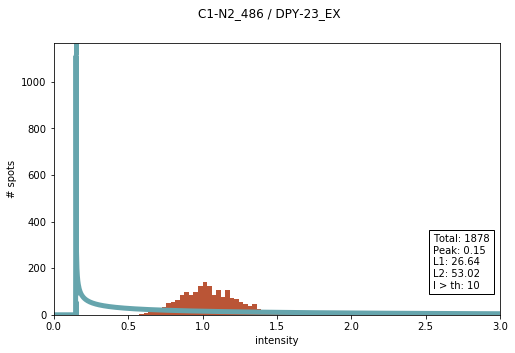

error: L1, L2 [4.708290412398215, 10.332639198921855]
peak center: 1.0


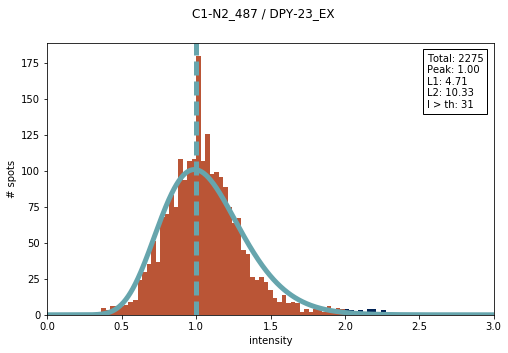

error: L1, L2 [2.9500366274547751, 6.5012362935245021]
peak center: 1.0


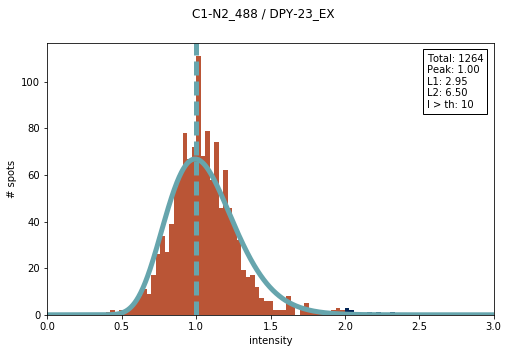

error: L1, L2 [6.3387581595854536, 12.774015992012528]
peak center: 1.0


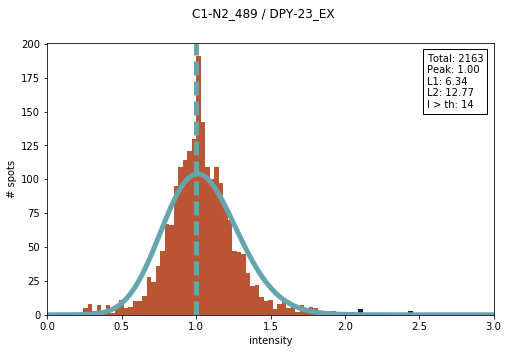

error: L1, L2 [4.3114648635649981, 8.4380722399452228]
peak center: 0.939393939394


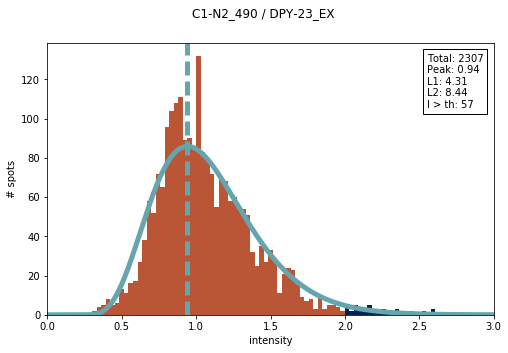

error: L1, L2 [3.0198870111468441, 5.8493280908944607]
peak center: 1.0


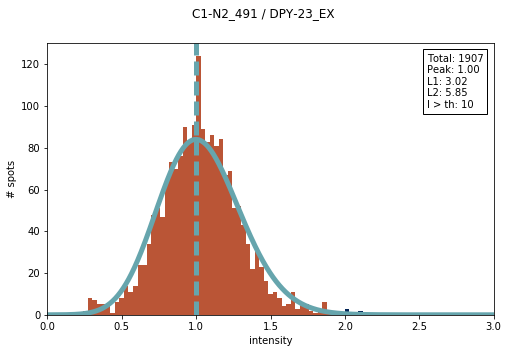

error: L1, L2 [5.6149591010179778, 9.8701637726025044]
peak center: 1.0303030303


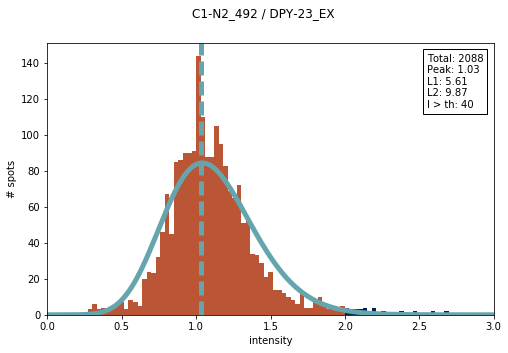

error: L1, L2 [5.2060068377714668, 10.84605896976981]
peak center: 0.969696969697


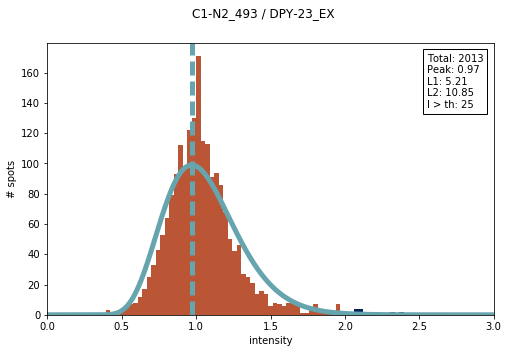

error: L1, L2 [3.2638287766798548, 5.3689462320230206]
peak center: 1.45454545455


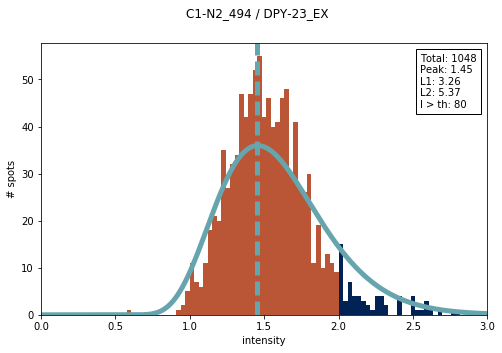

error: L1, L2 [4.5952254189037109, 8.8664691251953407]
peak center: 1.0


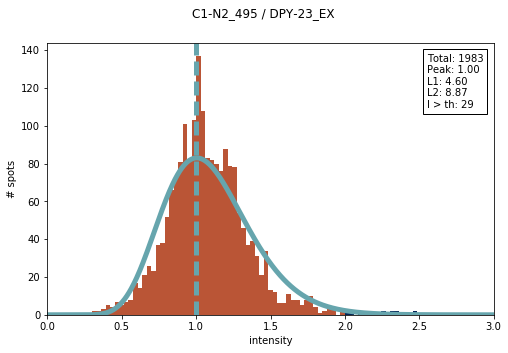

error: L1, L2 [5.6451954078312196, 11.303344362944161]
peak center: 1.0303030303


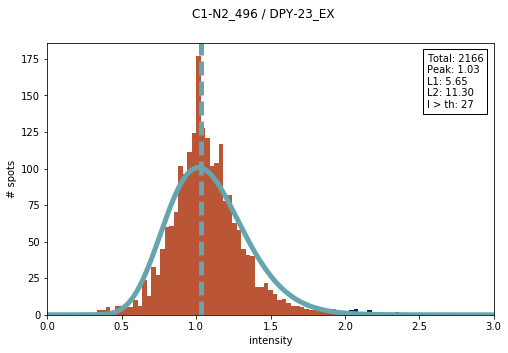

error: L1, L2 [3.6600067322390735, 6.9502805821901212]
peak center: 0.969696969697


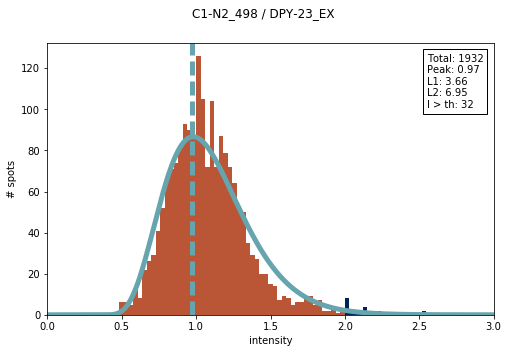

error: L1, L2 [3.189424709172143, 6.5965475733556298]
peak center: 1.0303030303


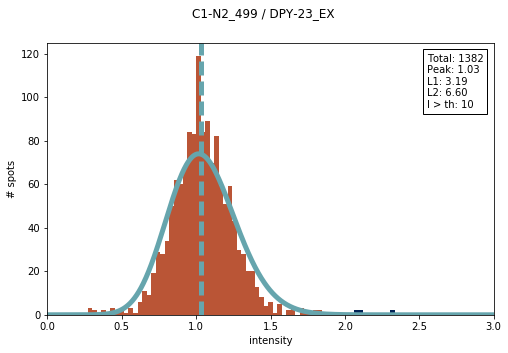

error: L1, L2 [4.2222868659044535, 8.9220044411258428]
peak center: 1.0303030303


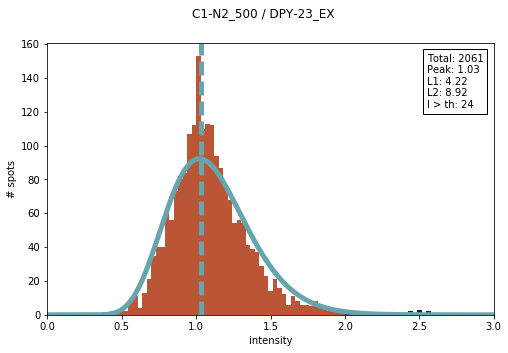

error: L1, L2 [4.8539919075278863, 10.11786025773077]
peak center: 1.06060606061


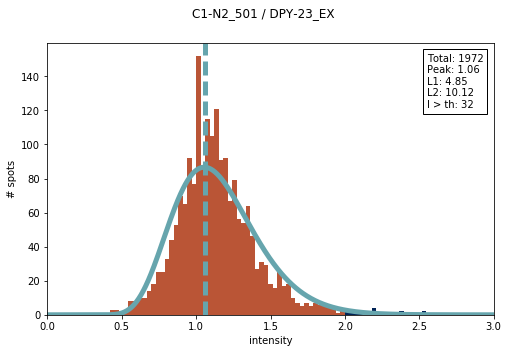

error: L1, L2 [3.352472048415728, 6.3771143528324421]
peak center: 1.0


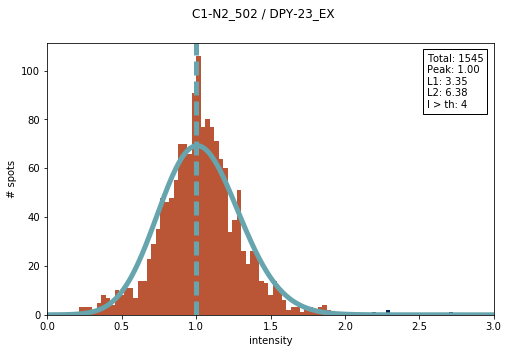

error: L1, L2 [6.2743705482944545, 11.879258019180533]
peak center: 0.909090909091


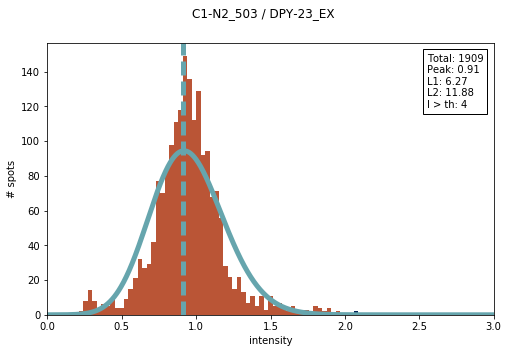

error: L1, L2 [3.1971052302884391, 5.9743908476671841]
peak center: 1.0303030303


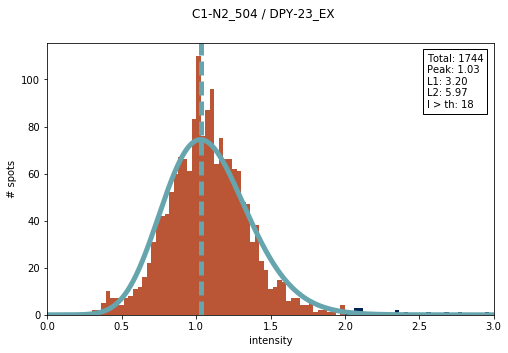

error: L1, L2 [27.456197919563223, 70.639351009171605]
peak center: 0.0909090909091


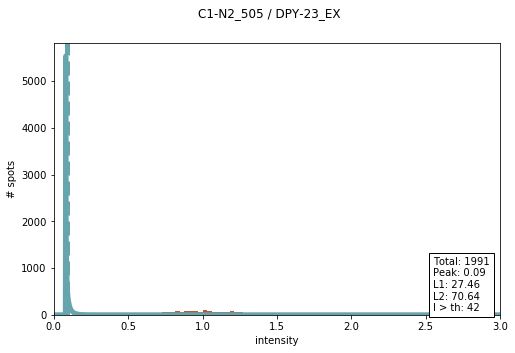

error: L1, L2 [33.955471008494527, 105.64610561477029]
peak center: 0.30303030303


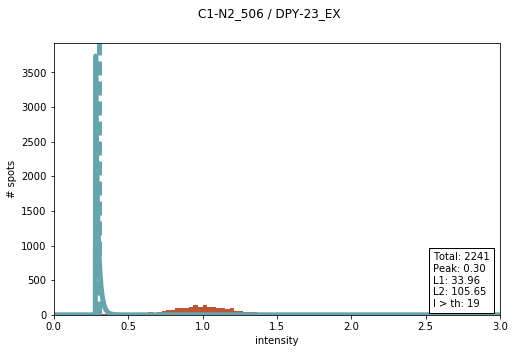

error: L1, L2 [6.7103345412628954, 12.330834448587861]
peak center: 1.0


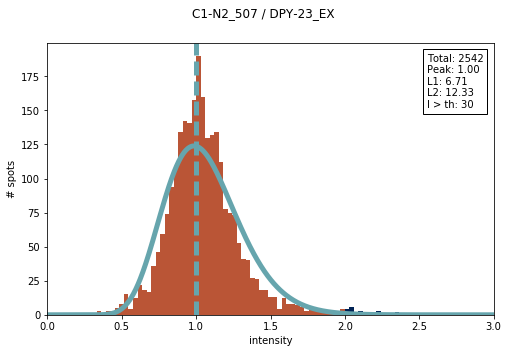

error: L1, L2 [3.6159368737771627, 5.6835687184485035]
peak center: 0.969696969697


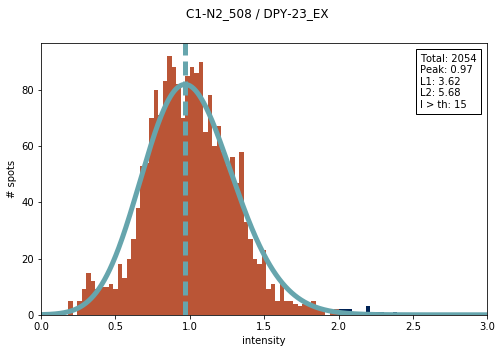

error: L1, L2 [4.0127742644540243, 7.2800033528867703]
peak center: 1.0


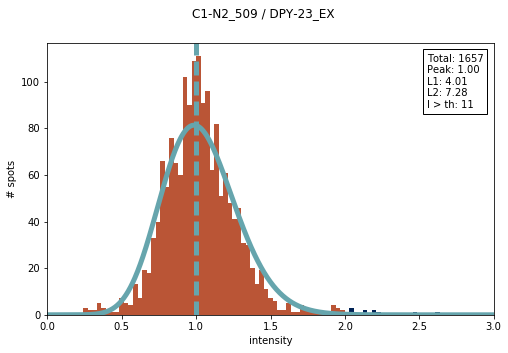

error: L1, L2 [3.0855820530289799, 5.0754330763100812]
peak center: 1.0


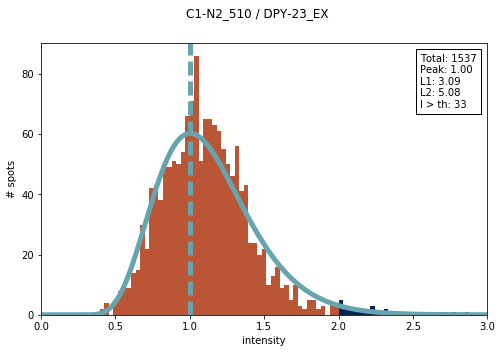

error: L1, L2 [5.3560071566015806, 9.9285894798188945]
peak center: 1.06060606061


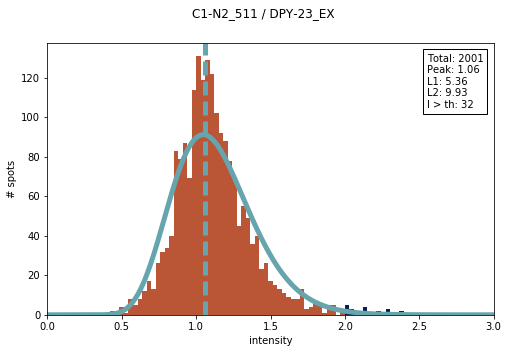

error: L1, L2 [5.0331506492028719, 8.9880673014117392]
peak center: 1.0


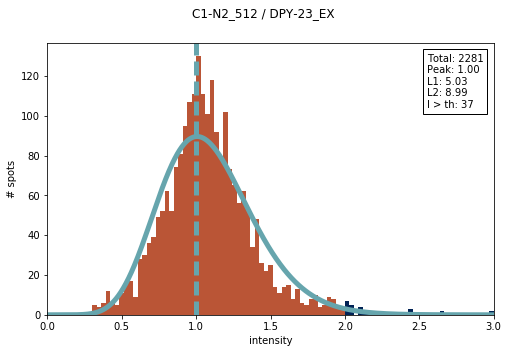

error: L1, L2 [3.2992788427901858, 7.440966408053904]
peak center: 1.0303030303


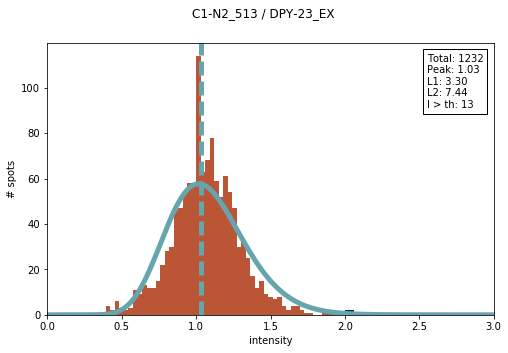

error: L1, L2 [3.0892244099603823, 5.6460061118917348]
peak center: 0.939393939394


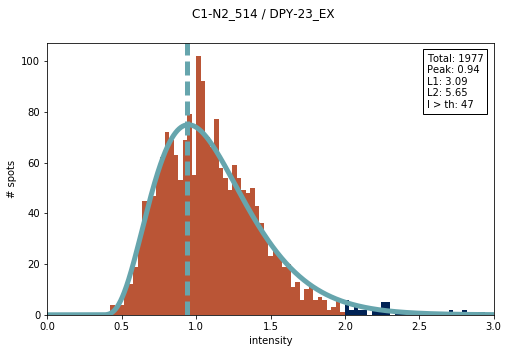

error: L1, L2 [2.113828933932572, 4.8048249395078182]
peak center: 1.0


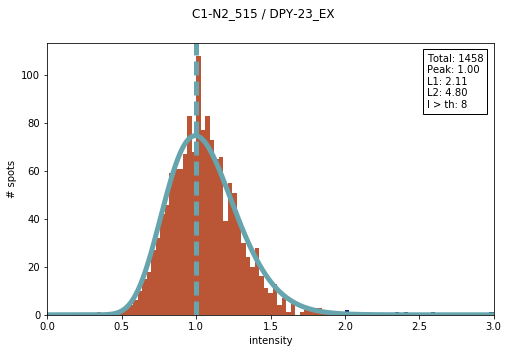

error: L1, L2 [2.6064586537960732, 4.411006503578581]
peak center: 0.939393939394


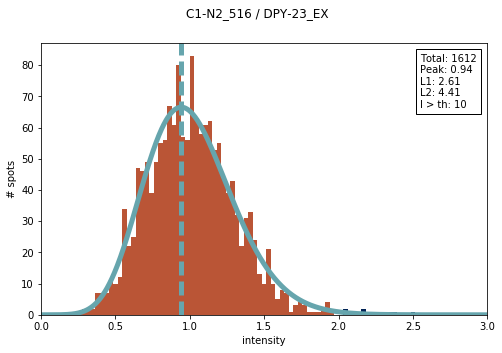

error: L1, L2 [2.1561312352268671, 3.5325603733454982]
peak center: 1.0


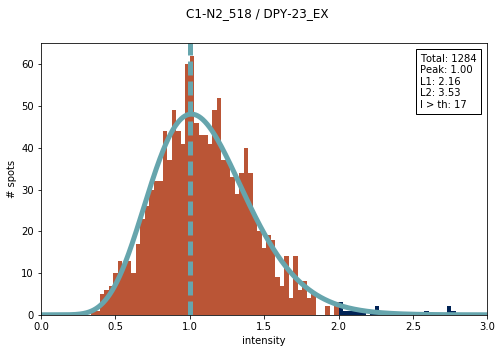

error: L1, L2 [1.9031719717480635, 4.4164536840405235]
peak center: 0.909090909091


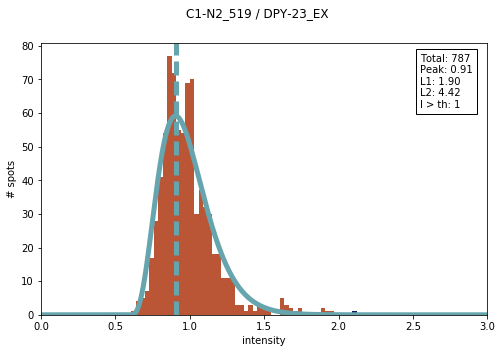

error: L1, L2 [13.025837562446835, 25.192581833651463]
peak center: 0.666666666667


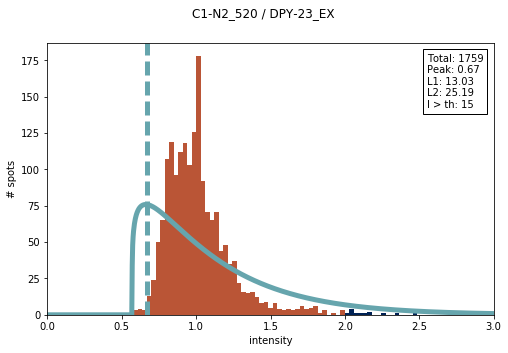

error: L1, L2 [3.8683111856111472, 6.7569939184411529]
peak center: 1.0


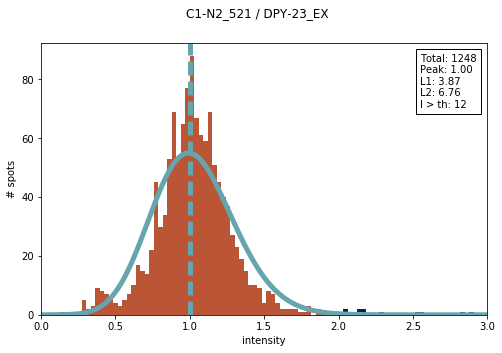

error: L1, L2 [4.4077078478212561, 8.0992803619015632]
peak center: 0.939393939394


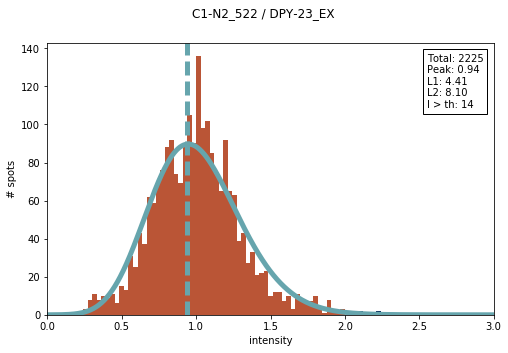

error: L1, L2 [6.0394919032099494, 11.87209827600523]
peak center: 0.939393939394


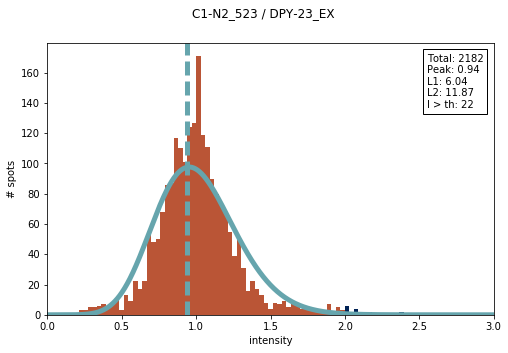

error: L1, L2 [2.9017076597469722, 5.4935394037707717]
peak center: 0.818181818182


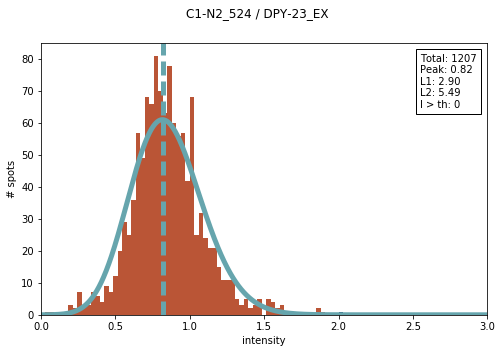

error: L1, L2 [3.3678842290884115, 8.4561397882211562]
peak center: 0.969696969697


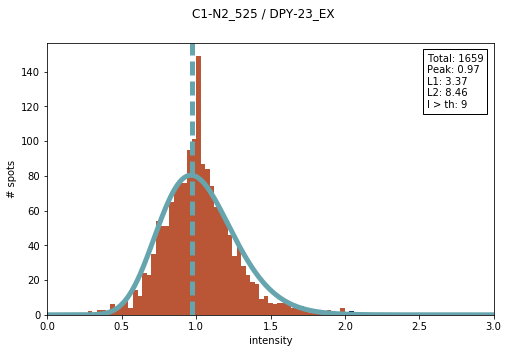

error: L1, L2 [4.0223359114501713, 7.0136924241062761]
peak center: 0.969696969697


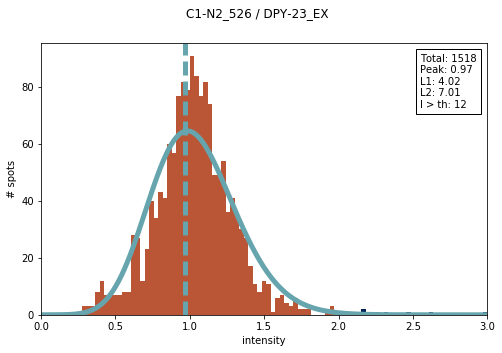

error: L1, L2 [3.13199641331334, 5.2989999965609309]
peak center: 1.30303030303


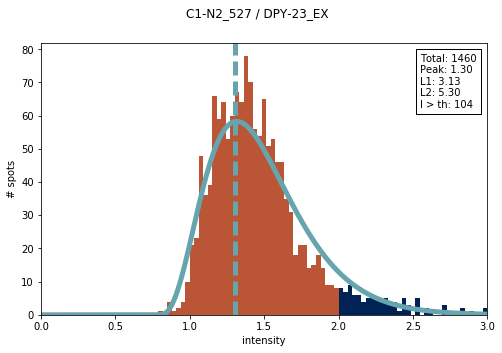

error: L1, L2 [25.571964753137706, 48.519785231822908]
peak center: 0.0


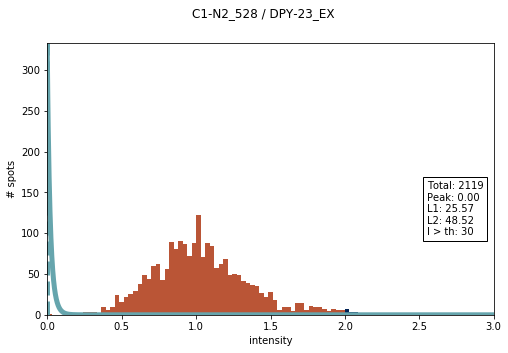

error: L1, L2 [2.4081588085739787, 4.178084308789467]
peak center: 1.06060606061


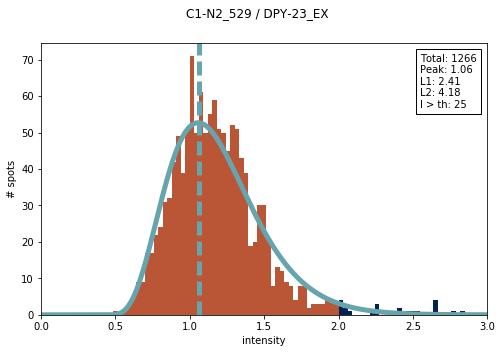

error: L1, L2 [4.4431469643070152, 8.2886474756773048]
peak center: 1.0


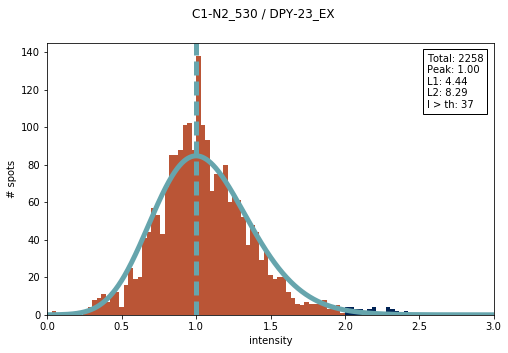

error: L1, L2 [2.4701927745576939, 3.8413156300101425]
peak center: 0.969696969697


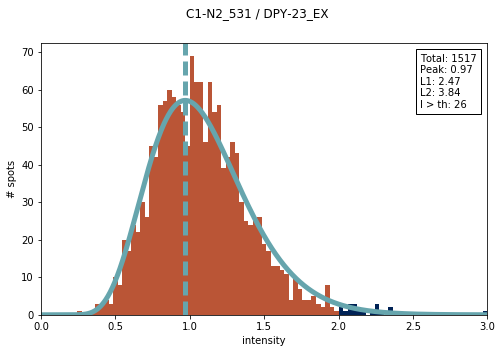

error: L1, L2 [2.5867937164251047, 4.5907642588346356]
peak center: 0.969696969697


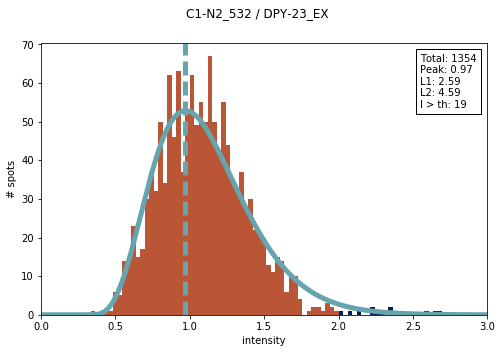

error: L1, L2 [3.0701925206843748, 5.8165449223101247]
peak center: 0.939393939394


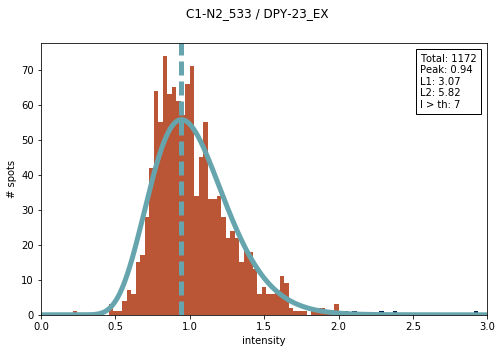

error: L1, L2 [3.4583772164046493, 6.5798663175594232]
peak center: 0.969696969697


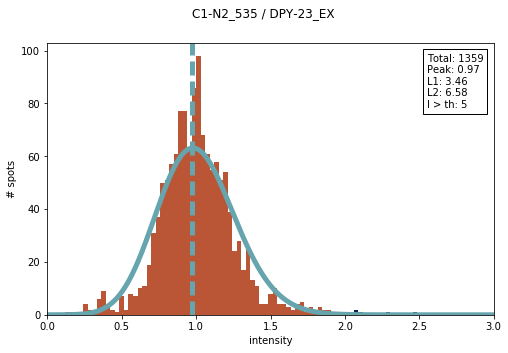

error: L1, L2 [1.8613847080040324, 3.2857947932539484]
peak center: 0.969696969697


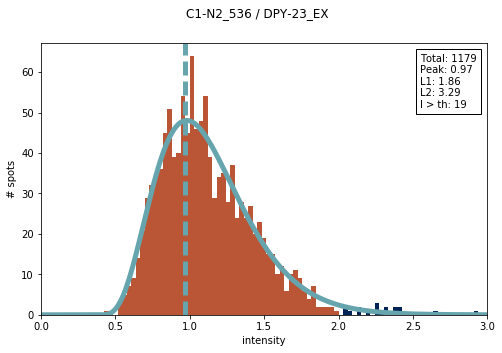

error: L1, L2 [2.3252578488022162, 4.8376991856904326]
peak center: 1.0


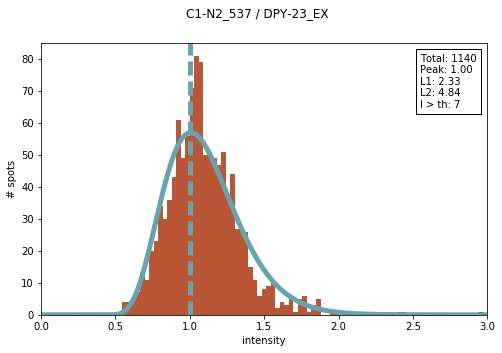

error: L1, L2 [5.9835545330142352, 10.770479515055094]
peak center: 1.0


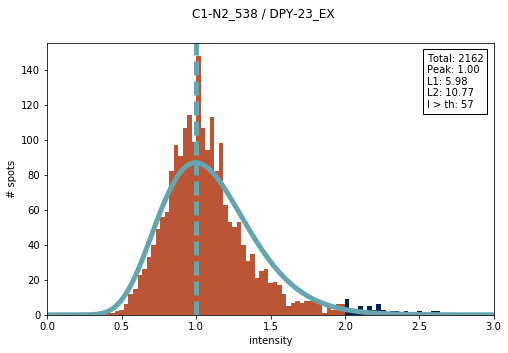

error: L1, L2 [1.9853337613675106, 4.284215921134467]
peak center: 0.969696969697


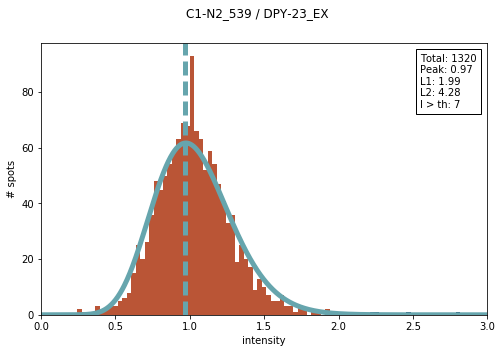

error: L1, L2 [3.9412439856227732, 7.2204277323199761]
peak center: 1.06060606061


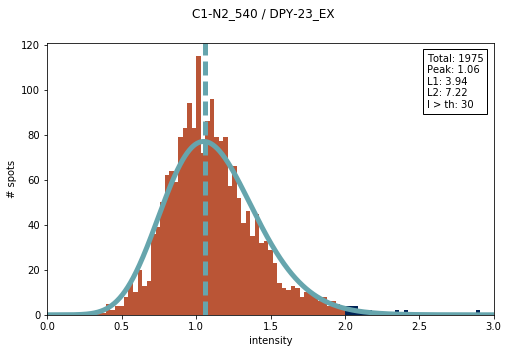

error: L1, L2 [3.6436732720364629, 6.7983698615055665]
peak center: 1.0303030303


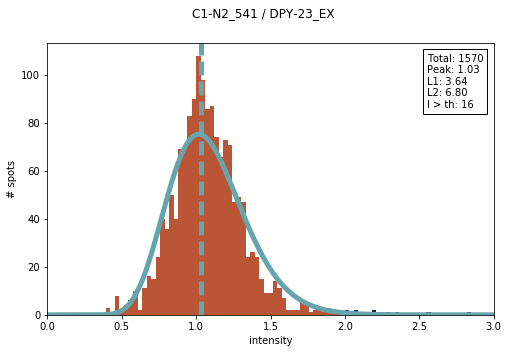

error: L1, L2 [5.4751336936421167, 10.148962768881917]
peak center: 0.969696969697


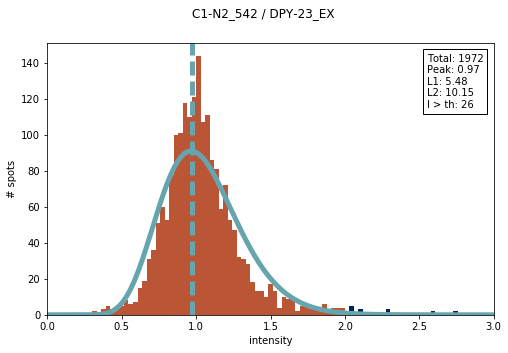

error: L1, L2 [3.6884702185518212, 7.6009281997724383]
peak center: 0.969696969697


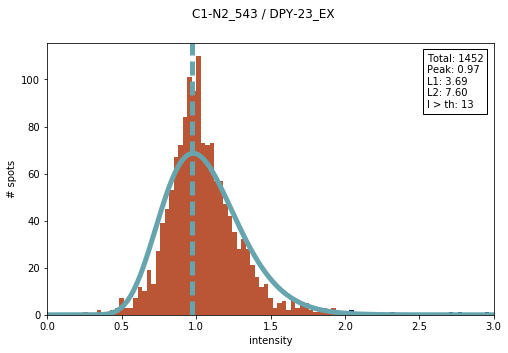

error: L1, L2 [3.4875520884773792, 7.3172207681038941]
peak center: 0.969696969697


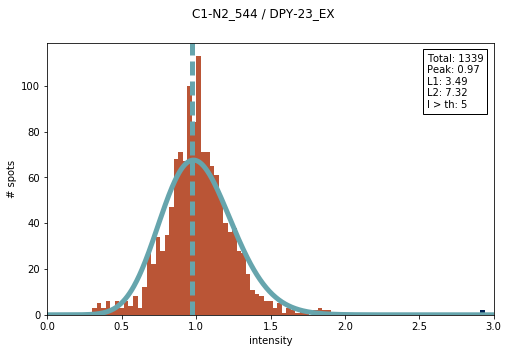

error: L1, L2 [3.9600019365300647, 7.315993036342948]
peak center: 1.0


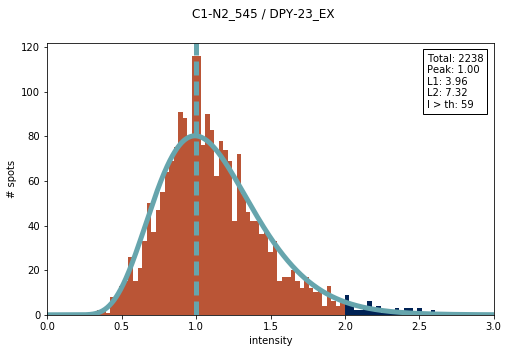

error: L1, L2 [4.9890757373525449, 9.4440835794114619]
peak center: 1.0303030303


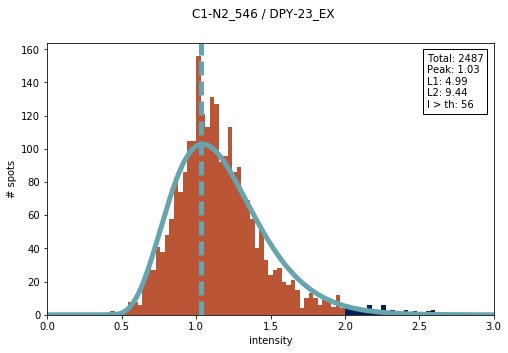

error: L1, L2 [4.0221942772726553, 7.1774893605450121]
peak center: 1.0303030303


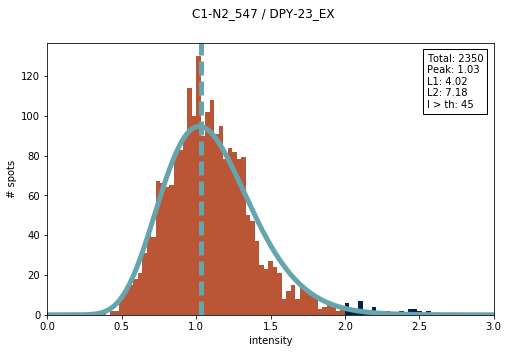

error: L1, L2 [4.0593984884344811, 7.9669085598231817]
peak center: 1.0


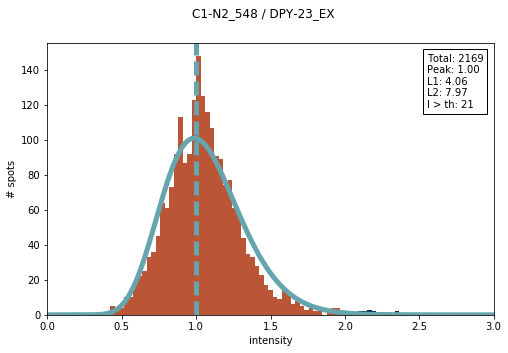

error: L1, L2 [3.9772298107015107, 7.2098849033870591]
peak center: 0.969696969697


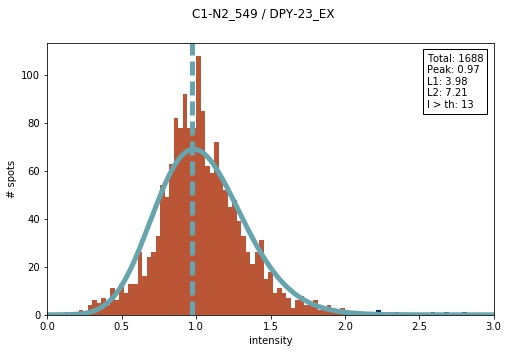

error: L1, L2 [2.4317314485298258, 4.5628066612984535]
peak center: 0.969696969697


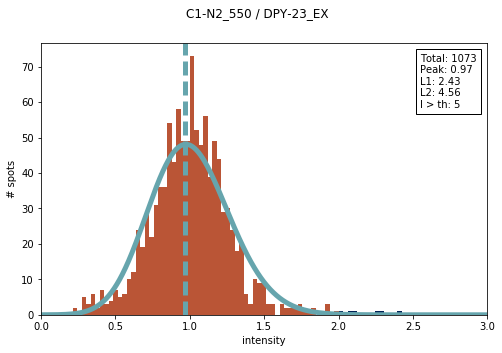

error: L1, L2 [3.3836366985847426, 6.0555093306963315]
peak center: 0.969696969697


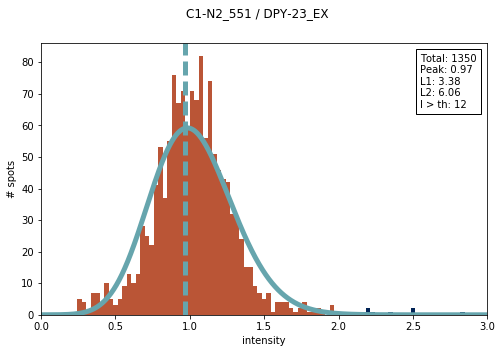

error: L1, L2 [5.4236010094231775, 9.6045347298198909]
peak center: 1.0


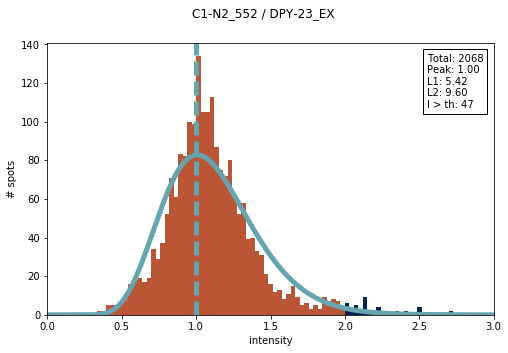

error: L1, L2 [6.4570848957285492, 11.794019289561019]
peak center: 1.0303030303


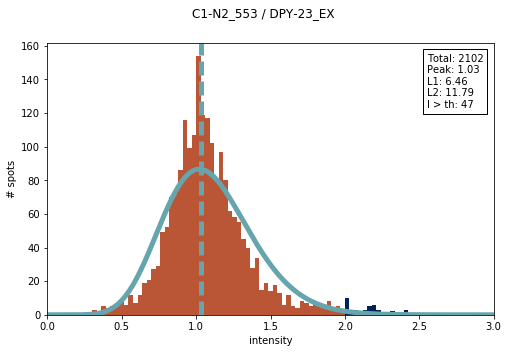

error: L1, L2 [2.8764160613590306, 4.8699125021040777]
peak center: 0.969696969697


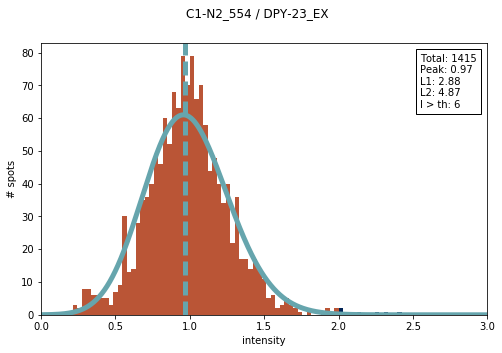

error: L1, L2 [2.8610807466327737, 5.8667707888018779]
peak center: 1.0303030303


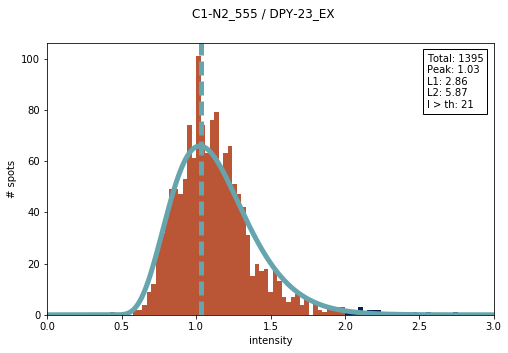

error: L1, L2 [2.7798031545622579, 5.5384197156475947]
peak center: 1.0


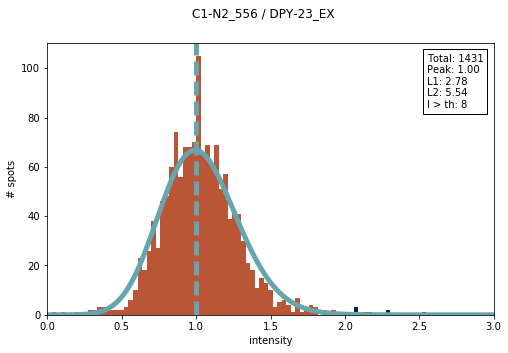

error: L1, L2 [3.5574104105210522, 6.9569785082301188]
peak center: 0.969696969697


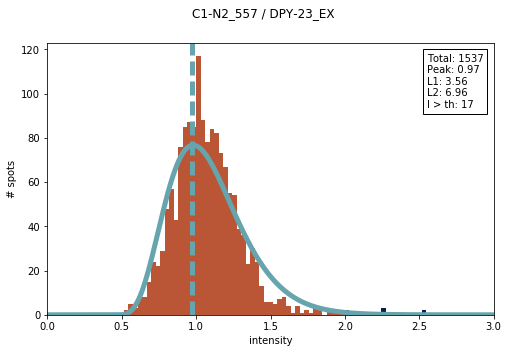

error: L1, L2 [4.6674523544245288, 7.7971047797733632]
peak center: 1.09090909091


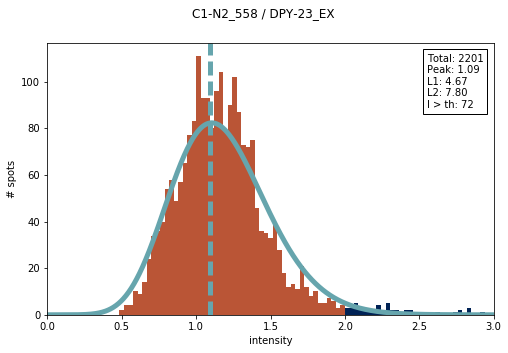

error: L1, L2 [5.7604217443865142, 11.379140203212573]
peak center: 1.0


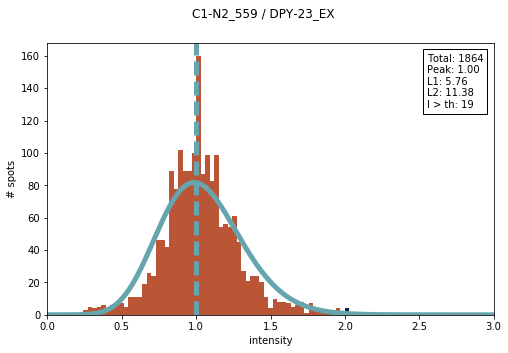

error: L1, L2 [5.4977080098826407, 10.771530924471783]
peak center: 1.0


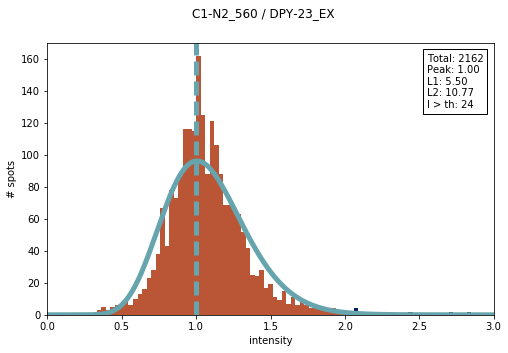

error: L1, L2 [5.4147672813524217, 9.7001503787918644]
peak center: 0.939393939394


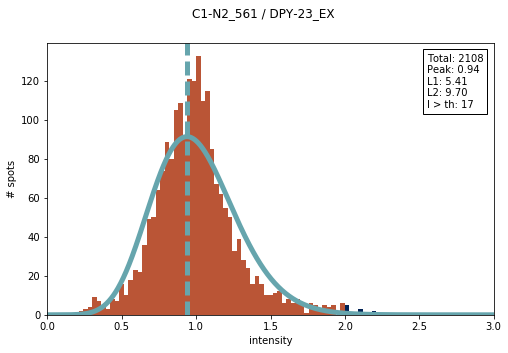

error: L1, L2 [2.4988171429622548, 4.3200544517631156]
peak center: 1.0


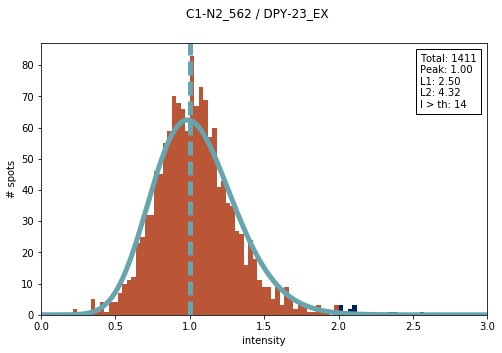

/Users/kkolyva/anaconda3/lib/python3.6/site-packages/numpy/lib/npyio.py:893: UserWarning: loadtxt: Empty input file: "/Users/kkolyva/Downloads/2018-09-11-11-12-10-clean-up/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_563.csv"
  warnings.warn('loadtxt: Empty input file: "%s"' % fname)
/Users/kkolyva/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:408: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


error: L1, L2 [2.9637502834927787, 5.5200729417754042]
peak center: 1.0


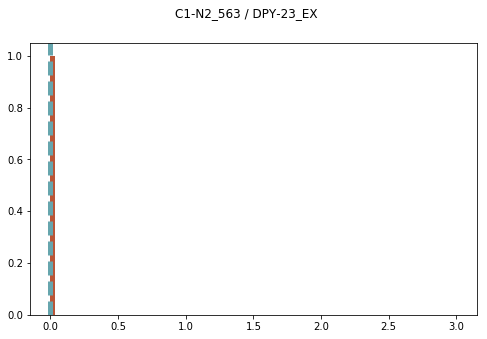

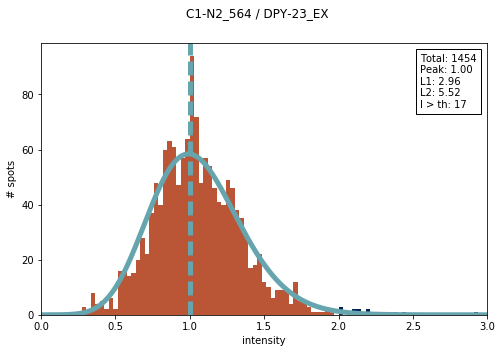

error: L1, L2 [6.2003380752614072, 11.907994542584188]
peak center: 1.0


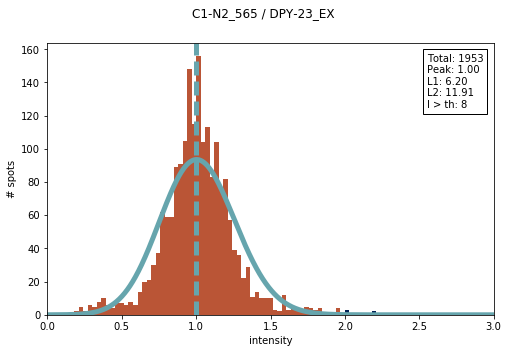

error: L1, L2 [5.3101106478695783, 8.8091533673310014]
peak center: 1.0


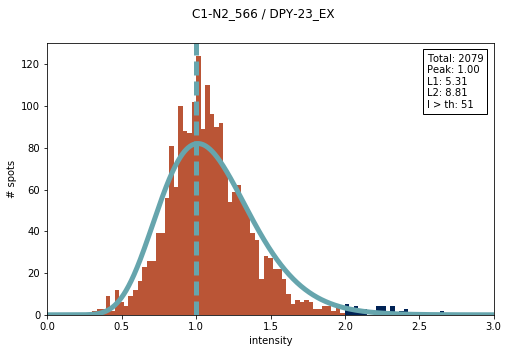

error: L1, L2 [3.6358557241861025, 7.0950939895937699]
peak center: 0.878787878788


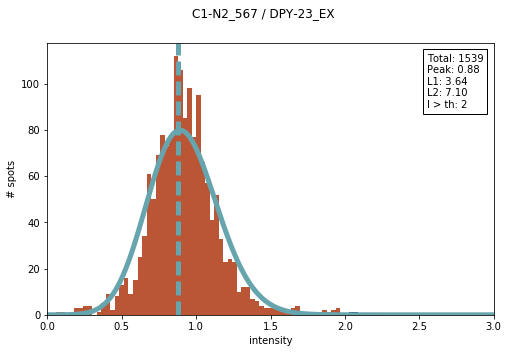

error: L1, L2 [3.3377110742864242, 7.0489759490118349]
peak center: 0.969696969697


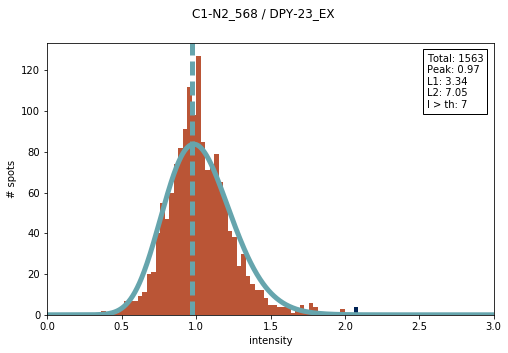

error: L1, L2 [3.330775536341763, 7.0184364951291416]
peak center: 0.969696969697


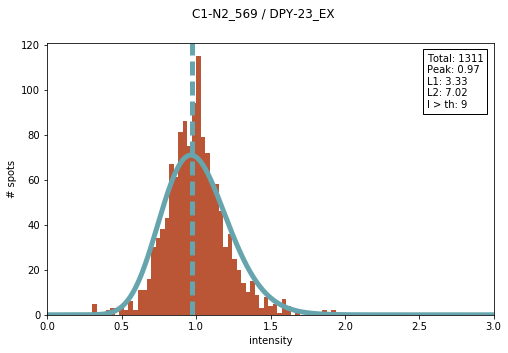

error: L1, L2 [2.291519454519078, 4.4270113938583497]
peak center: 1.0


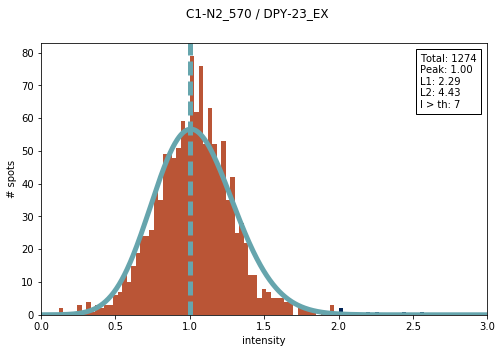

error: L1, L2 [3.0075863422364986, 5.8822896100193063]
peak center: 1.0303030303


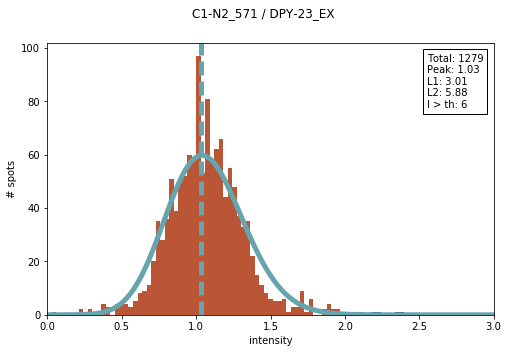

error: L1, L2 [3.6296285960652828, 6.4750602690313244]
peak center: 0.969696969697


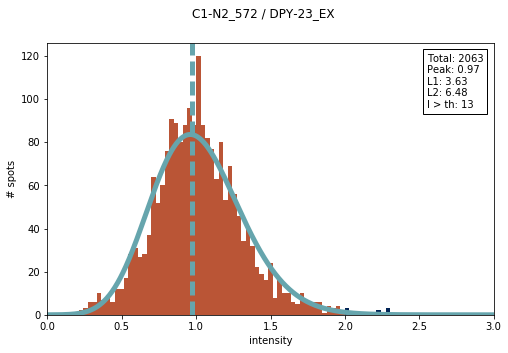

error: L1, L2 [4.9221067444138056, 9.7744461201269033]
peak center: 1.0


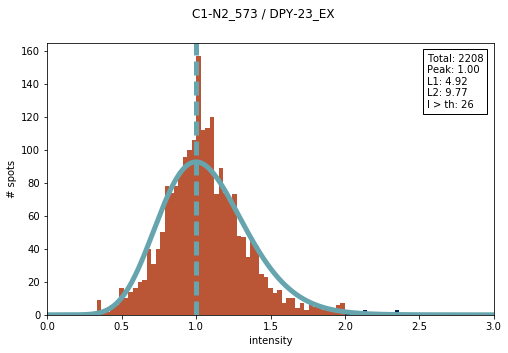

error: L1, L2 [4.0274326187107423, 8.0381381284196465]
peak center: 0.969696969697


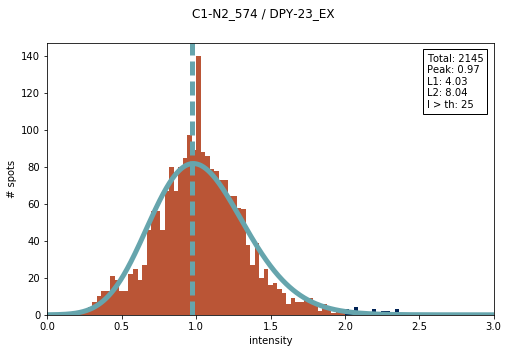

error: L1, L2 [5.2053351603605629, 10.187520341526206]
peak center: 1.0


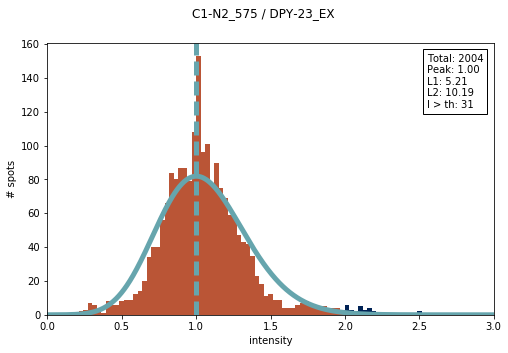

error: L1, L2 [4.3758976486743411, 8.3541799320450139]
peak center: 1.0


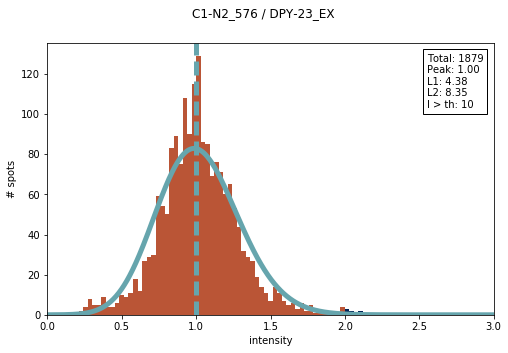

error: L1, L2 [3.5936770083966514, 6.2437457673465717]
peak center: 0.939393939394


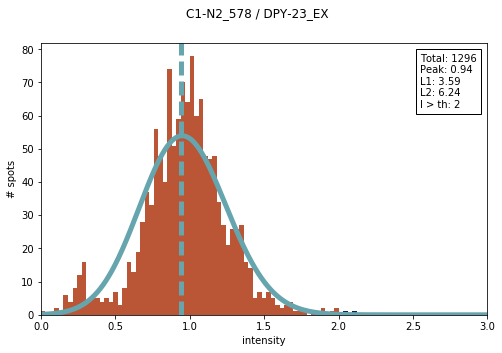

error: L1, L2 [3.6655664600328404, 6.2521861811793578]
peak center: 0.969696969697


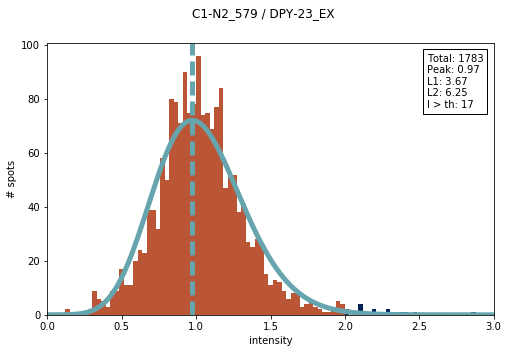

error: L1, L2 [3.207090016502181, 5.5765140012615655]
peak center: 0.969696969697


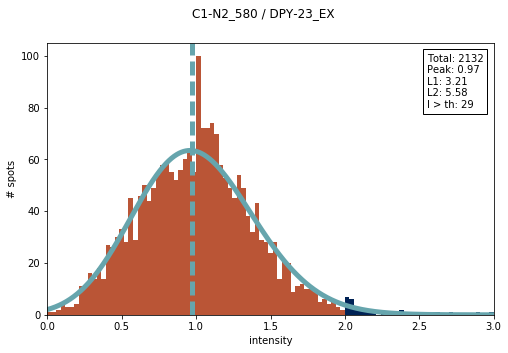

error: L1, L2 [2.7644706360448605, 5.3118548640152543]
peak center: 0.969696969697


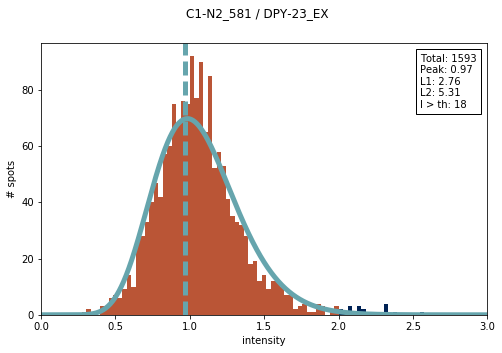

error: L1, L2 [2.8047713762179627, 5.778134293815004]
peak center: 1.0303030303


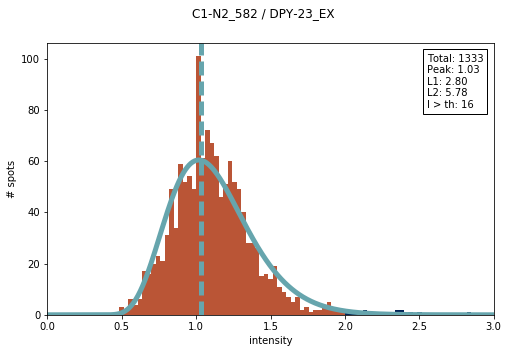

error: L1, L2 [4.499126633401711, 7.7996655593291688]
peak center: 0.636363636364


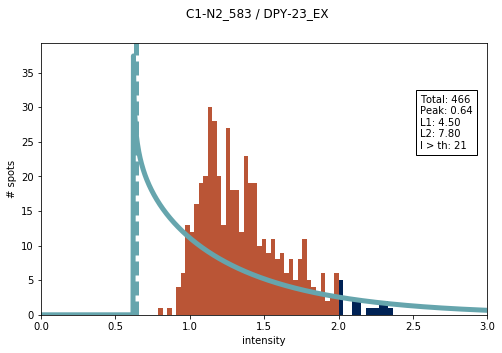

error: L1, L2 [2.8312574986664956, 4.753479813791162]
peak center: 1.0


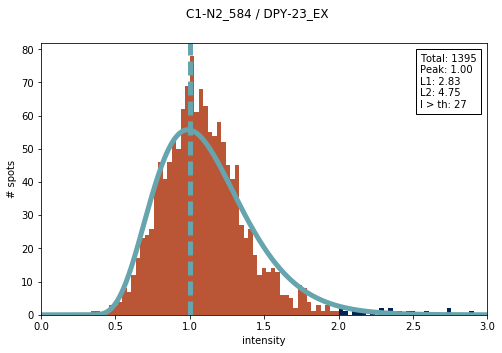

error: L1, L2 [2.5118932778527725, 5.1907613480634103]
peak center: 0.545454545455


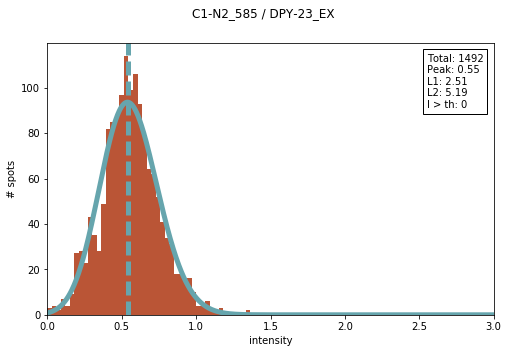

error: L1, L2 [2.6892667717830423, 5.0939703247734993]
peak center: 0.666666666667


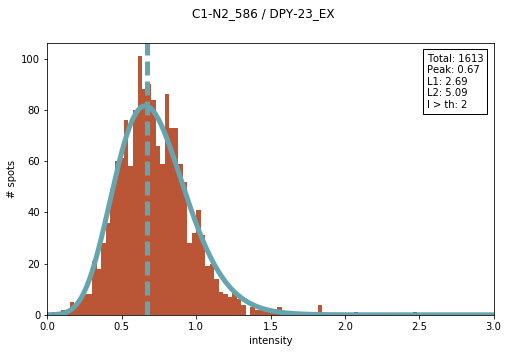

error: L1, L2 [4.5488820056723895, 8.3051054815943477]
peak center: 1.0303030303


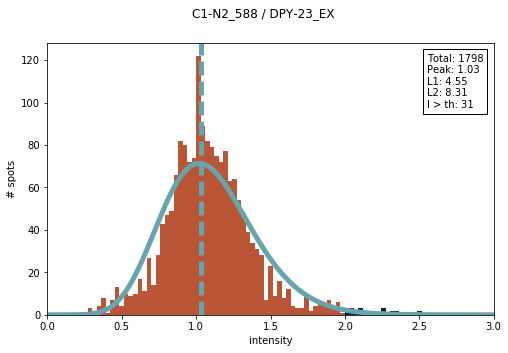

error: L1, L2 [4.1673037938484985, 7.1649571197067425]
peak center: 1.0303030303


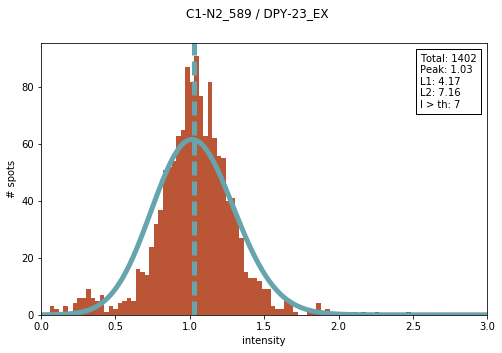

error: L1, L2 [2.6861179668783803, 4.3635943165236597]
peak center: 1.0303030303


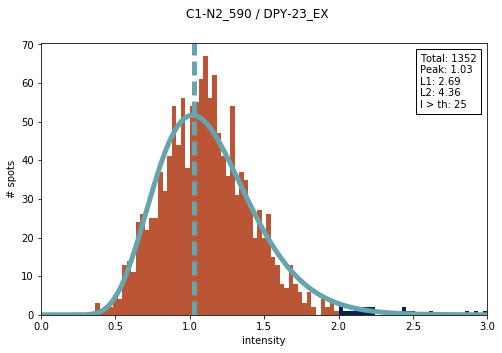

error: L1, L2 [2.7533846059896643, 5.0690666477354744]
peak center: 1.0303030303


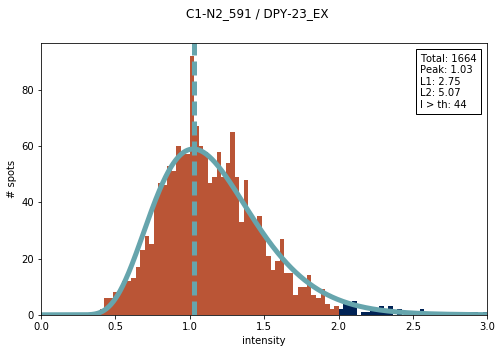

error: L1, L2 [5.3641660648577361, 8.5883500919158919]
peak center: 0.969696969697


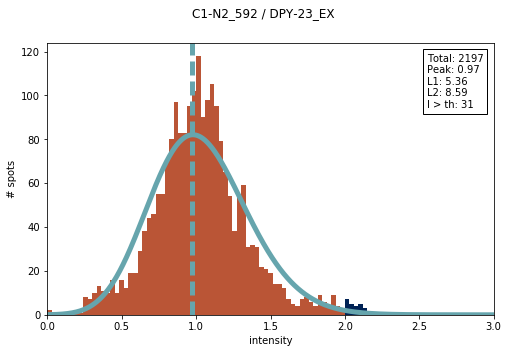

error: L1, L2 [4.1245115858944121, 7.8514241065615806]
peak center: 1.0


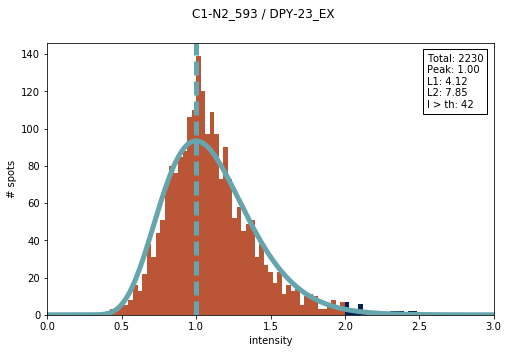

error: L1, L2 [5.2701051729607888, 10.003386436115086]
peak center: 0.969696969697


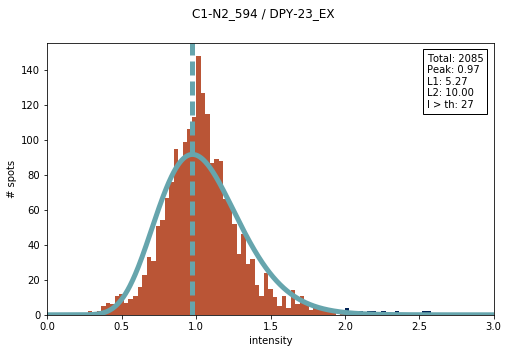

error: L1, L2 [2.7892362115051932, 5.1490140594501046]
peak center: 1.0


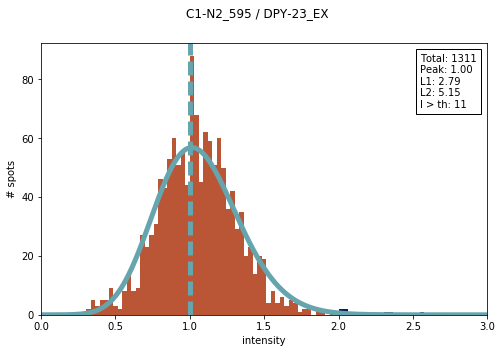

error: L1, L2 [4.2202539386982254, 8.2820984879857136]
peak center: 1.0


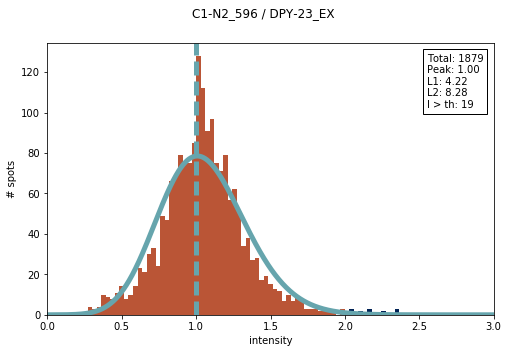

error: L1, L2 [5.3951232642325673, 10.330704937796206]
peak center: 1.0


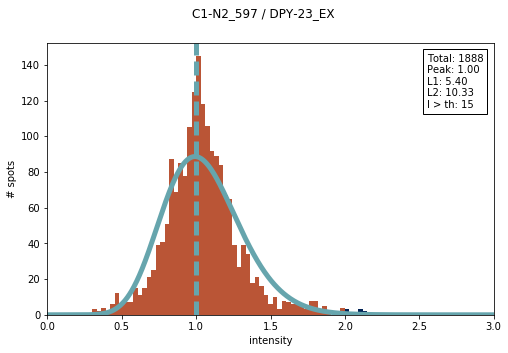

error: L1, L2 [5.6184402628566863, 10.312001362434536]
peak center: 1.0


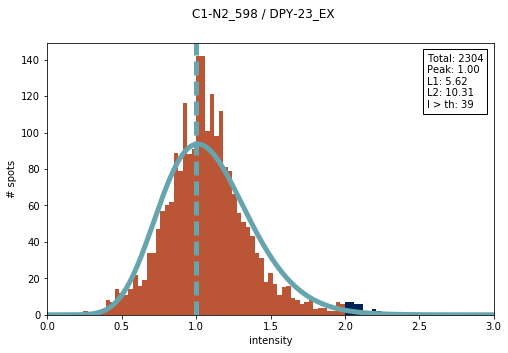

error: L1, L2 [3.9534464793836843, 7.8495469096150661]
peak center: 1.0


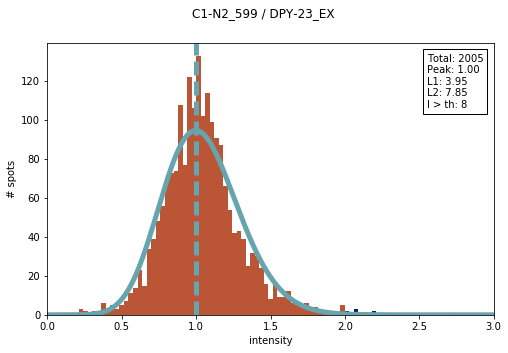

error: L1, L2 [6.4495336432576815, 10.197677632557175]
peak center: 1.0303030303


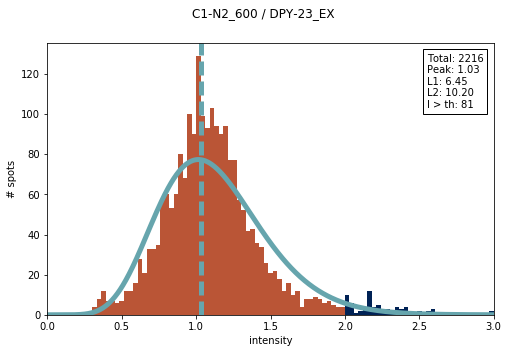

error: L1, L2 [3.3117082913973865, 5.5555683780488074]
peak center: 1.0


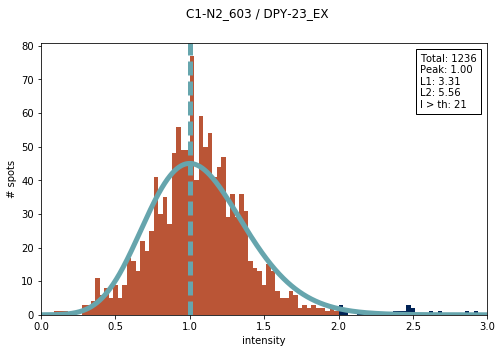

error: L1, L2 [3.7137025216026402, 7.0376955664169358]
peak center: 1.0


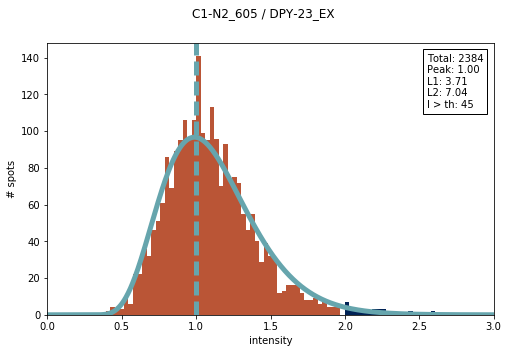

error: L1, L2 [3.2796561996184659, 4.9730361474074138]
peak center: 0.969696969697


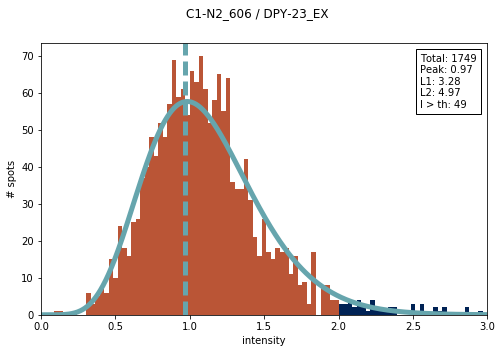

error: L1, L2 [2.1519190266059502, 3.5652879444830803]
peak center: 0.939393939394


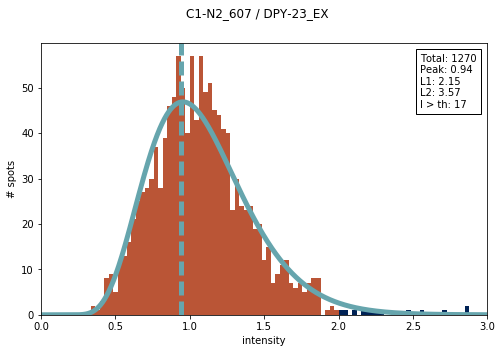

error: L1, L2 [4.7997283854522612, 8.696155100772236]
peak center: 1.0


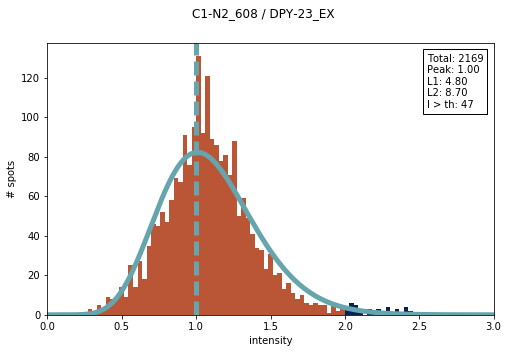

error: L1, L2 [18.326512361898629, 24.417364496030231]
peak center: 0.575757575758


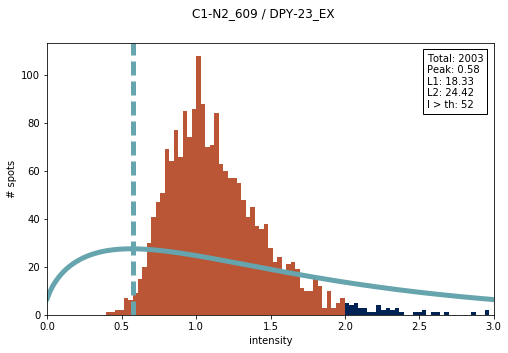

error: L1, L2 [3.0249941571194228, 5.6256541631226726]
peak center: 1.0303030303


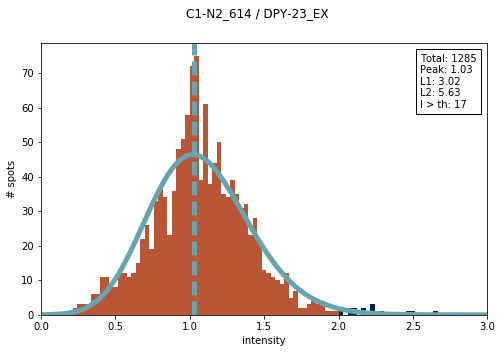

error: L1, L2 [3.1440537370400765, 6.1270007340912649]
peak center: 1.0


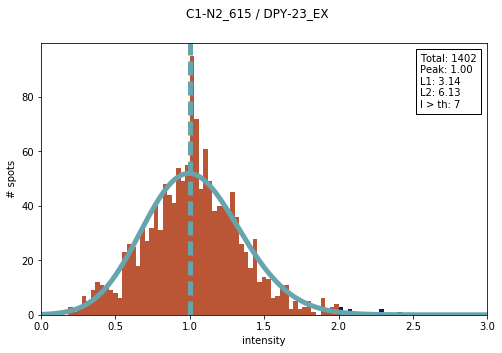

error: L1, L2 [5.2973316116988132, 9.7925105450062357]
peak center: 1.0


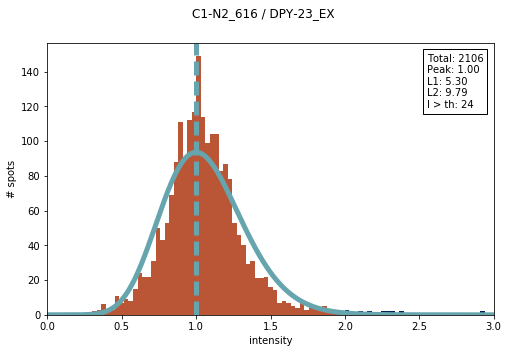

error: L1, L2 [3.690589901548996, 7.2016900766192942]
peak center: 0.969696969697


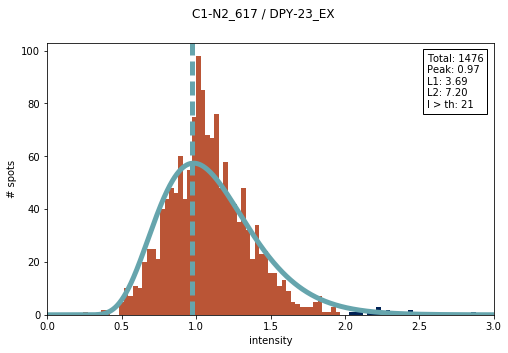

error: L1, L2 [2.977382869615036, 5.9131829261966171]
peak center: 0.969696969697


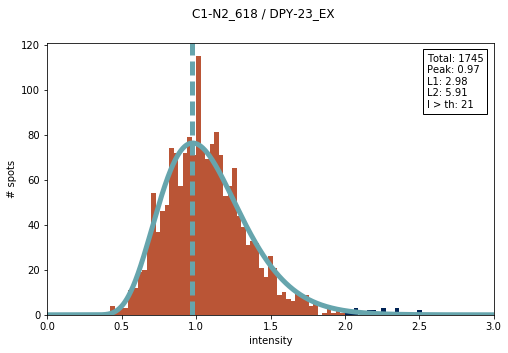

error: L1, L2 [9.4874396179794847, 22.843326386108533]
peak center: 0.636363636364


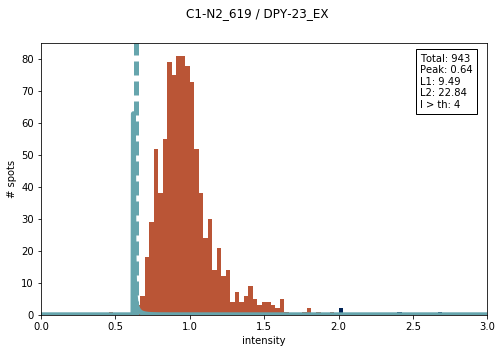

error: L1, L2 [2.4561616055575723, 4.2302001995468181]
peak center: 1.0303030303


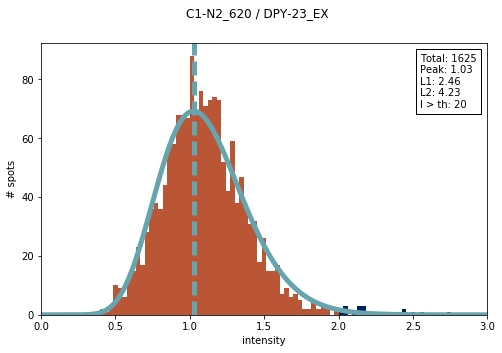

error: L1, L2 [5.2344402135066694, 9.0245478616570924]
peak center: 1.0303030303


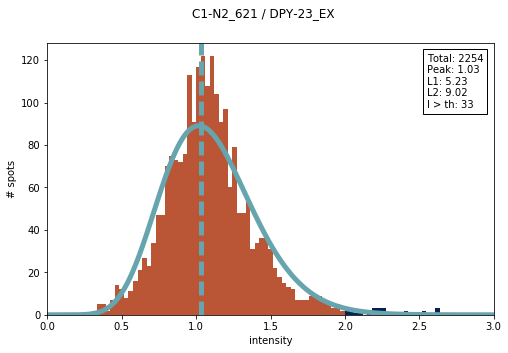

error: L1, L2 [2.7906564690370974, 5.1072856138743949]
peak center: 0.969696969697


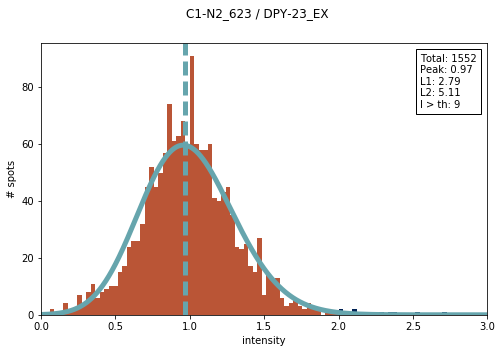

error: L1, L2 [3.8658314781509446, 6.8549924969603433]
peak center: 0.909090909091


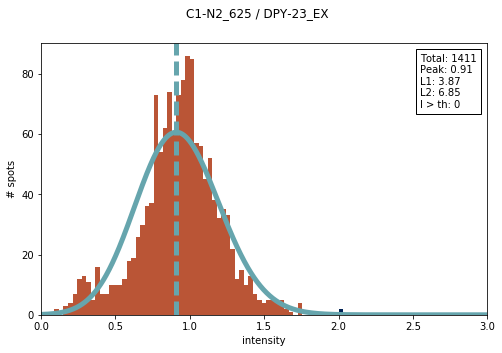

error: L1, L2 [4.3713200145603377, 8.1655031174771864]
peak center: 1.0303030303


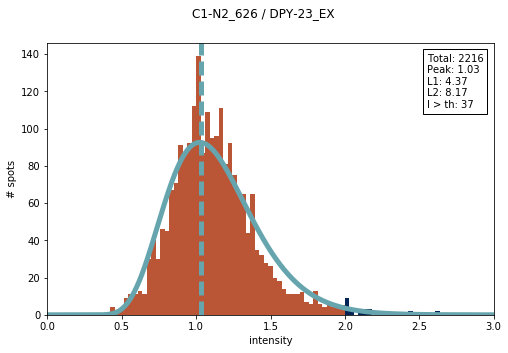

error: L1, L2 [1.7968998329150283, 3.415935294748671]
peak center: 0.969696969697


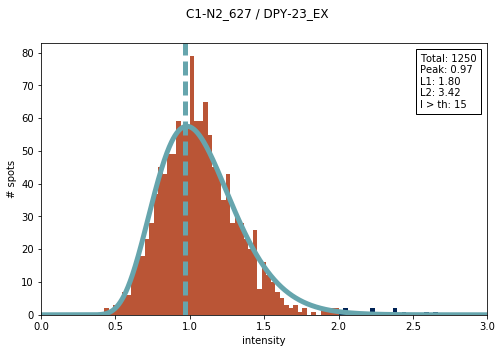

error: L1, L2 [3.9526656986091044, 8.1120349103568028]
peak center: 1.0


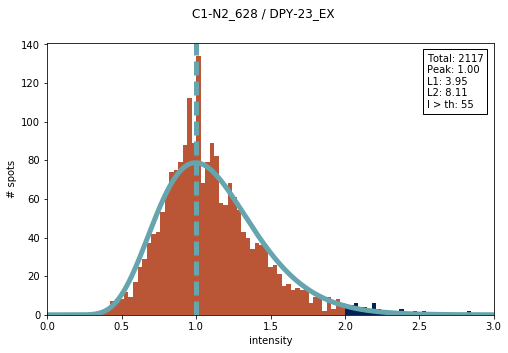

error: L1, L2 [2.1681556069761538, 3.2761540680204368]
peak center: 1.12121212121


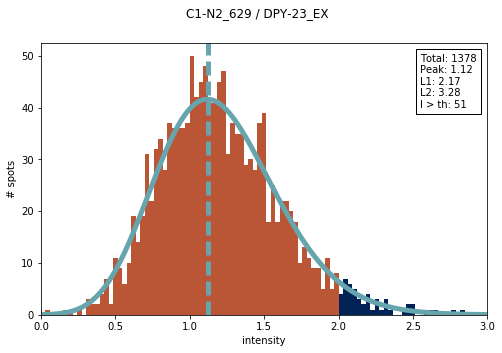

error: L1, L2 [2.7923086972482452, 4.3927176061162196]
peak center: 0.969696969697


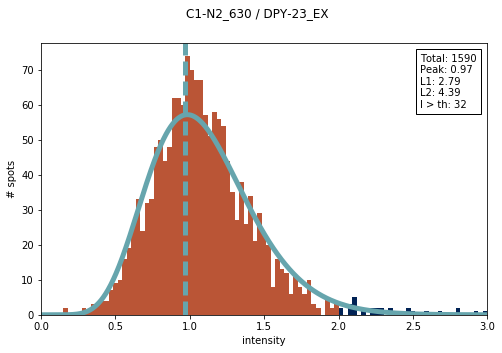

error: L1, L2 [2.5429304869477201, 3.8168082067073712]
peak center: 1.0303030303


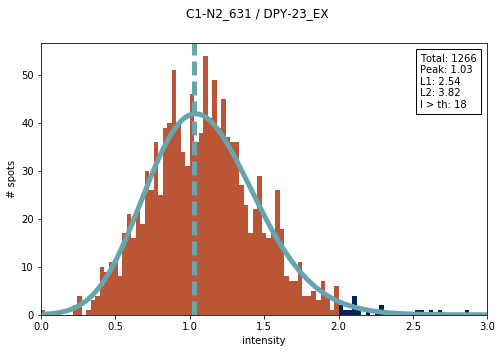

error: L1, L2 [3.9616811531317047, 8.1969573559692321]
peak center: 0.939393939394


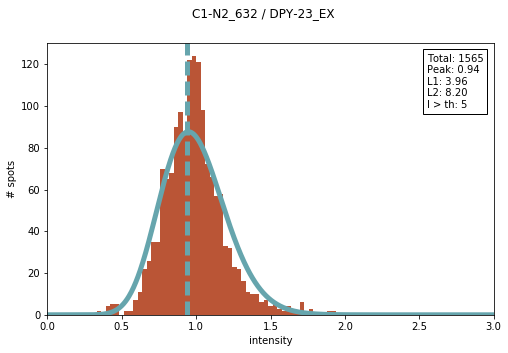

error: L1, L2 [5.5240994482244341, 11.127163257845112]
peak center: 1.0


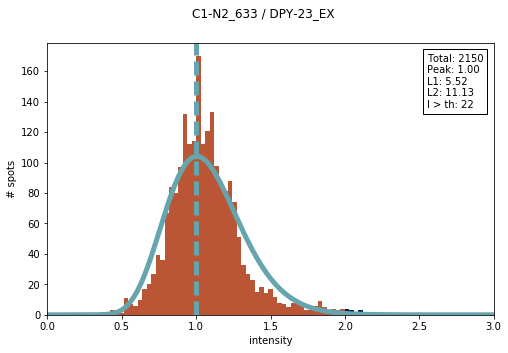

error: L1, L2 [5.0817006384507089, 9.8119658465007209]
peak center: 0.939393939394


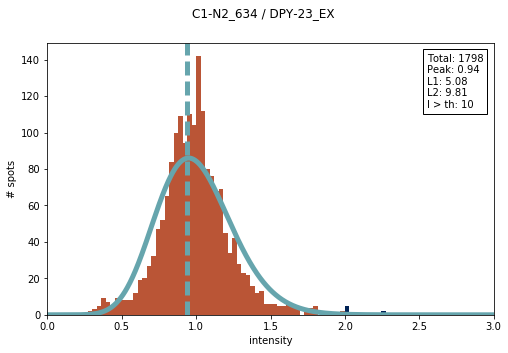

error: L1, L2 [2.880034787893786, 5.1305313476453165]
peak center: 0.969696969697


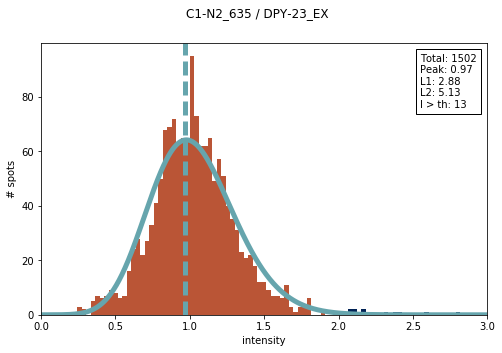

error: L1, L2 [3.2036661170126992, 5.8048282541893714]
peak center: 0.969696969697


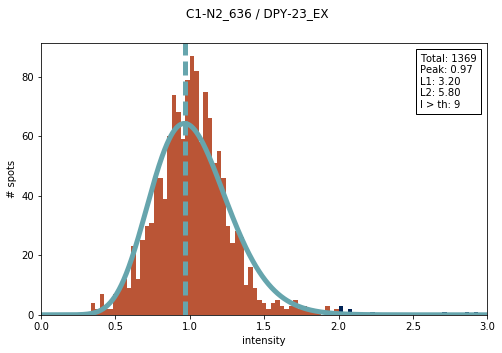

error: L1, L2 [2.6685277286649209, 5.2796111355530542]
peak center: 1.0


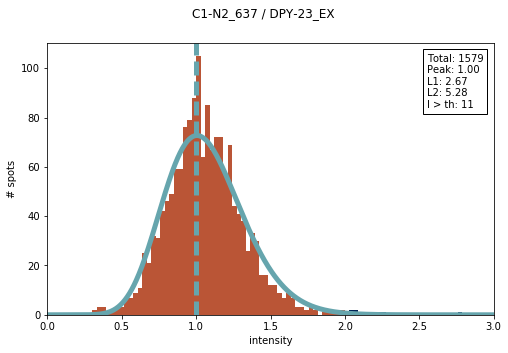

error: L1, L2 [3.4924570649579905, 7.1764492767838277]
peak center: 0.969696969697


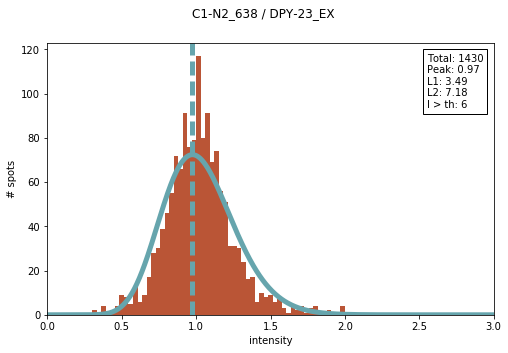

error: L1, L2 [6.0565818893842884, 10.469991025625879]
peak center: 1.0


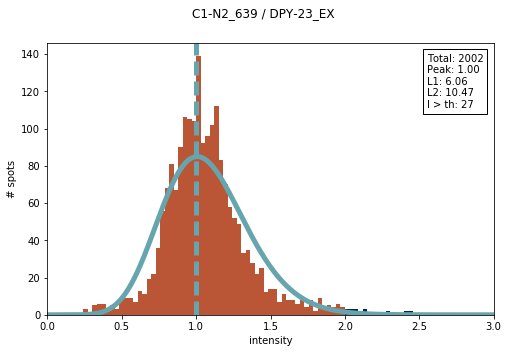

error: L1, L2 [3.8193254359446507, 7.5235276157162625]
peak center: 0.969696969697


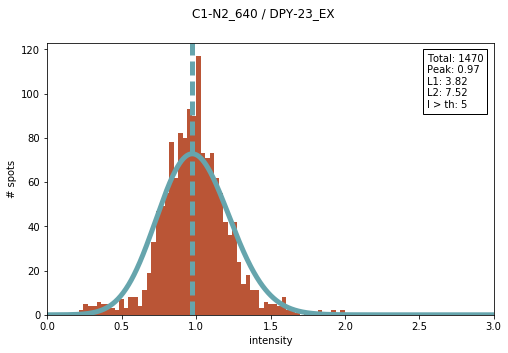

error: L1, L2 [8.2219253396913263, 14.896104138656536]
peak center: 1.0


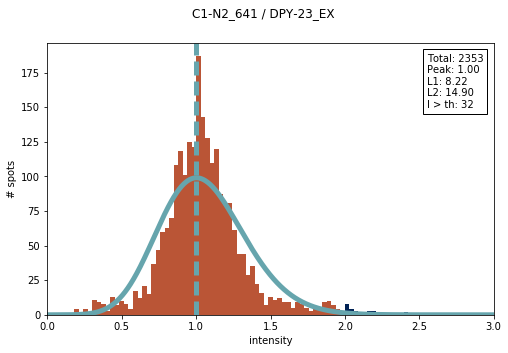

error: L1, L2 [33.726664817035577, 122.54342489527116]
peak center: 0.30303030303


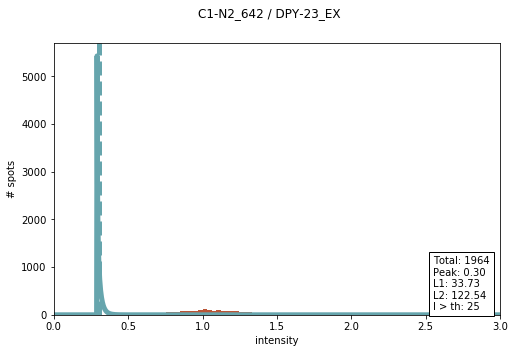

error: L1, L2 [4.1266526802943524, 7.5817173867619658]
peak center: 1.0


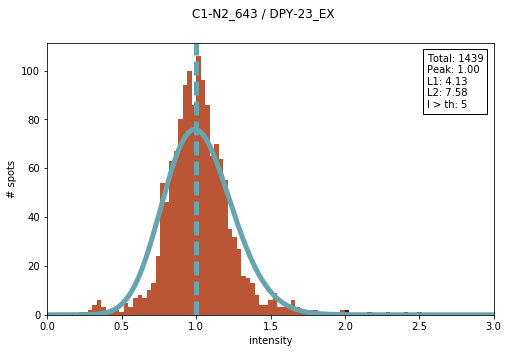

error: L1, L2 [3.9558235668101243, 7.8274344159894982]
peak center: 0.969696969697


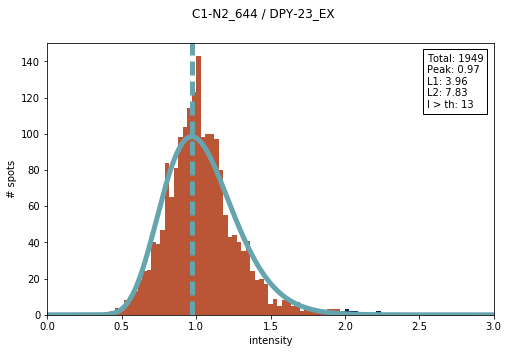

error: L1, L2 [2.3637865123850417, 4.068964672148093]
peak center: 0.939393939394


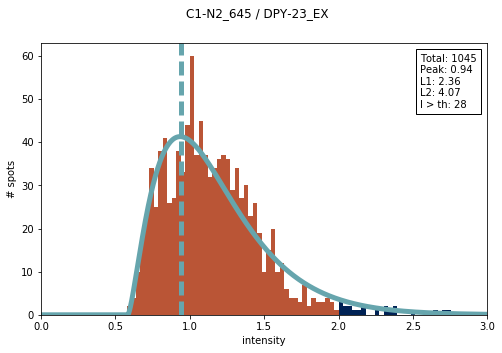

error: L1, L2 [7.882504190999958, 14.005138552560261]
peak center: 1.0


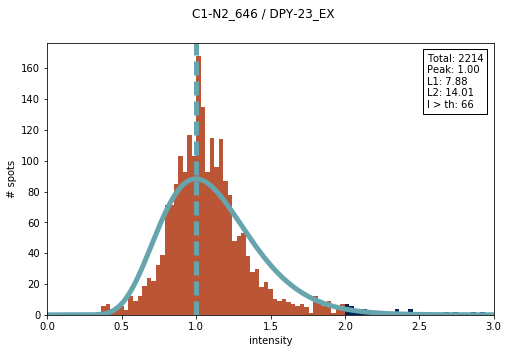

error: L1, L2 [3.5082598959753621, 7.4325169490371152]
peak center: 0.909090909091


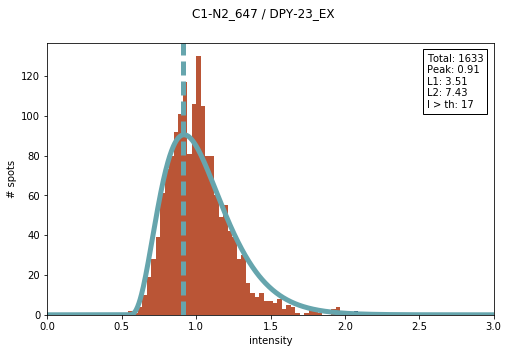

error: L1, L2 [4.5804518365339497, 10.029357694846189]
peak center: 0.969696969697


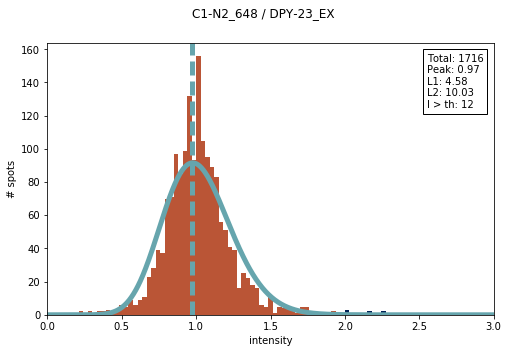

error: L1, L2 [5.4827111538036455, 11.473263168621095]
peak center: 0.969696969697


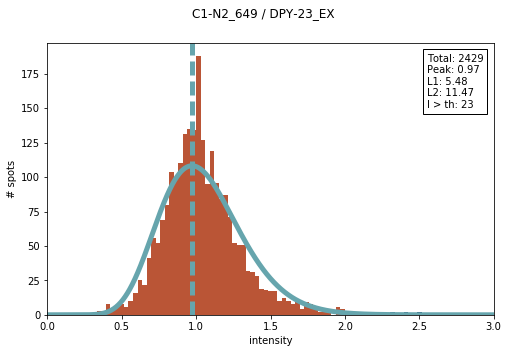

error: L1, L2 [3.0764229496316884, 6.2091597937350604]
peak center: 0.969696969697


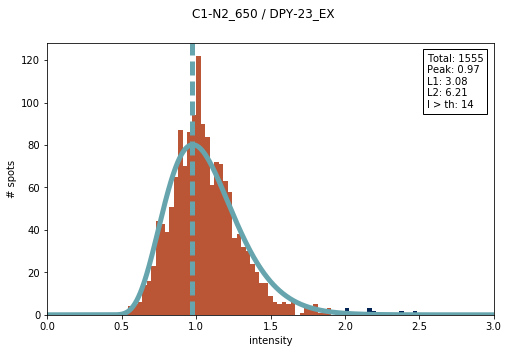

error: L1, L2 [5.8054925914054127, 10.441427723740762]
peak center: 0.939393939394


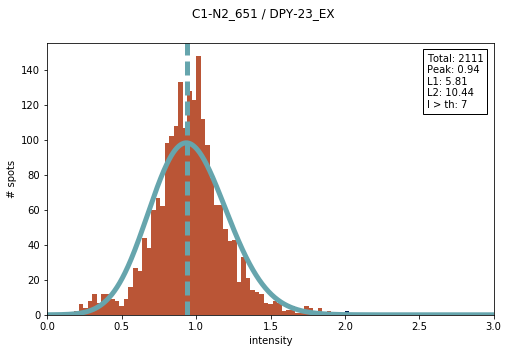

error: L1, L2 [3.7401780247805911, 6.9171252179349407]
peak center: 1.0


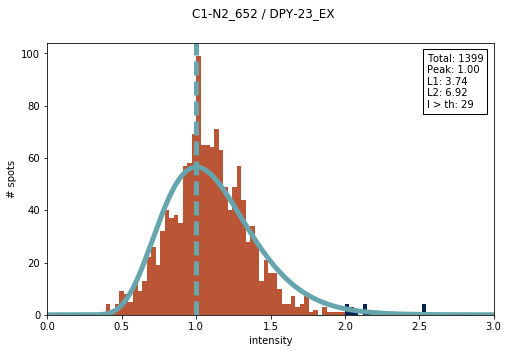

error: L1, L2 [5.3761630417299289, 10.228399370617206]
peak center: 0.969696969697


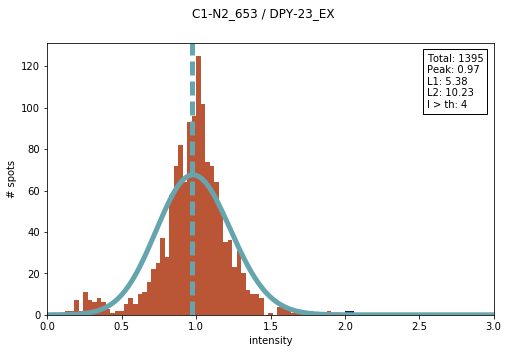

error: L1, L2 [3.2673967437399254, 6.3020192362792296]
peak center: 1.0


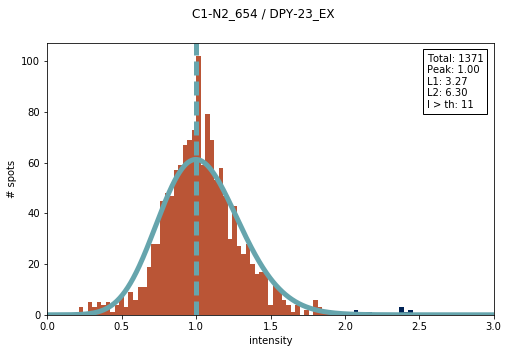

error: L1, L2 [3.1416227954985136, 5.5824144357099197]
peak center: 1.0303030303


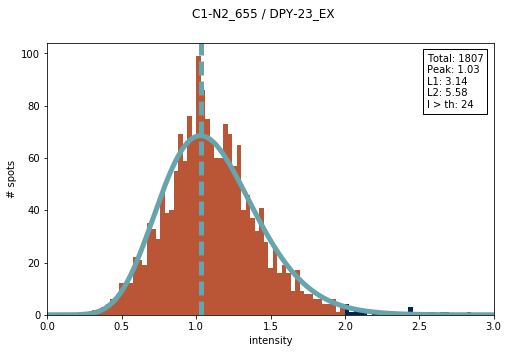

error: L1, L2 [9.7537111802060679, 15.343416114372152]
peak center: 0.939393939394


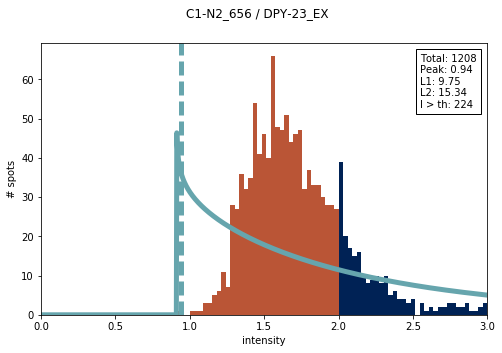

error: L1, L2 [5.2632820616188587, 9.6304858399774496]
peak center: 1.0303030303


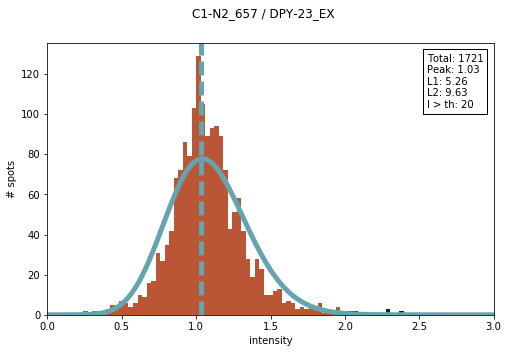

error: L1, L2 [2.5272134889018463, 5.5196104725365718]
peak center: 0.969696969697


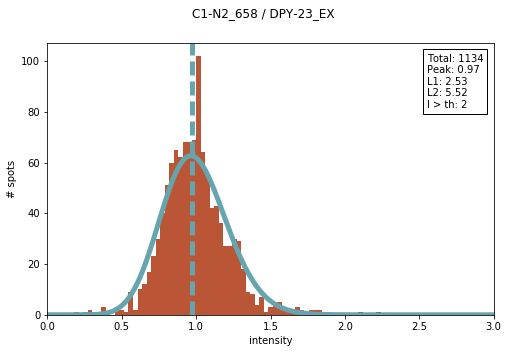

error: L1, L2 [2.9578217114315497, 5.6304320572221185]
peak center: 1.0


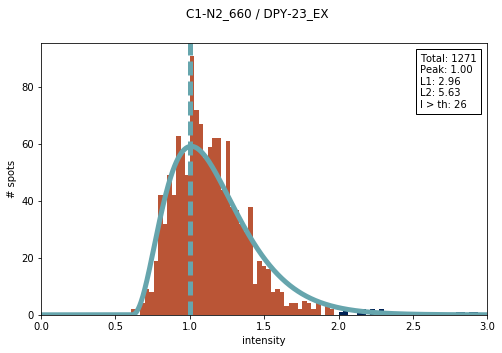

error: L1, L2 [3.5200302073224026, 7.7614344866686364]
peak center: 1.0303030303


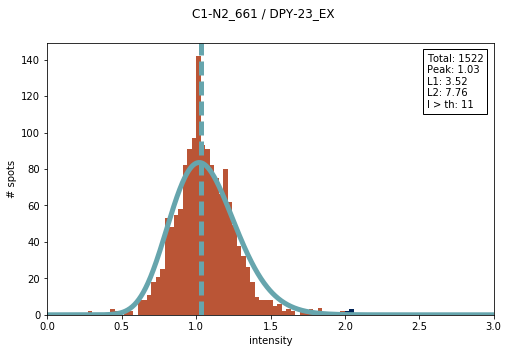

error: L1, L2 [3.5731145458596156, 6.2633796664104127]
peak center: 1.06060606061


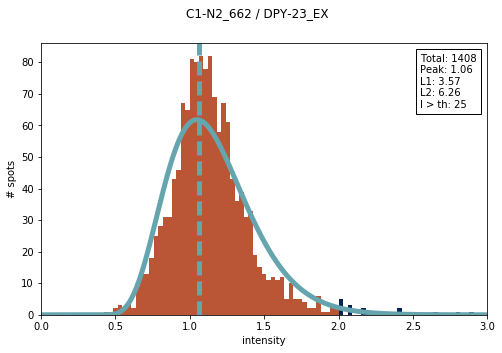

error: L1, L2 [2.6621475210585879, 5.625010723000484]
peak center: 0.969696969697


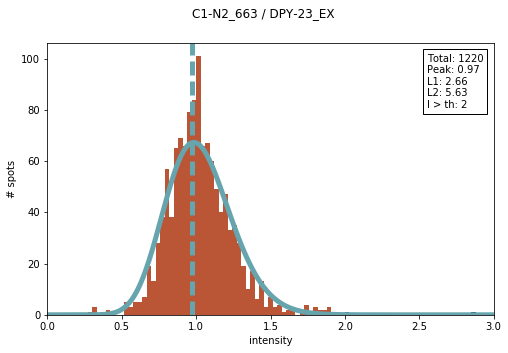

error: L1, L2 [3.498978355528199, 7.1119986101831314]
peak center: 1.0303030303


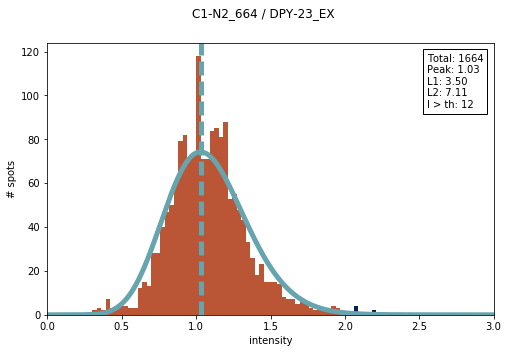

error: L1, L2 [3.2737562019596895, 5.8356282197478651]
peak center: 1.0


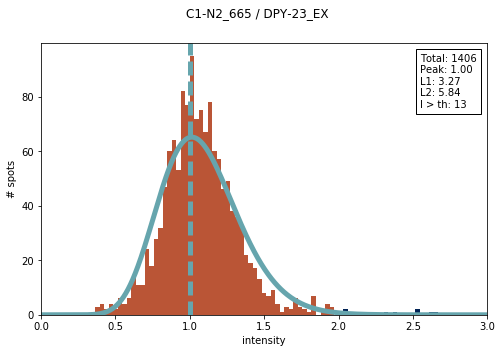

error: L1, L2 [3.2228836429682097, 6.8505945085812856]
peak center: 0.969696969697


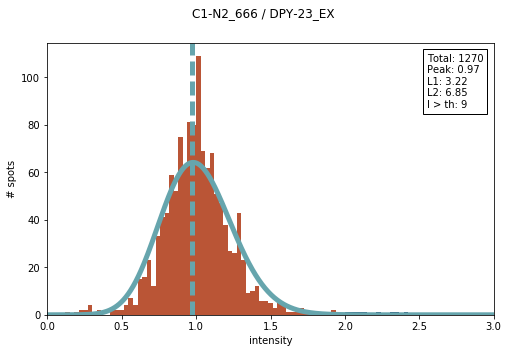

error: L1, L2 [3.2738965844694765, 7.4573735416431166]
peak center: 1.0


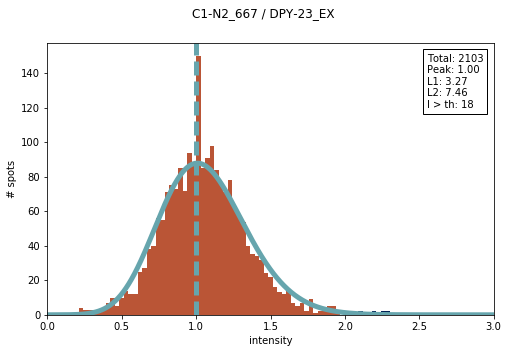

error: L1, L2 [4.9491676776546356, 10.263102521666882]
peak center: 1.0


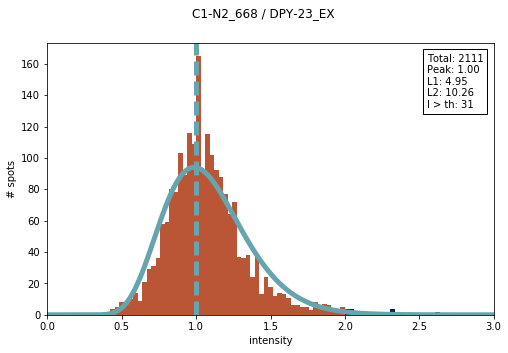

error: L1, L2 [4.429422493973119, 7.9896457606237119]
peak center: 1.0303030303


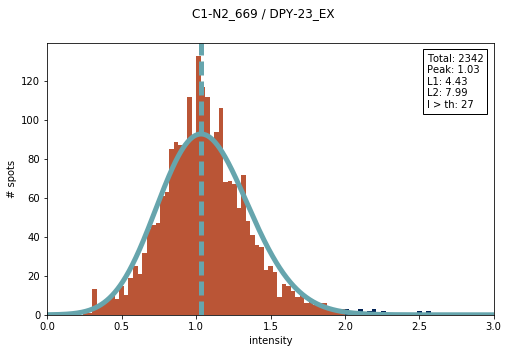

error: L1, L2 [3.671372715544825, 7.027899164854988]
peak center: 1.0


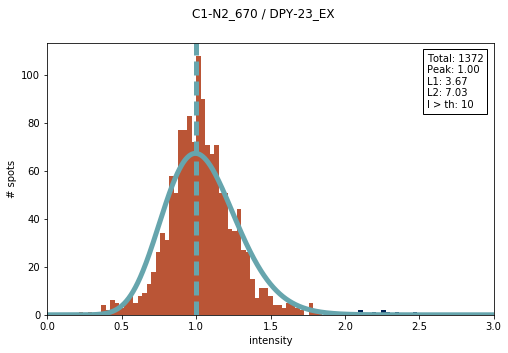

error: L1, L2 [2.9092518551954938, 5.5633058386108756]
peak center: 0.969696969697


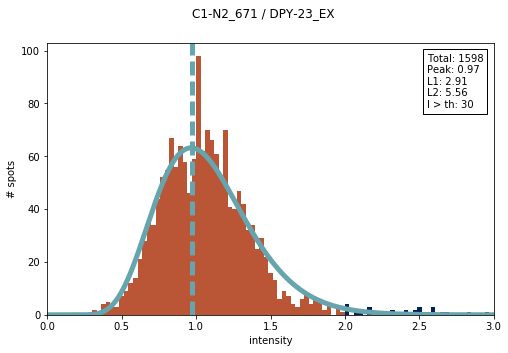

error: L1, L2 [3.7812174901643298, 6.2675474875313331]
peak center: 0.969696969697


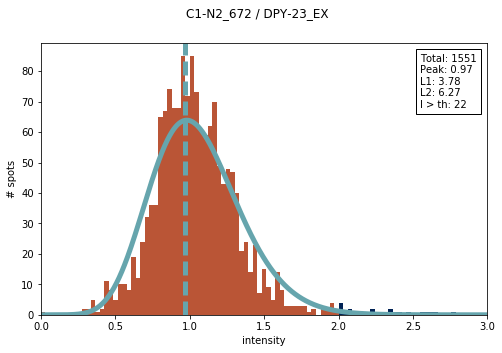

error: L1, L2 [3.3548600826241191, 6.2579658115157137]
peak center: 0.909090909091


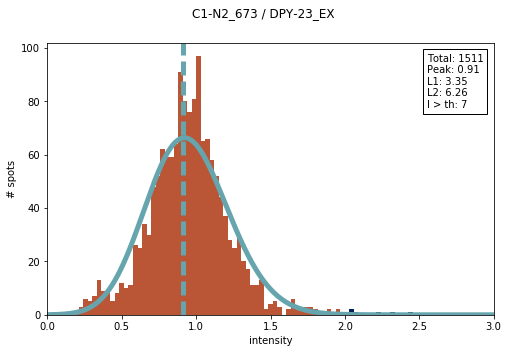

error: L1, L2 [4.6410604251851542, 7.5996034975779096]
peak center: 1.12121212121


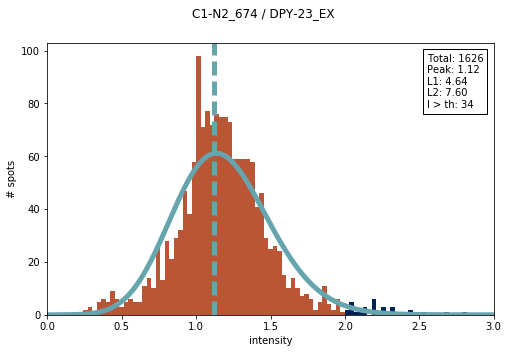

error: L1, L2 [4.0600398673947362, 7.2086771787625725]
peak center: 0.969696969697


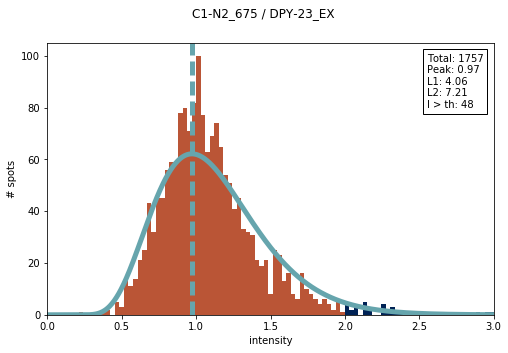

error: L1, L2 [3.3107113289207897, 5.8920356892690231]
peak center: 1.0


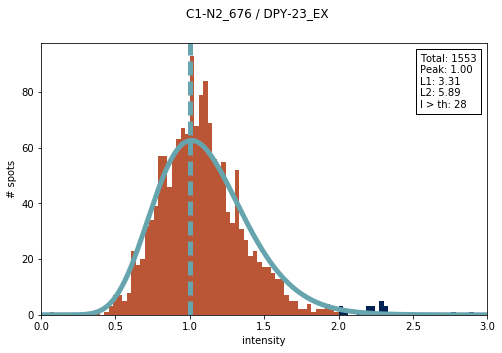

error: L1, L2 [6.2317433725075668, 11.728358949149934]
peak center: 0.969696969697


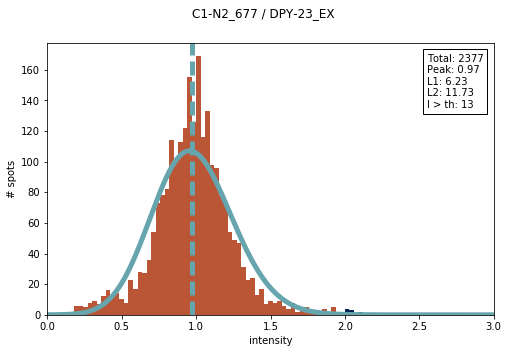

error: L1, L2 [3.5891443220850054, 6.3586494481033009]
peak center: 0.969696969697


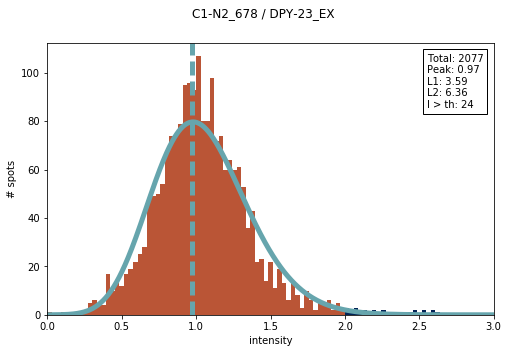

error: L1, L2 [4.8725876894455347, 8.5914942603972975]
peak center: 0.939393939394


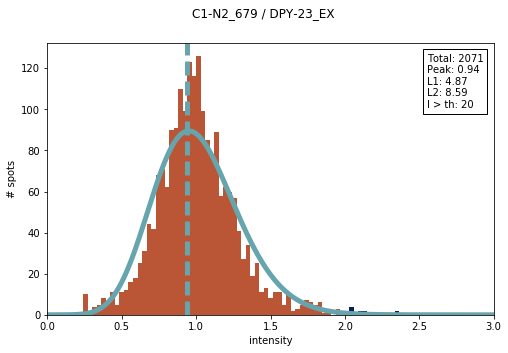

error: L1, L2 [5.7229388306076787, 10.861137025845592]
peak center: 0.939393939394


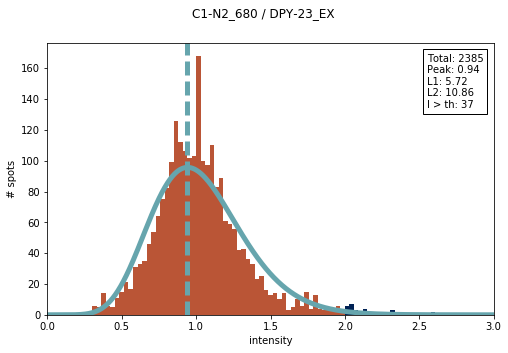

error: L1, L2 [2.865758405758934, 5.7383985265836834]
peak center: 3.0


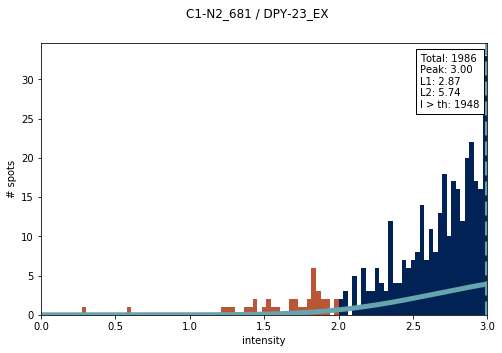

error: L1, L2 [2.6664723439470106, 4.6102369455693655]
peak center: 1.0303030303


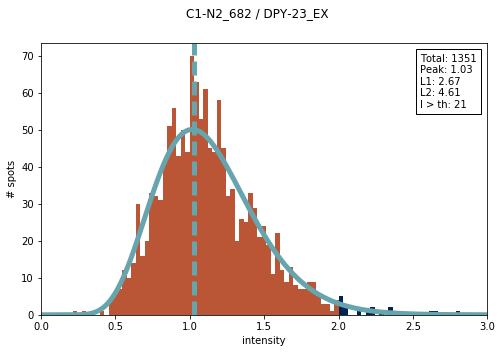

error: L1, L2 [4.4515321259988312, 8.1824620306814282]
peak center: 0.909090909091


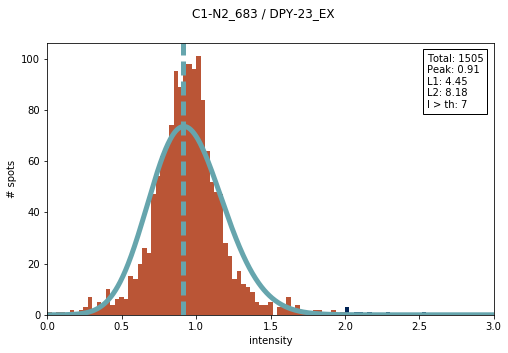

error: L1, L2 [6.1075430700643363, 11.882950542877468]
peak center: 1.0


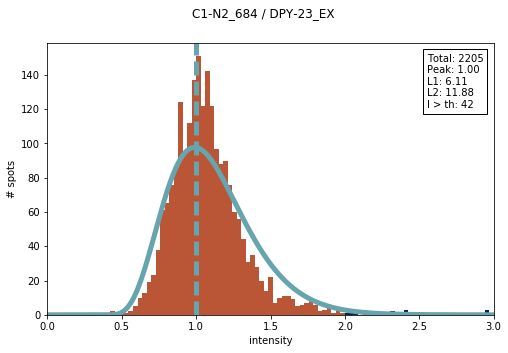

error: L1, L2 [3.4379825895336538, 6.9527280675365066]
peak center: 0.969696969697


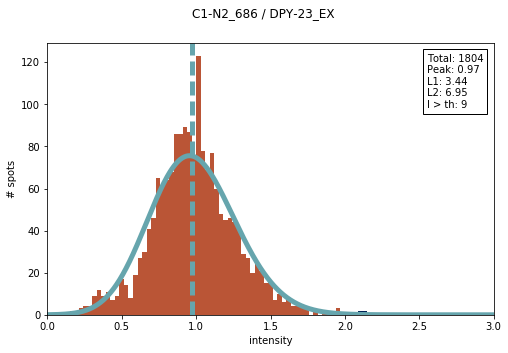

error: L1, L2 [2.2878283439429015, 4.6463435845891494]
peak center: 1.0303030303


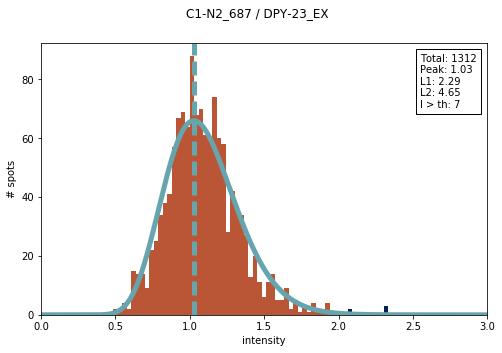

error: L1, L2 [3.4649567440635227, 5.7175851893393874]
peak center: 1.18181818182


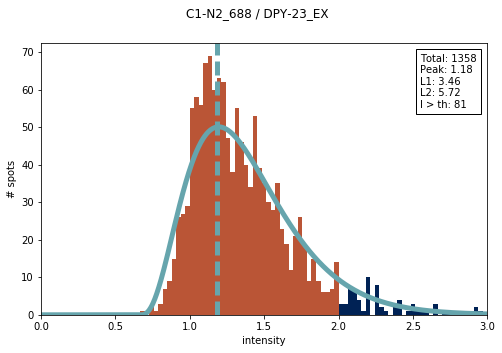

error: L1, L2 [2.6739876727792287, 5.3626628824803557]
peak center: 1.0303030303


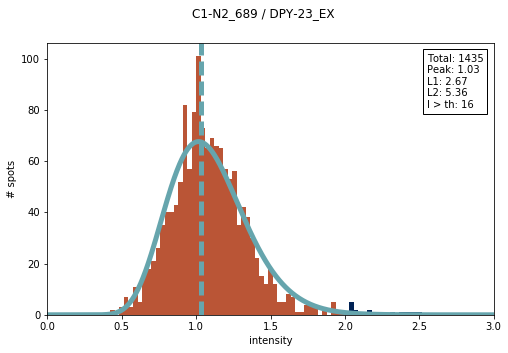

error: L1, L2 [3.2805745894292944, 6.2604483633802914]
peak center: 1.0303030303


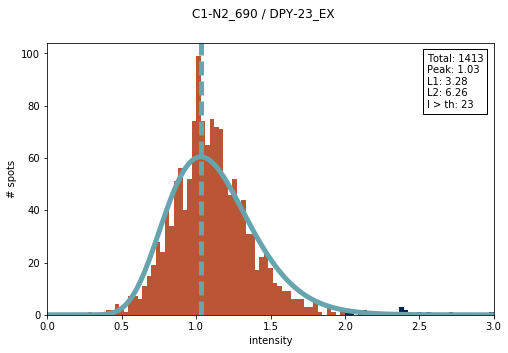

error: L1, L2 [2.8663484431344974, 5.2033857804099712]
peak center: 0.969696969697


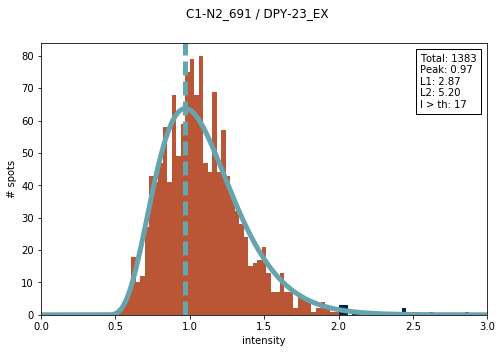

error: L1, L2 [2.6230330851166435, 5.1123764721199674]
peak center: 1.0


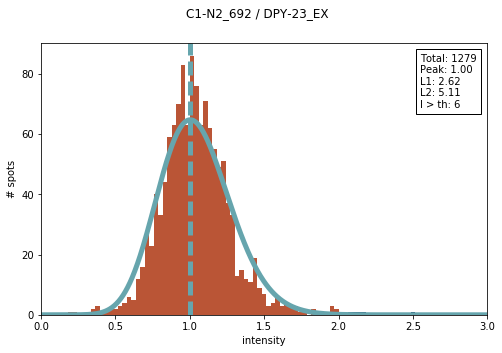

error: L1, L2 [1.8889831652137954, 4.044369873666839]
peak center: 0.939393939394


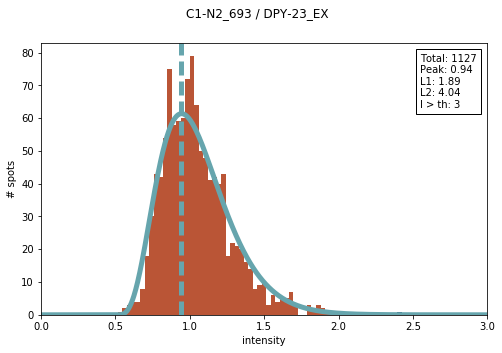

error: L1, L2 [8.2523580258142246, 15.947810760680223]
peak center: 0.969696969697


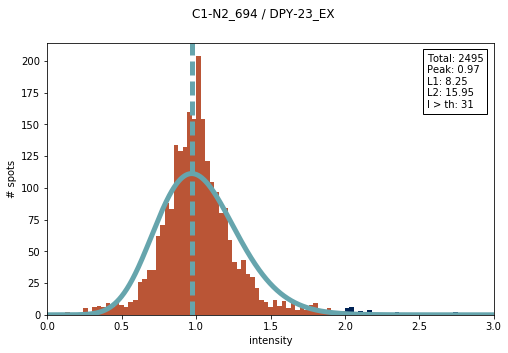

error: L1, L2 [4.5877770723961566, 8.8578085817707759]
peak center: 1.0


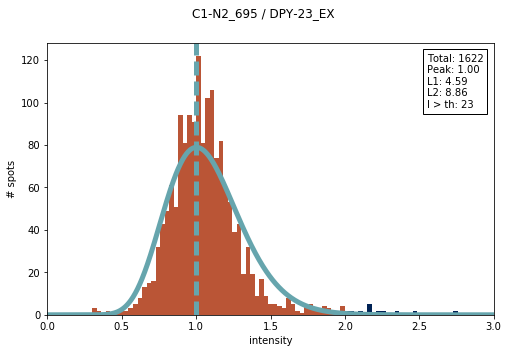

error: L1, L2 [2.7965895777569005, 4.8940977290080268]
peak center: 1.0


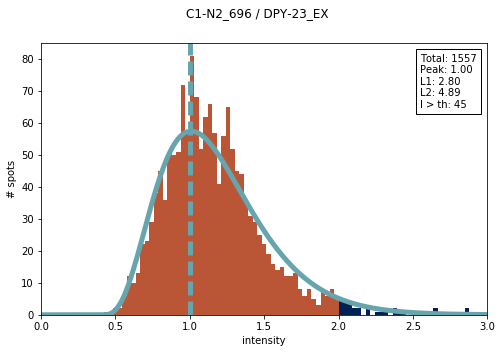

error: L1, L2 [5.3940807385651528, 9.6813703160372544]
peak center: 1.0


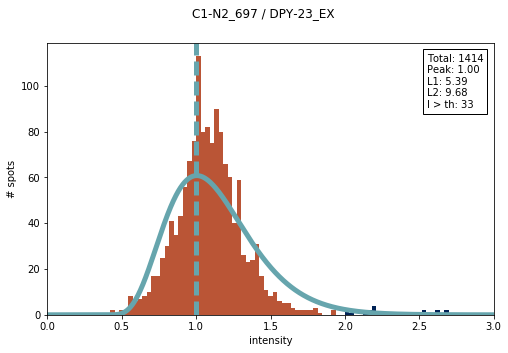

error: L1, L2 [4.2976800755489011, 7.6903259759307776]
peak center: 1.0


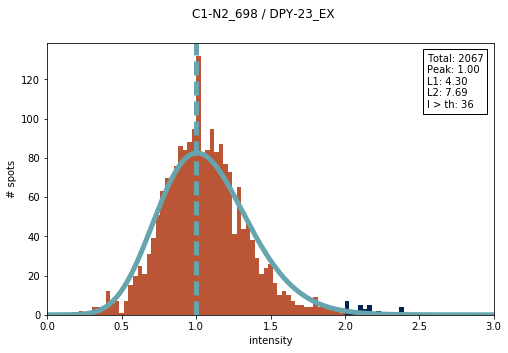

error: L1, L2 [4.24004750351249, 7.8767467864131042]
peak center: 1.0


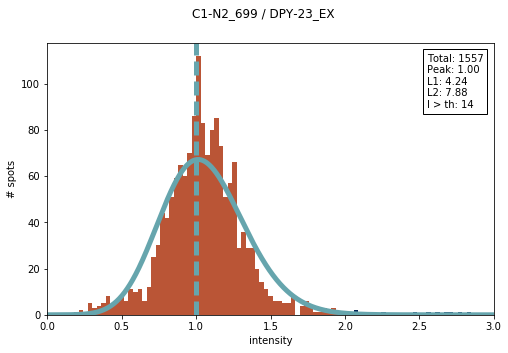

error: L1, L2 [3.7773906687034429, 7.2150440171943053]
peak center: 1.0


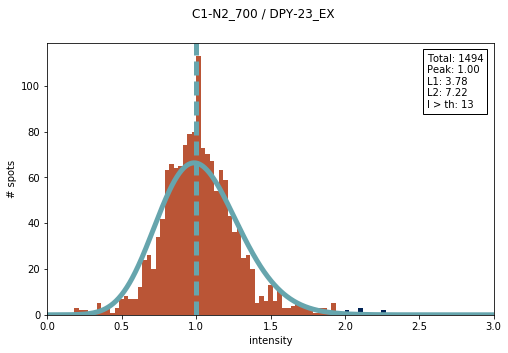

error: L1, L2 [3.8272250502339351, 7.4835154061557034]
peak center: 1.0


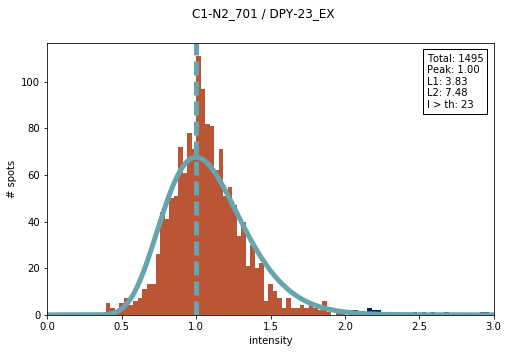

error: L1, L2 [3.7205122150307024, 7.5977228700782184]
peak center: 1.0303030303


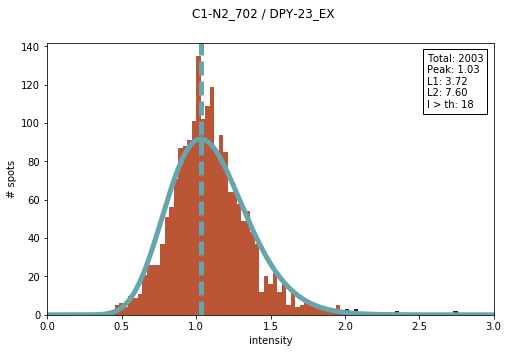

error: L1, L2 [3.2155559530094924, 6.236536481720349]
peak center: 0.939393939394


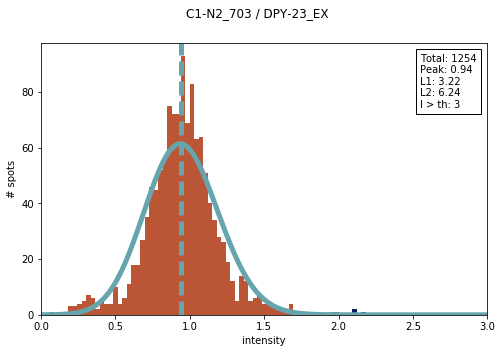

error: L1, L2 [3.1991047597277449, 6.2683342198102929]
peak center: 1.0303030303


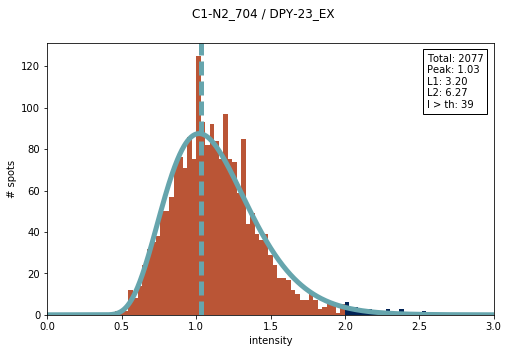

error: L1, L2 [5.630989982483138, 12.370033762449873]
peak center: 0.969696969697


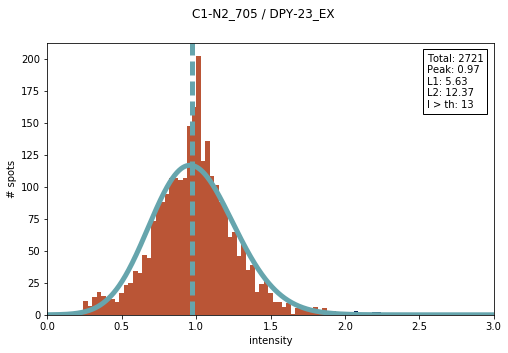

error: L1, L2 [4.0520982779487635, 8.6394563106339142]
peak center: 1.0


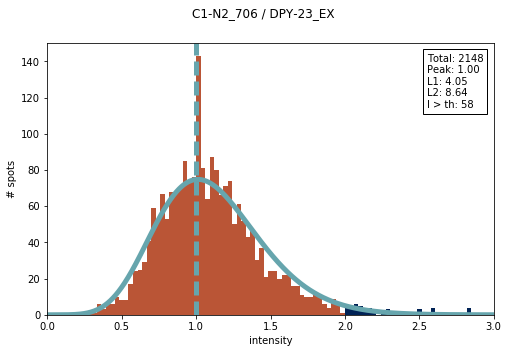

error: L1, L2 [3.8129969104759218, 7.3612206725968514]
peak center: 0.878787878788


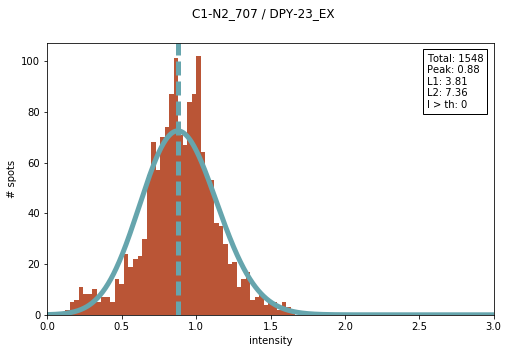

error: L1, L2 [3.2008520082687353, 6.3080123004072508]
peak center: 1.0


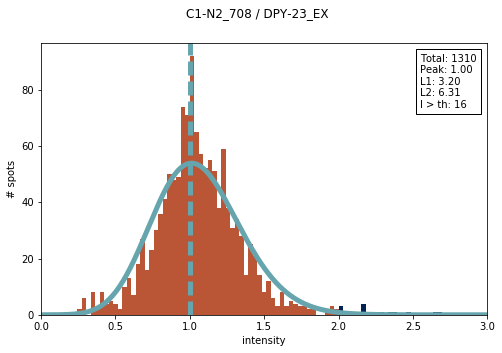

error: L1, L2 [3.4972569124660575, 6.6615497083938937]
peak center: 1.0303030303


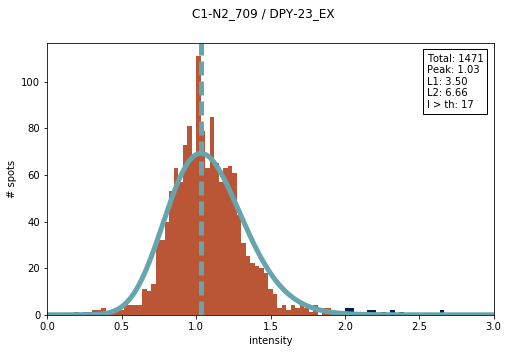

error: L1, L2 [2.8354135390993189, 6.228810608714757]
peak center: 1.0


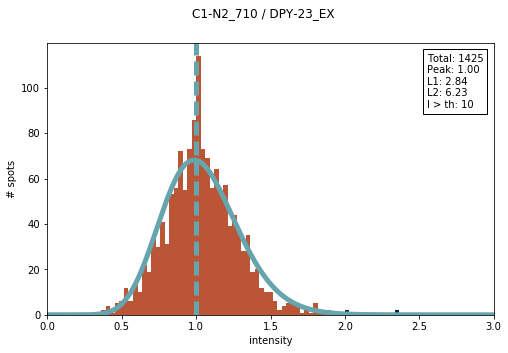

error: L1, L2 [3.630543284071738, 6.9228499535197656]
peak center: 1.0303030303


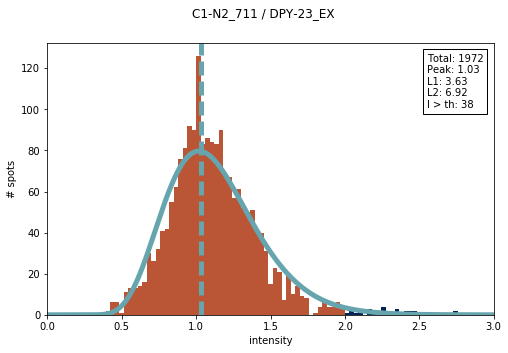

error: L1, L2 [22.933141651223252, 44.272925222796715]
peak center: 0.0606060606061


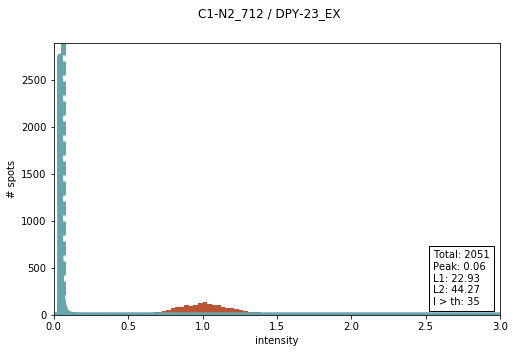

error: L1, L2 [5.3211380892658937, 9.286737328780033]
peak center: 1.0


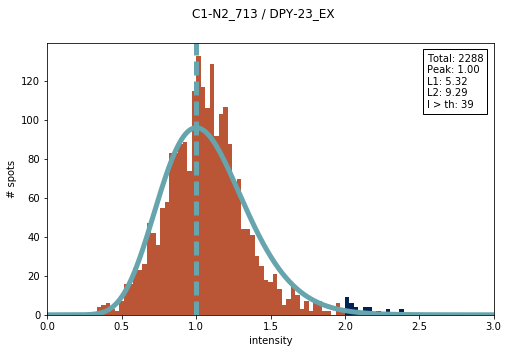

error: L1, L2 [7.2684014415617613, 12.064237184835401]
peak center: 1.0


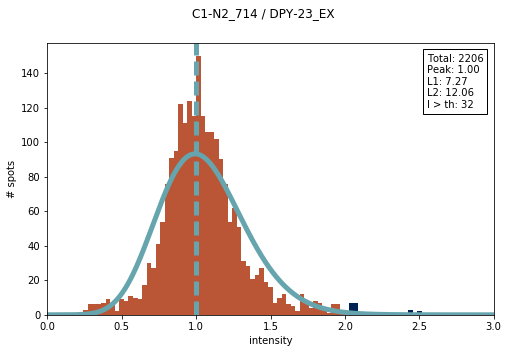

error: L1, L2 [2.9228559272454366, 5.676805124597962]
peak center: 1.0


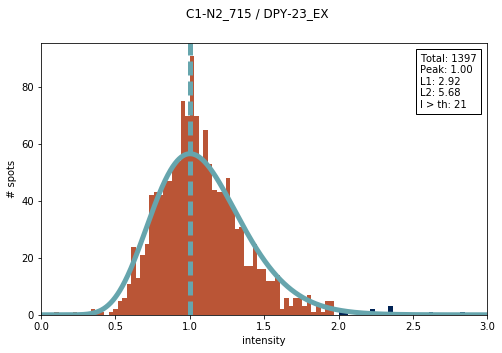

error: L1, L2 [3.3214457967079669, 6.2120860151789685]
peak center: 1.0


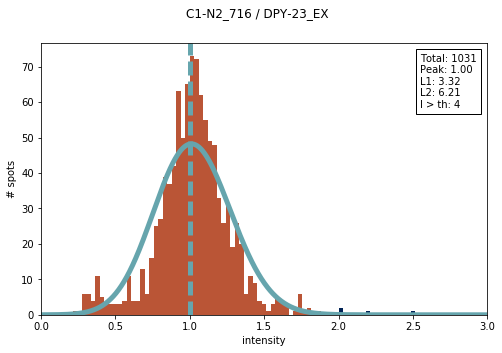

error: L1, L2 [3.3245679130444223, 7.9417742633775319]
peak center: 1.0


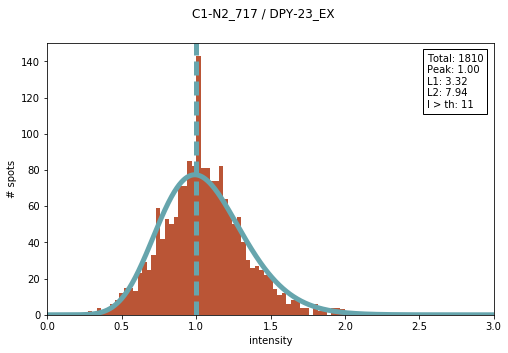

error: L1, L2 [3.8302358845616693, 5.3003772938221374]
peak center: 1.0303030303


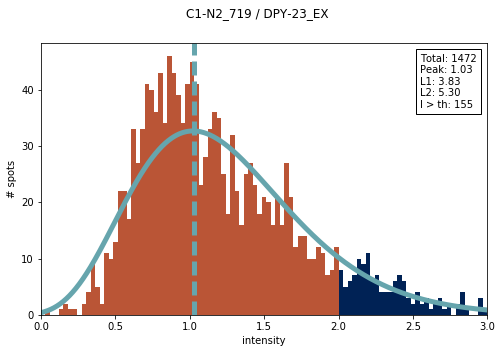

error: L1, L2 [6.6727616206668445, 11.750289701709807]
peak center: 0.969696969697


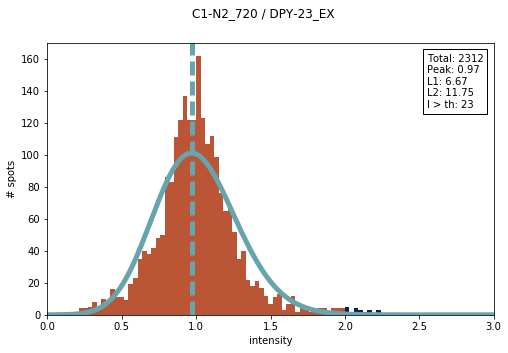

error: L1, L2 [2.4391013489138178, 4.8068678816965953]
peak center: 1.0


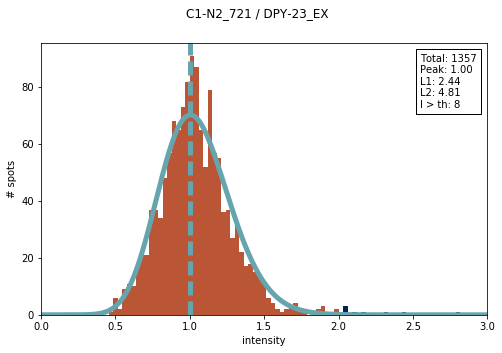

error: L1, L2 [15.229372220340936, 23.668823981105238]
peak center: 0.515151515152


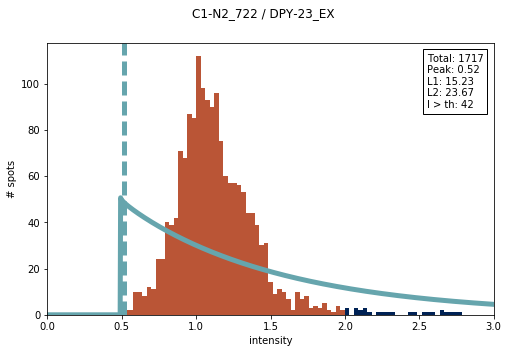

error: L1, L2 [5.6307994856822727, 9.781754547544022]
peak center: 1.0


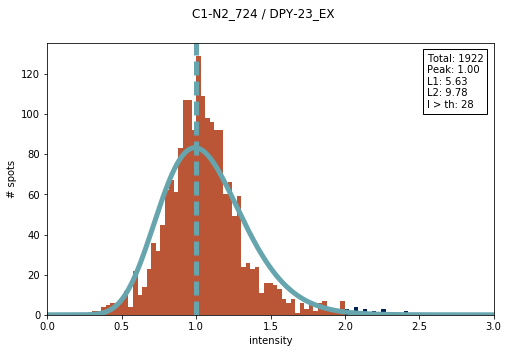

error: L1, L2 [2.3856562319485097, 5.0599203861456212]
peak center: 1.0303030303


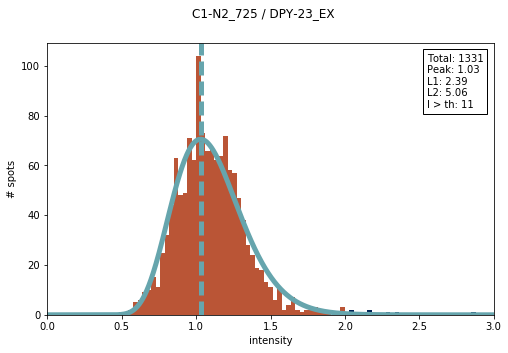

error: L1, L2 [3.3128872856877054, 5.6437542999673047]
peak center: 0.909090909091


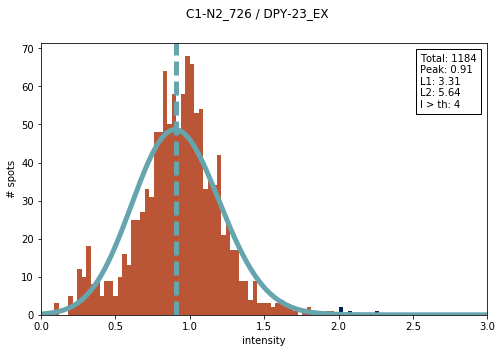

error: L1, L2 [4.2077845607640585, 8.2972319051927457]
peak center: 0.969696969697


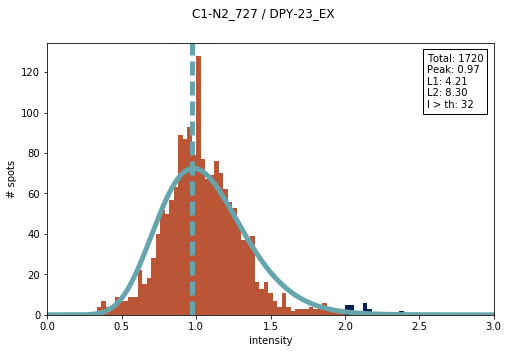

error: L1, L2 [3.024072673318785, 6.2766989333772631]
peak center: 0.969696969697


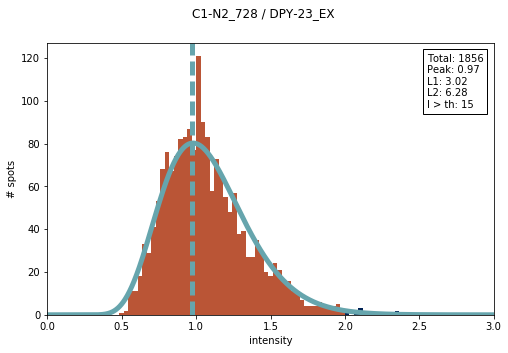

error: L1, L2 [2.5996211434417154, 4.5134485544976819]
peak center: 1.0303030303


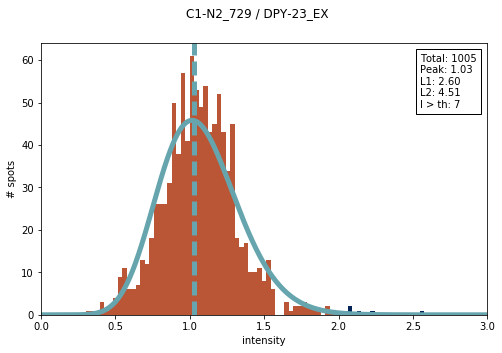

error: L1, L2 [5.1851827636424819, 10.105147148677515]
peak center: 1.0


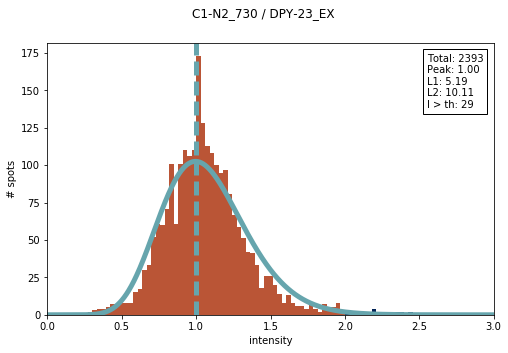

error: L1, L2 [5.1453774848991927, 9.7298690612672942]
peak center: 1.0


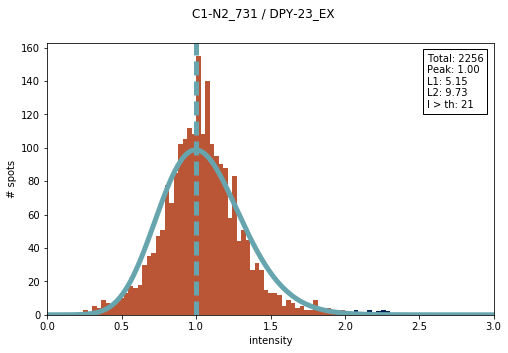

error: L1, L2 [2.4758294062775192, 4.9840803855726721]
peak center: 1.0


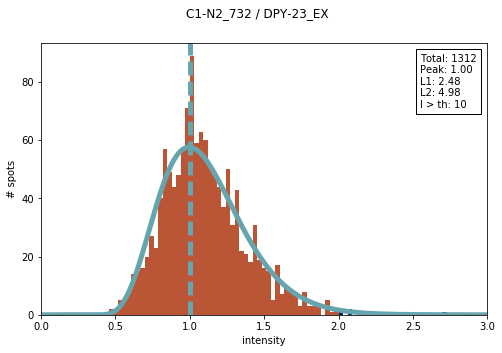

error: L1, L2 [3.6386010061902523, 7.8856582557823511]
peak center: 0.818181818182


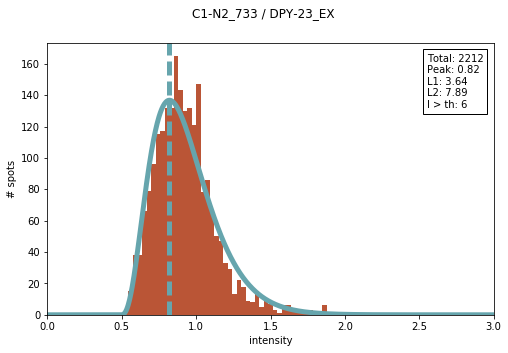

error: L1, L2 [4.1850052117178107, 8.6770896018843011]
peak center: 1.0


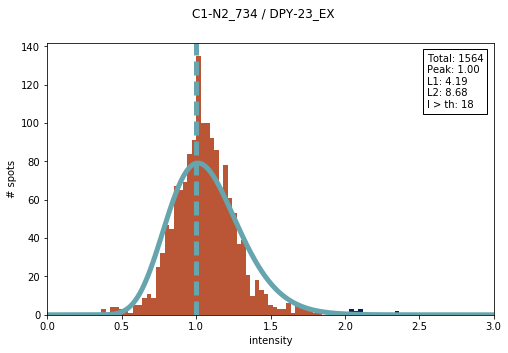

error: L1, L2 [13.646124368812409, 30.458120211777416]
peak center: 0.666666666667


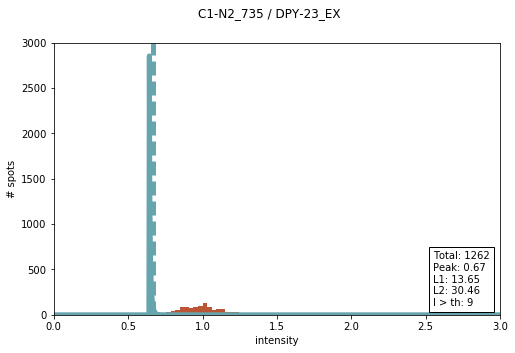

error: L1, L2 [3.8765067857620146, 7.4386791481181049]
peak center: 1.0


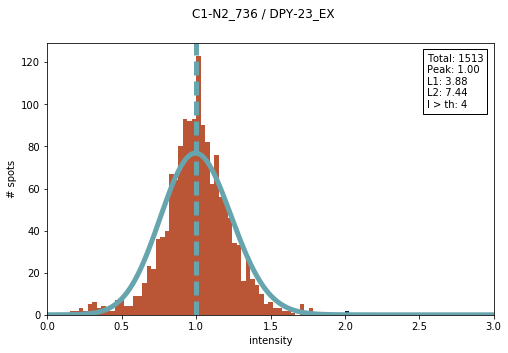

error: L1, L2 [6.0429923452152137, 10.510994800842028]
peak center: 1.12121212121


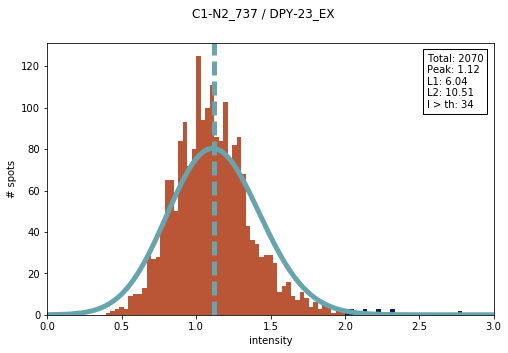

error: L1, L2 [3.3819202717433932, 6.1571787456801736]
peak center: 1.0303030303


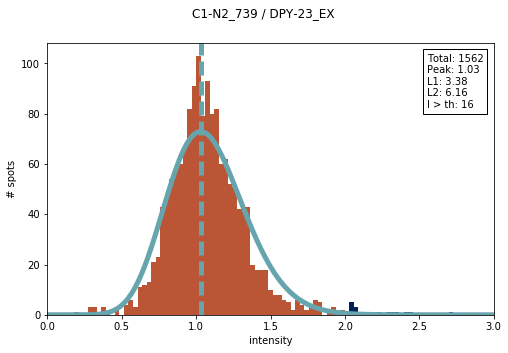

error: L1, L2 [4.6162677225547624, 7.5780293044667566]
peak center: 0.969696969697


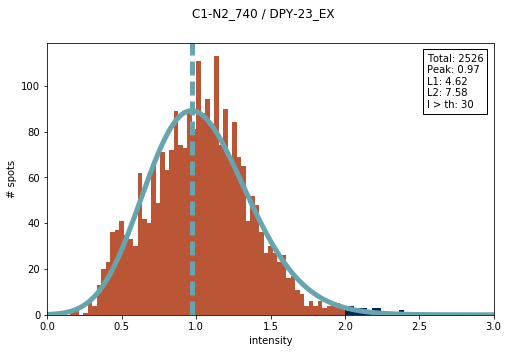

error: L1, L2 [3.3276177411006076, 5.6957752937358332]
peak center: 1.0


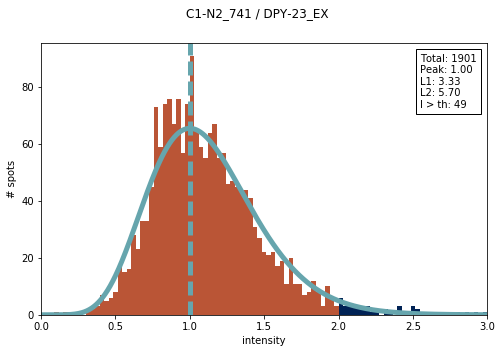

error: L1, L2 [3.7946405373429553, 7.875836476322152]
peak center: 1.0


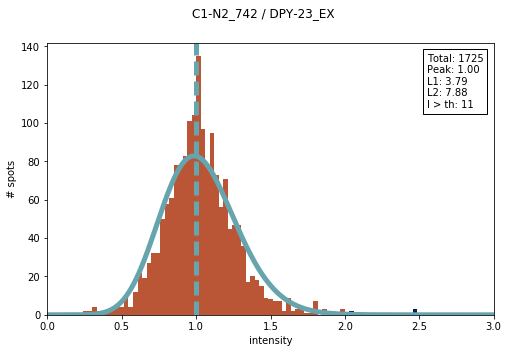

error: L1, L2 [3.7113097523387761, 7.1115821452242907]
peak center: 1.0


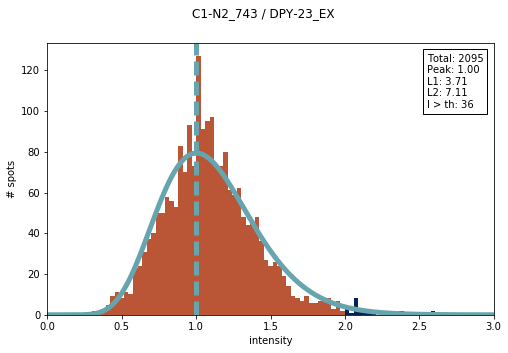

error: L1, L2 [5.3450208685977607, 10.03199681924718]
peak center: 1.0


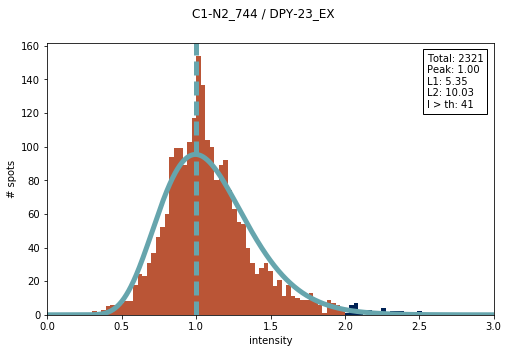

error: L1, L2 [3.5760356283332047, 7.6766908800666966]
peak center: 0.939393939394


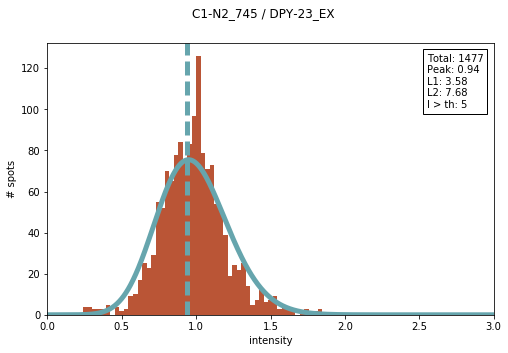

error: L1, L2 [5.9669522517622315, 9.880112776404804]
peak center: 1.0303030303


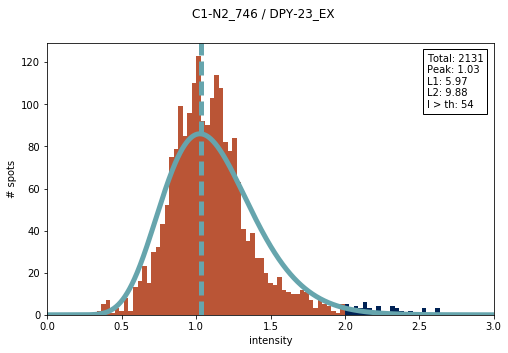

error: L1, L2 [4.2666205003335174, 8.1677685220952281]
peak center: 1.0303030303


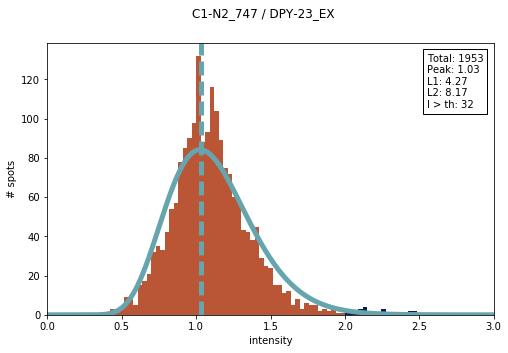

error: L1, L2 [3.5843724243315354, 7.9793474552243495]
peak center: 0.969696969697


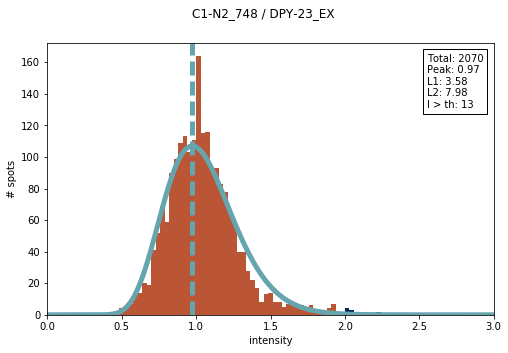

error: L1, L2 [6.8870493515505551, 12.582835211324623]
peak center: 1.0


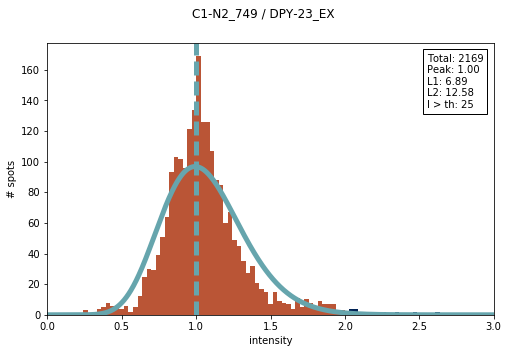

error: L1, L2 [3.4001261821861366, 6.116794270631412]
peak center: 1.0303030303


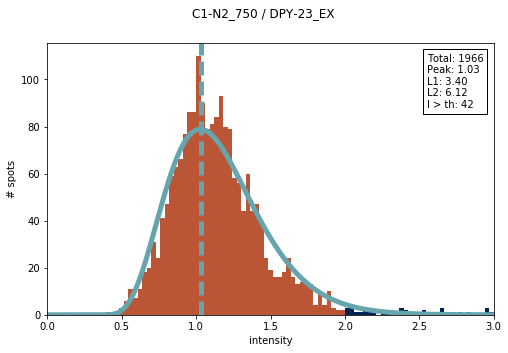

error: L1, L2 [5.345184401664997, 10.02381949212525]
peak center: 1.0


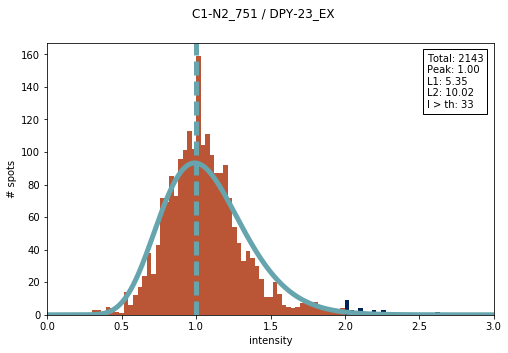

error: L1, L2 [5.52961520157581, 11.66742055632171]
peak center: 1.0


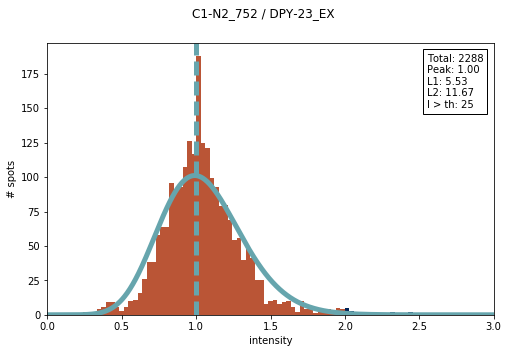

error: L1, L2 [2.4372918622149697, 4.4287154297913007]
peak center: 1.0303030303


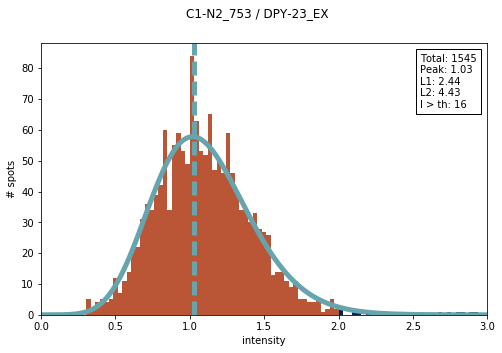

error: L1, L2 [2.252527813777927, 3.726357008151953]
peak center: 1.06060606061


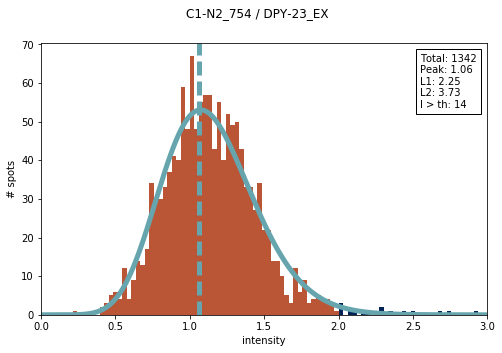

error: L1, L2 [3.622459101148011, 6.6573933368082781]
peak center: 1.0


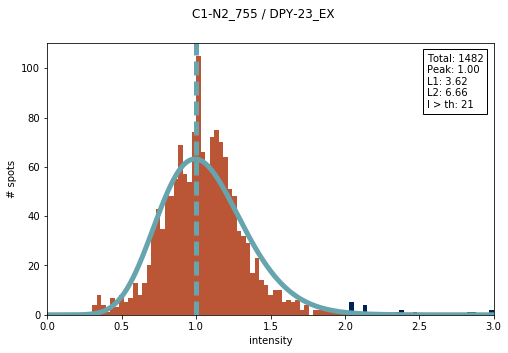

error: L1, L2 [2.9288587213445245, 5.3870103361926267]
peak center: 1.0


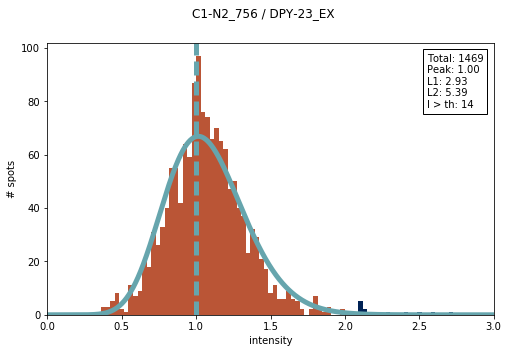

error: L1, L2 [4.5726274642788818, 7.6296308877831462]
peak center: 1.0303030303


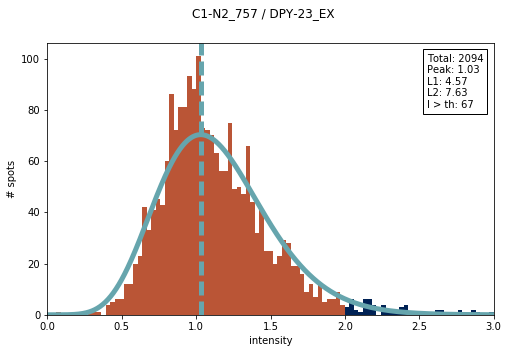

error: L1, L2 [2.9411427942540591, 6.3616828187821364]
peak center: 1.0


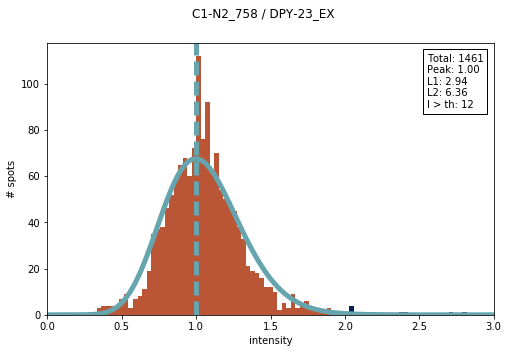

error: L1, L2 [4.1901367592434102, 8.8720262259803597]
peak center: 0.939393939394


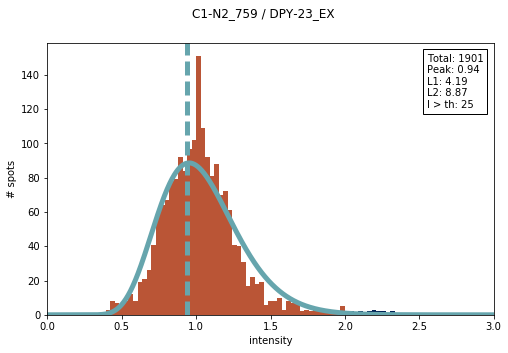

error: L1, L2 [5.1872291535740525, 10.294440043888882]
peak center: 0.969696969697


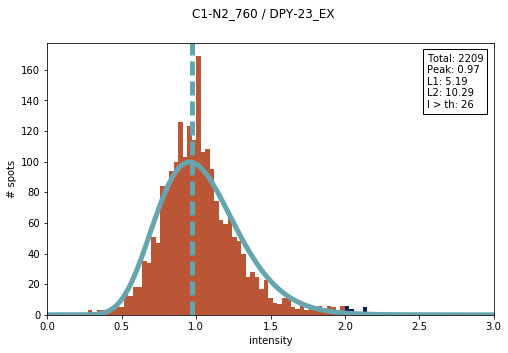

error: L1, L2 [1.9546409510426446, 3.6349314454617798]
peak center: 1.0


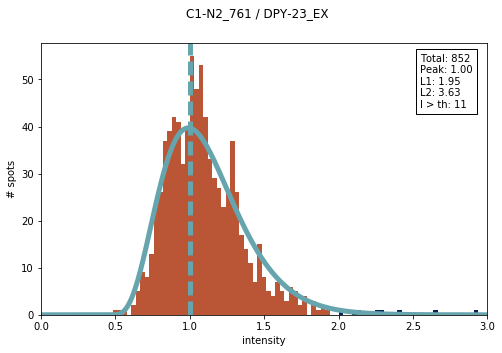

error: L1, L2 [2.1964971335093031, 3.8776144755465891]
peak center: 0.939393939394


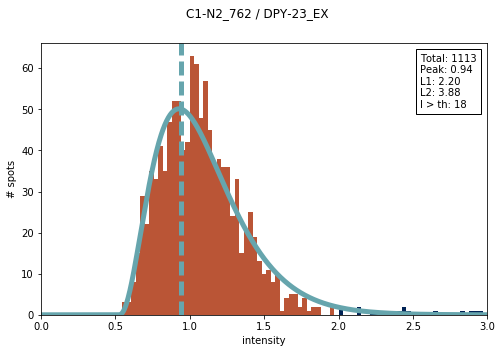

error: L1, L2 [2.5701935145278099, 4.3473800560495111]
peak center: 1.0


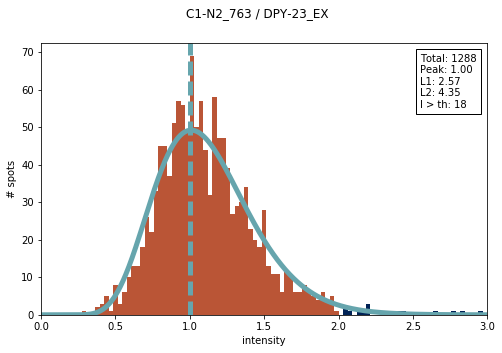

error: L1, L2 [3.5718257195269154, 6.7100641529135263]
peak center: 0.969696969697


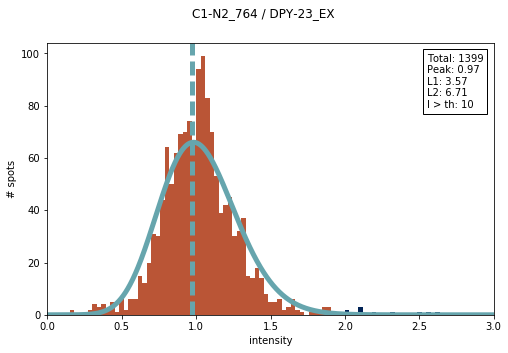

error: L1, L2 [13.002482386925848, 20.285982675220019]
peak center: 0.454545454545


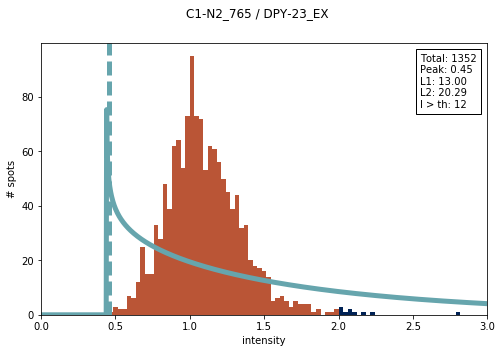

error: L1, L2 [3.5468630353426951, 6.2108027058321253]
peak center: 1.0303030303


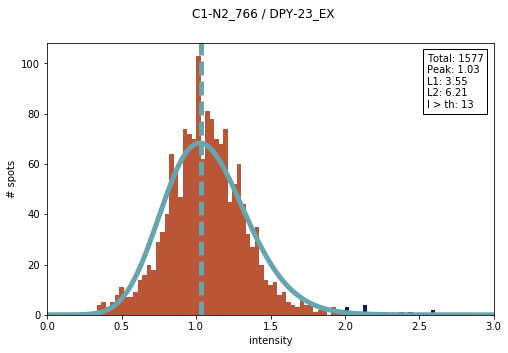

error: L1, L2 [2.9369952588437069, 6.4472864467739175]
peak center: 0.969696969697


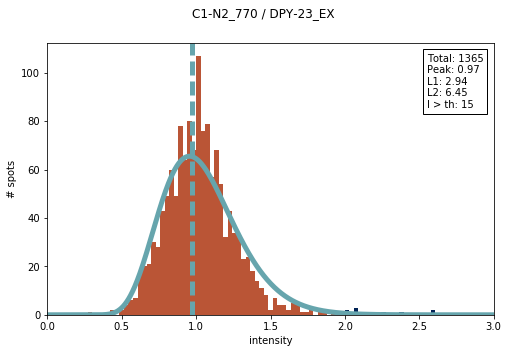

error: L1, L2 [5.0962890062106778, 9.3421352592763611]
peak center: 1.0303030303


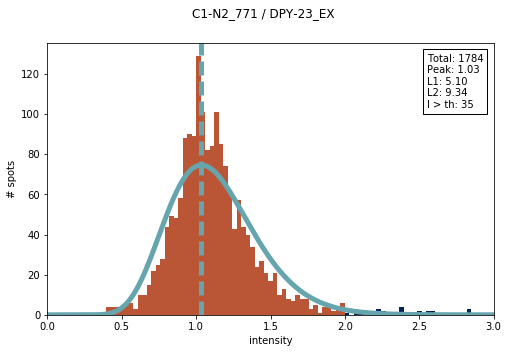

error: L1, L2 [3.8639543909002936, 6.7183737762002069]
peak center: 1.0


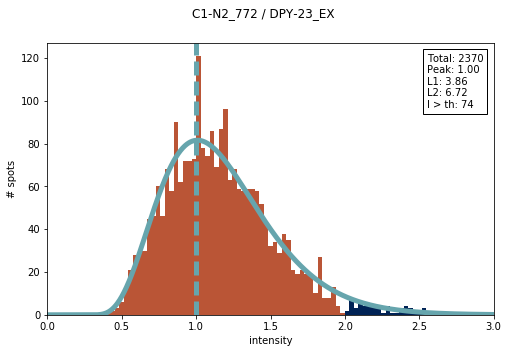

error: L1, L2 [2.9738454972665855, 5.8948941505110461]
peak center: 0.969696969697


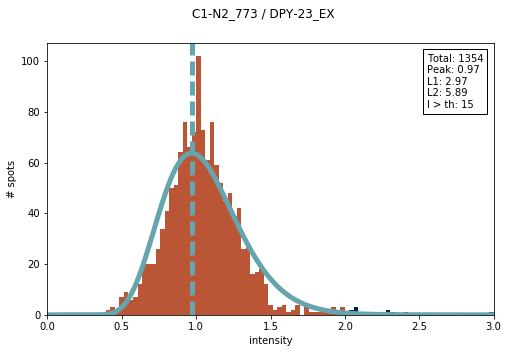

error: L1, L2 [3.1541772687973157, 4.7785522827230213]
peak center: 1.0


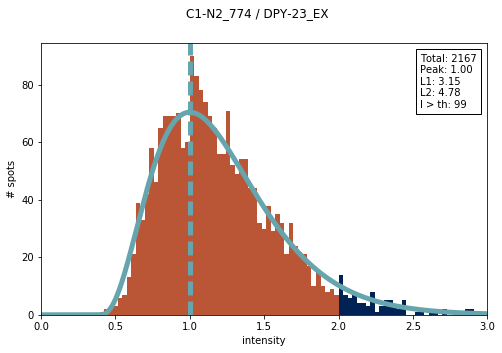

error: L1, L2 [5.3794638391710494, 9.2414554310751793]
peak center: 0.969696969697


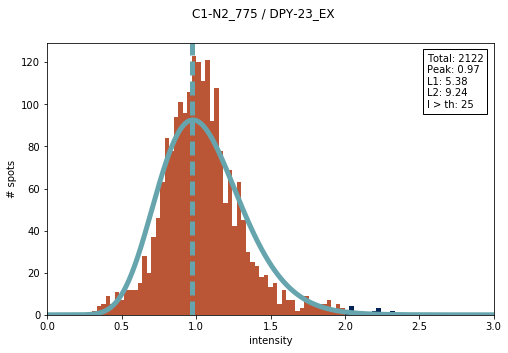

error: L1, L2 [3.6803895910069131, 6.2815496592650417]
peak center: 1.0303030303


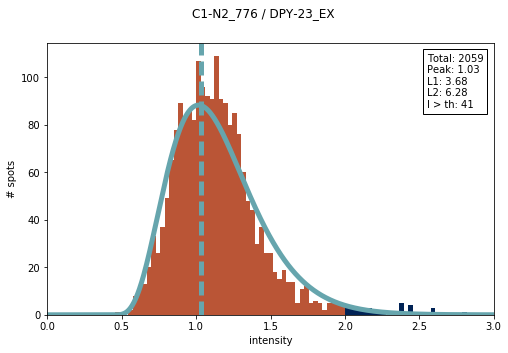

error: L1, L2 [4.2295979033203279, 7.6103822576957008]
peak center: 1.0


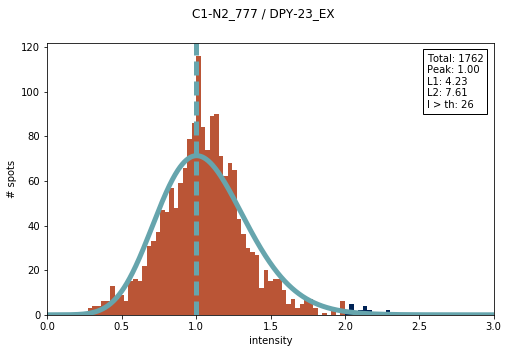

error: L1, L2 [3.3837232990209727, 5.8746018537297315]
peak center: 1.0


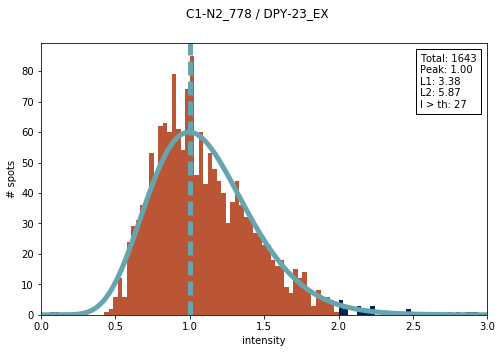

error: L1, L2 [3.0319992190743168, 6.1809555006845676]
peak center: 1.0303030303


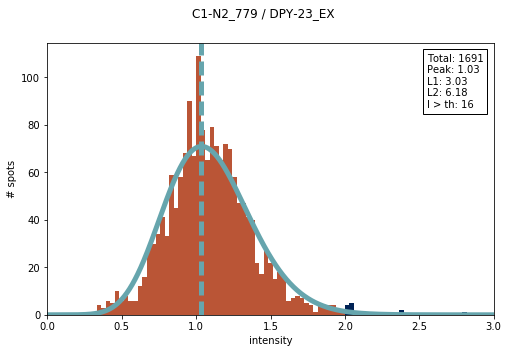

error: L1, L2 [3.3814955639253612, 4.9305225101241614]
peak center: 1.0303030303


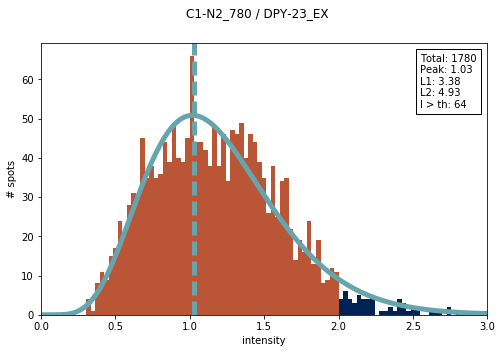

error: L1, L2 [1.8360183532063783, 4.2136035501561091]
peak center: 0.69696969697


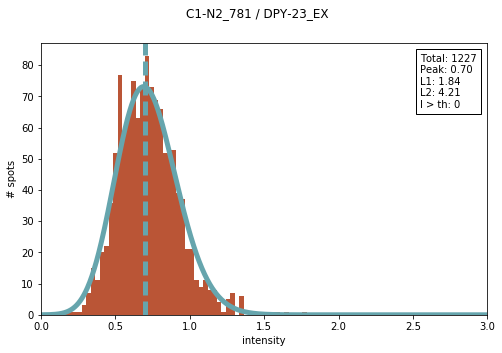

error: L1, L2 [3.0068645097937257, 5.091802430205048]
peak center: 0.969696969697


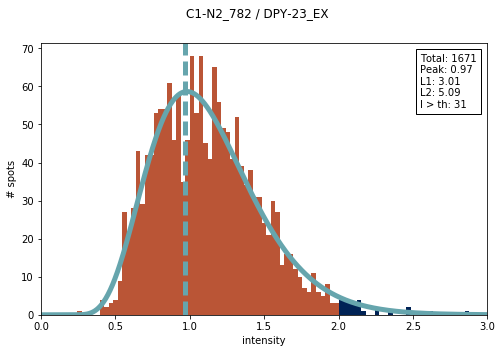

error: L1, L2 [2.391460679194604, 4.2066281931740939]
peak center: 1.0


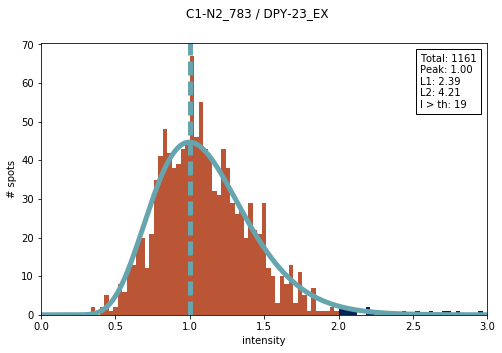

error: L1, L2 [2.7968025445286671, 5.0154441762582316]
peak center: 1.06060606061


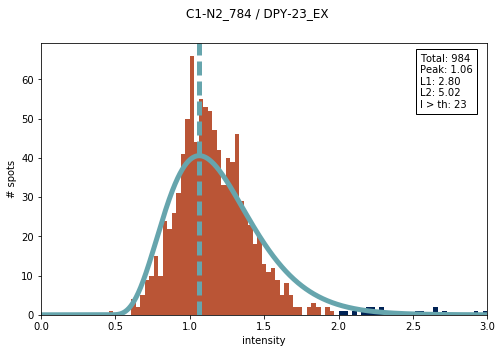

error: L1, L2 [3.0242921181740341, 5.9059486961247742]
peak center: 1.0303030303


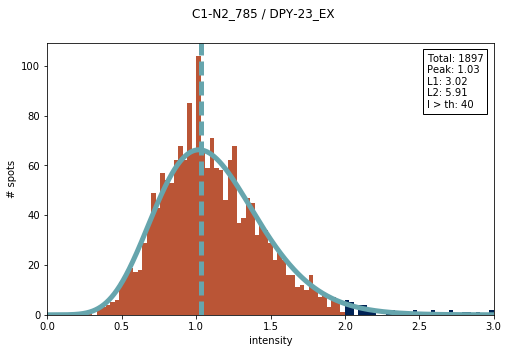

error: L1, L2 [4.7879835686171406, 9.0095649778354048]
peak center: 0.969696969697


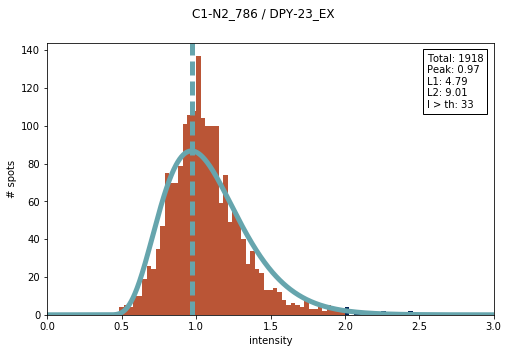

error: L1, L2 [2.0165979111514716, 3.6999299840788797]
peak center: 1.0303030303


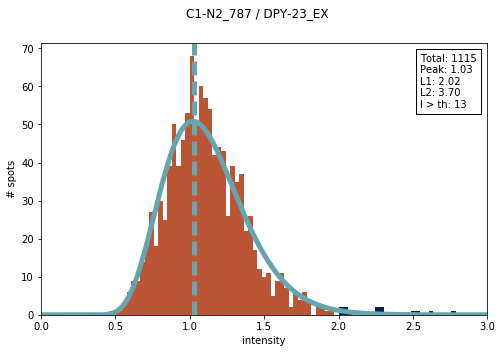

error: L1, L2 [2.7510895363201406, 5.1535403625209817]
peak center: 1.06060606061


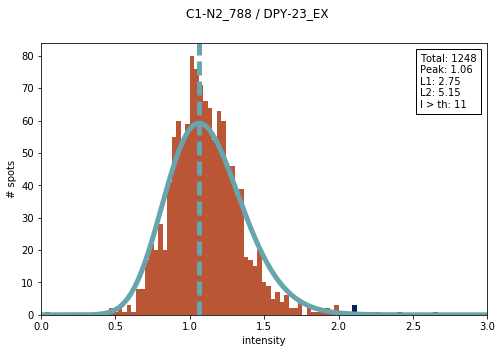

error: L1, L2 [3.1204830554299878, 6.0940062884310011]
peak center: 1.0


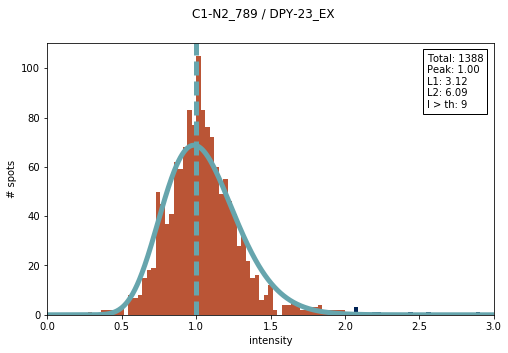

error: L1, L2 [3.6315183683708288, 6.5816994028636877]
peak center: 1.0


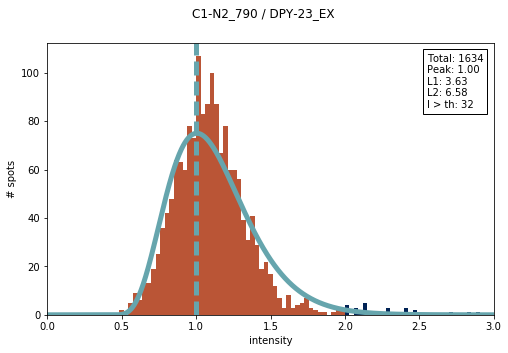

error: L1, L2 [8.3490327876828605, 13.092942505570885]
peak center: 0.757575757576


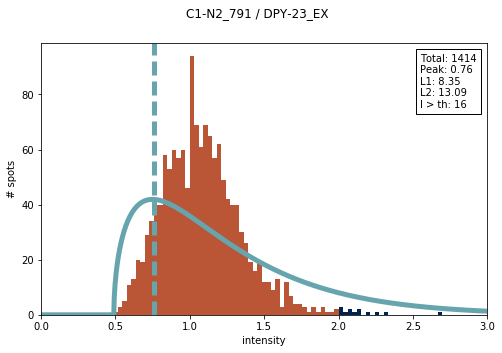

error: L1, L2 [2.7163408577872006, 4.6958736120159426]
peak center: 0.909090909091


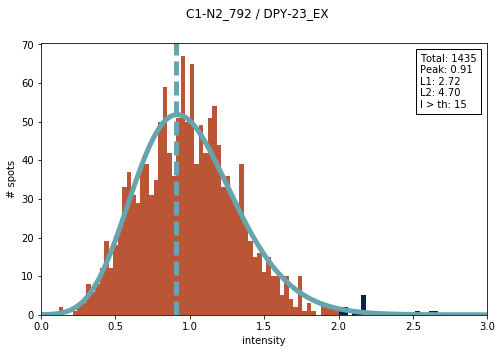

error: L1, L2 [3.751032006204265, 6.6619106353911404]
peak center: 1.0


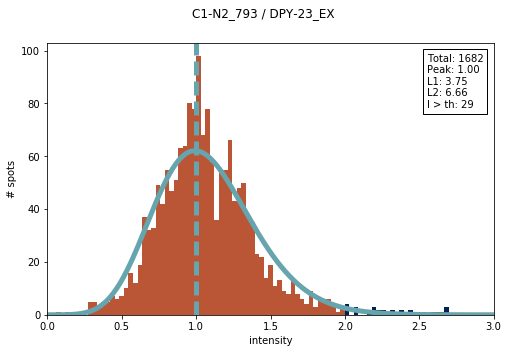

error: L1, L2 [2.5230482848887568, 4.8728332690564642]
peak center: 0.969696969697


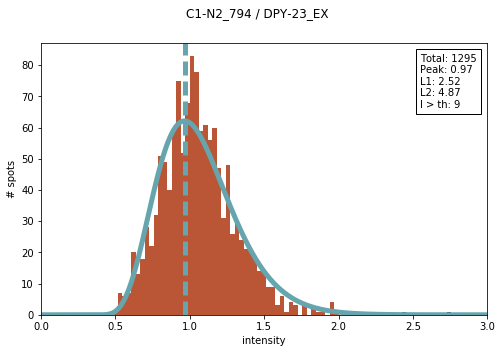

error: L1, L2 [3.6849786598527694, 6.363403168728011]
peak center: 1.0303030303


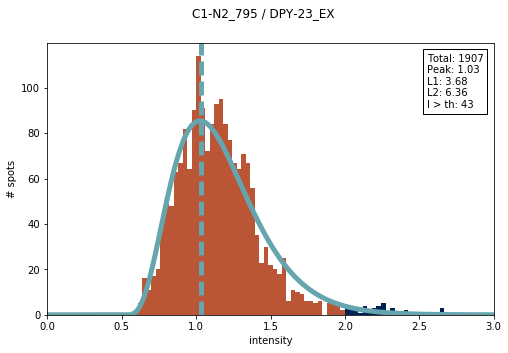

error: L1, L2 [3.5500854026916122, 7.388368447930028]
peak center: 1.0


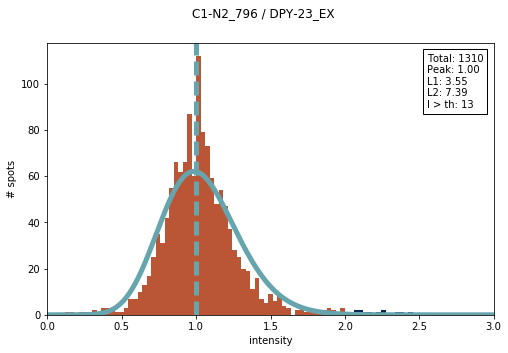

error: L1, L2 [4.7925604447449617, 8.5190903004270275]
peak center: 1.0


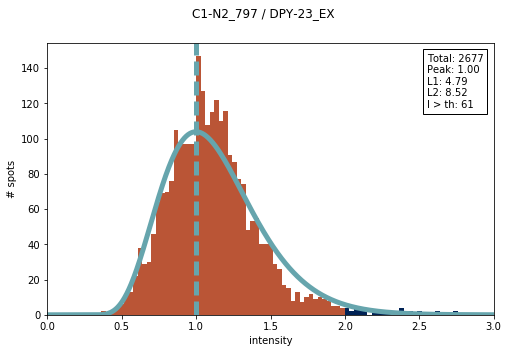

error: L1, L2 [3.4549879061128972, 7.0364594281682429]
peak center: 0.969696969697


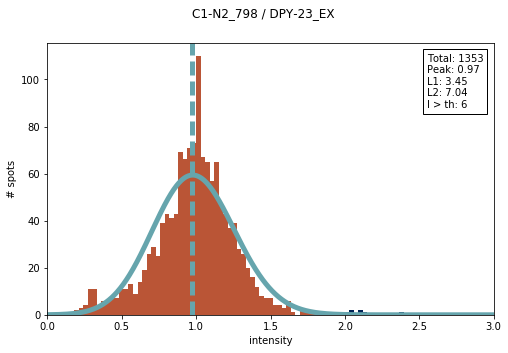

error: L1, L2 [3.5037300954406221, 6.8704015140802239]
peak center: 1.0


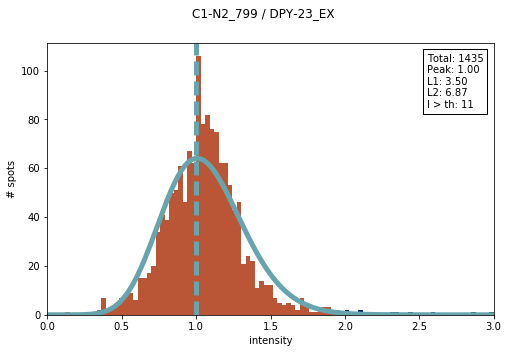

error: L1, L2 [4.4410151863823026, 9.0657496559632307]
peak center: 0.969696969697


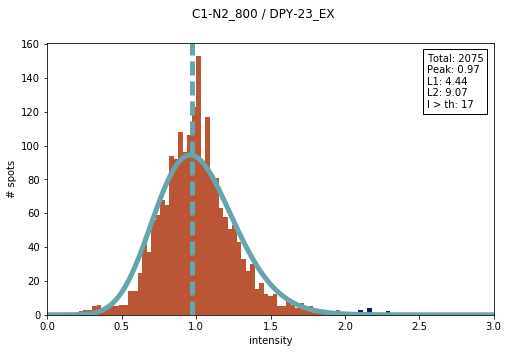

In [ ]:
# have to perform this step multiple times and choose the best one 
# perform n_fits with different initial parameters
# n_fits = 10

folder_path = folder + "histograms-2/" + labels[0] + "/"

# actual plotting 
for idx in range(0, len(dataset)):    
    if(not os.path.exists(dataset[idx])):
        # print("doesn't exist")
        continue
        
    try:
        # create the canvas
        fig = plt.figure(figsize=(8,5))
        title = create_title(dataset[idx], name_id=-1)
        fig.suptitle(title + " / " + labels[0])

        # load the data and scale it accordingly
        I = load_data(dataset[idx], skiprows_=0)

        # some const params for all graphs
        # num_bins = 100; 
        # graph [xmin, xmax]
        # xmin = np.min(I)
        # xmax = np.max(I)
        # binwidth = (xmax - xmin)/(num_bins - 1)
        # bins = np.arange(xmin, xmax + binwidth, binwidth)

        I_res = I
        # calculate the params for gauss fit
        binned_values, real_bins = np.histogram(I, bins)
        use_median = np.median(I_res)
        # inititally there was use_median/2 
        fit_alpha, fit_loc, fit_beta = gamma.fit(I_res, loc=use_median/2, scale=1/np.max(binned_values))
        # normalization factor
        factor = np.sum(binned_values*np.diff(real_bins))

        n_hist, bins_hist, patches_hist = plt.hist(I, bins=bins, color=color, label=labels, normed=False)

        # custom coloring of the last images
        intensity_th = 2
        for i in range(0, len(bins) - 1):
            if (bins[i] >= intensity_th):
                patches_hist[i].set_facecolor("#002255")
        total_I_above_threshold = np.sum(I > intensity_th)
        
        x = np.linspace(xmin, xmax, 1000)
        y = gamma.pdf(x, fit_alpha, fit_loc, fit_beta)*factor
        plt.plot(x,y, linewidth=5, color='#66A5AD')
        yhat = gamma.pdf(real_bins, fit_alpha, fit_loc, fit_beta)*factor

        # vertical line for center
        plt.axvline(x=real_bins[np.argmax(yhat)], linestyle="--", linewidth=5, color='#66A5AD')

        if (np.any(np.isnan(yhat))):
            continue

        error = fitter_meter(binned_values, yhat[:-1])

        print("error: L1, L2", error)
        print("peak center:", real_bins[np.argmax(yhat)])

        # reasonable adjustments to make the data look nicer
        plt.xlabel('intensity')
        plt.ylabel('# spots')

        # info_text = "Total: " + str(I.shape[0]) + "\n" + "Peak: " +  str('%.2f' % real_bins[np.argmax(yhat)]) + "\n" + "L1: " + str('%.2f' % error[0]) + "\n" + "L2: " +  str('%.2f' % error[1]) 
        info_text = get_info(I.shape[0], real_bins[np.argmax(yhat)], error[0], error[1], total_I_above_threshold)
        
        x_limits = [xmin, xmax]
        ymax = np.max(np.histogram(I, bins)[0])
        y_limits = [0, ymax]

        plt.text(x_limits[1] - (x_limits[1] - x_limits[0])*0.15, y_limits[1]*0.8, info_text, color='black', bbox=dict(facecolor='white', alpha=1))
        plt.xlim(x_limits)

        # save the peak values for further 
        if not os.path.exists(folder_path):
            os.makedirs(folder_path)
        plt.savefig(folder_path + title + ".pdf") 
        plt.show()
    except(RuntimeError, ValueError, TypeError):
        print("There was an exception but we\'ll fix it for you")
    # break

/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/total-2/DPY-23_EX/
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_16.csv
error: 0.030303030303 ; center: 0.969696969697
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_17.csv
error: 0.030303030303 ; center: 0.969696969697
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_25.csv
error: 0.0606060606061 ; center: 0.939393939394
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_27.csv
error: 0.030303030303 ; center: 0.969696969697
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_29.csv
error: 0.0 ; center: 1.0
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_62.csv
error: 0.030303030303 ; center: 0.969696969697
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_63.csv
error: 0.0 ; center: 1.0
/Users/kkolyva/Desktop/201

/Users/kkolyva/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:31: RuntimeWarning: divide by zero encountered in long_scalars
/Users/kkolyva/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:527: RuntimeWarning: invalid value encountered in subtract
  if (numpy.max(numpy.ravel(numpy.abs(sim[1:] - sim[0]))) <= xatol and
/Users/kkolyva/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:532: RuntimeWarning: invalid value encountered in subtract
  xr = (1 + rho) * xbar - rho * sim[-1]
/Users/kkolyva/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:872: RuntimeWarning: invalid value encountered in greater_equal
  return (self.a <= x) & (x <= self.b)
/Users/kkolyva/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:872: RuntimeWarning: invalid value encountered in less_equal
  return (self.a <= x) & (x <= self.b)
/Users/kkolyva/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py:574: Runti

error: 0.030303030303 ; center: 0.969696969697
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_346.csv
error: 0.030303030303 ; center: 0.969696969697
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_347.csv
error: 0.0 ; center: 1.0
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_348.csv
error: 0.030303030303 ; center: 0.969696969697
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_349.csv
error: 0.030303030303 ; center: 0.969696969697
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_350.csv
error: 0.0606060606061 ; center: 1.06060606061
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_352.csv
error: 0.0 ; center: 1.0
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_353.csv
error: 0.0606060606061 ; center: 0.939393939394
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-

/Users/kkolyva/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1654: RuntimeWarning: invalid value encountered in true_divide
  place(output, cond, self._pdf(*goodargs) / scale)


error: 0.0 ; center: 1.0
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_393.csv
error: 0.030303030303 ; center: 1.0303030303
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_394.csv
error: 0.030303030303 ; center: 1.0303030303
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_395.csv
error: 0.0606060606061 ; center: 1.06060606061
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_447.csv
error: 0.030303030303 ; center: 1.0303030303
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_448.csv
error: 0.0 ; center: 1.0
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_449.csv
error: 0.030303030303 ; center: 0.969696969697
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_451.csv
error: 0.0606060606061 ; center: 0.939393939394
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-togeth

/Users/kkolyva/anaconda3/lib/python3.6/site-packages/numpy/lib/npyio.py:893: UserWarning: loadtxt: Empty input file: "/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_563.csv"
  warnings.warn('loadtxt: Empty input file: "%s"' % fname)
/Users/kkolyva/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:408: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


error: 0.0 ; center: 1.0
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_565.csv
error: 0.0 ; center: 1.0
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_566.csv
error: 0.0 ; center: 1.0
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_567.csv
error: 0.121212121212 ; center: 0.878787878788
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_568.csv
error: 0.030303030303 ; center: 0.969696969697
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_569.csv
error: 0.030303030303 ; center: 0.969696969697
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_570.csv
error: 0.0 ; center: 1.0
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_571.csv
error: 0.030303030303 ; center: 1.0303030303
/Users/kkolyva/Desktop/2018-07-31-09-53-32-N2-all-results-together/csv-2/C1-N2_572.csv
error: 0.030303030

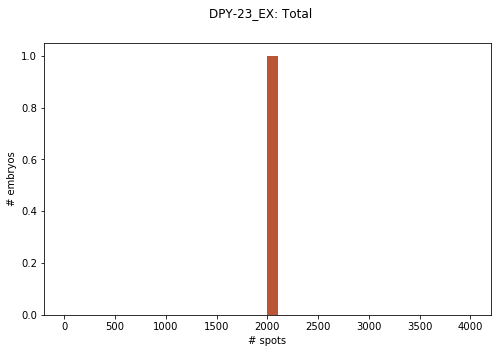

DOGE!


In [25]:
# make the plot with the total number of the detections
folder_path = folder + "total-2/" + labels[0] + "/"
print(folder_path)

result_set = {}

# actual plotting 
for idx in range(0, len(dataset)):    
    if(not os.path.exists(dataset[idx])):
        # print("doesn't exist")
        continue
   
    try:
        print(dataset[idx])

        # load the data and scale it accordingly
        I = load_data(dataset[idx])
        I_res = I

        # some const params for all graphs
        num_bins = 100; 
        # graph [xmin, xmax]
        xmin = 0
        xmax = 3
        binwidth = (xmax - xmin)/(num_bins - 1)
        bins = np.arange(xmin, xmax + binwidth, binwidth)

        binned_values, real_bins = np.histogram(I_res, bins)
        use_median = np.median(I_res)
        # inititally there was use_median/2 
        fit_alpha, fit_loc, fit_beta = gamma.fit(I_res, loc=use_median/2, scale=1/np.max(binned_values))
        # normalization factor
        factor = np.sum(binned_values*np.diff(real_bins))
        x = np.linspace(xmin, xmax, 1000)
        y = gamma.pdf(x, fit_alpha, fit_loc, fit_beta)*factor
        yhat = gamma.pdf(real_bins, fit_alpha, fit_loc, fit_beta)*factor

        if (np.any(np.isnan(yhat))):
            continue

        # should be close to 1
        x_center = real_bins[np.argmax(yhat)]

        # error less than 15%
        print ("error:", np.abs(x_center - 1), "; center:", x_center)
        if (np.abs(x_center - 1) < 0.15):    
            title = create_title(dataset[idx], name_id=5)
            result_set[title] = len(I)   
    except(RuntimeError, TypeError, ValueError, StopIteration):
        print("There was an exception but we\'ll fix it for you")
            
print(list(result_set.values()))        
        
# these are subject to change
xmin = 0
xmax = 4000
binwidth = 100
num_bins = (xmax - xmin) / binwidth + 1;
bins = np.arange(xmin, xmax + binwidth, binwidth)
xlimits = [xmin, xmax]

spots_total = list(result_set.values())

fig = plt.figure(figsize=(8,5))
fig.suptitle(labels[0] + ": Total")
plt.hist(spots_total, bins=bins, color=color, label=labels, normed=False)

plt.xlabel("# spots")
plt.ylabel("# embryos")

df_center = pd.DataFrame(list(result_set.items()), columns=['filename', 'total'])
if not os.path.exists(folder_path):
    os.makedirs(folder_path )
df_center.to_csv(folder_path + labels[0] +"-total.csv", index=False, header=True, encoding='utf-8', mode = 'w' )
plt.savefig(folder_path + labels[0] + "-total.pdf") 
plt.show()
        
print ("DOGE!")  